In [1]:
 ### Prepare module structure ###

import sys
sys.path.append("../")

In [2]:
### IMPORT ###

import numpy as np
import math
import pandas as pd

import torch
import torch.nn as nn
import torch.optim as optim

import time
from tqdm import tqdm_notebook

import matplotlib.pyplot as plt
%matplotlib inline

from util import *
from data import *
import models

import pickle

# auto reload imports on local changes
%load_ext autoreload
%autoreload 2
print(torch.__version__)

1.0.0


In [3]:
### Check device ###

USE_GPU = True

dtype = torch.float32

if USE_GPU and torch.cuda.is_available():
    # TODO: Change to CPU used!
    device = torch.device('cuda:1')
else:
    device = torch.device('cpu')

print('using device:', device)

using device: cuda:1


In [4]:
### LOAD DATA ###

from torch.utils.data.sampler import SubsetRandomSampler

dataset = 'fashion'

dataloader, imsize = load(dataset, path='/home/shared/phase-retrieval/data/' + dataset, batch_size=32)

fashion


In [5]:
def calc_mags(x):
    ft =  torch.rfft(x, 2, onesided=False)
    mags = torch.sqrt(torch.sum(ft ** 2, -1) + 1e-16)
    return mags

# Function to compute test images
def test_generator(model, device, testloader):
    # put model to eval mode
    model = model.to(device=device)
    model.eval()

    # move test images to device and reduce to magnitude information in fourier space
    test_images = []
    outputs = []
    
    for data in testloader:
        z = torch.randn(*data.shape).to(device)
        data = data.to(device=device)
        magn = calc_mags(data)
        net_input = torch.cat([z, magn], dim=1)
        ouput = model(net_input)

        test_images.append(data.cpu().numpy())
        outputs.append(ouput.cpu().detach().numpy())
    
    return np.concatenate(outputs), np.concatenate(test_images)

In [6]:
# Define Gen and Disc loss
def gen_loss(disc_gen, gen_output, x, lmd):
    reconstruction = torch.mean(torch.abs(x - gen_output))
    adversarial = -torch.mean(torch.log(disc_gen))
    return  adversarial + lmd * reconstruction

def disc_loss(disc_real, disc_gen):
    return -torch.mean((torch.log(disc_real) + torch.log(1 - disc_gen)) / 2.0)

In [7]:
def train_model(gen, disc, g_opt, d_opt, device, loader_train, epochs=1):

    # move the model parameters to CPU/GPU
    disc = disc.to(device=device)
    gen = gen.to(device=device)
    
    for e in range(epochs):
        for t, x in enumerate(loader_train):
            # move x to device and reduce to magnitude information in fourier space
            x = x.to(device=device)
            magnitudes = calc_mags(x)
            
            # stack magnitudes to noise / generator input
            z = torch.randn(*x.shape).to(device)
            zm = torch.cat([z, magnitudes], dim=1)
            
            # calc gen output
            gen.train()
            gen_output = gen(zm)
            
            # calc disc output for real and generated image
            xm = torch.cat([x, magnitudes], dim=1)
            disc.train()
            disc_output_real = disc(xm)
            disc_output_generated = disc(torch.cat([gen_output, magnitudes], dim=1))
            
            # calculate generator loss and update generator
            g_loss = gen_loss(disc_output_generated, gen(zm), x, lmd)
            g_opt.zero_grad()
            g_loss.backward(retain_graph=True)
            #torch.nn.utils.clip_grad_value_(gen.parameters(), 1e-1)
            g_opt.step()
           
            # calculate discriminator loss and update discriminator
            d_loss = disc_loss(disc_output_real, disc_output_generated)
            d_opt.zero_grad()
            d_loss.backward()
            #torch.nn.utils.clip_grad_value_(disc.parameters(), 1e-1)
            d_opt.step()

            if t % 100 == 0:
                print("epoch: {:2} \t step:{} \t loss: {:3.4}".format(e+1, t, g_loss.item()))
            
    return

In [8]:
### TRAIN MODEL ###

import time

num_epochs = 100
lmd = 1e2
train_sizes = [32, 64, 128, 256, 512, 1000, 2000, 5000, 10000, 30000, 60000]
epochs = [1000, 500, 300, 150, 75, 50, 50, 50, 50, 50, 50]
gen_sizes = [512, 1024, 2048]
disc_sizes = [16, 32, 64]

for ts, ep in zip(train_sizes, epochs):
    for gs, ds in zip(gen_sizes, disc_sizes):
        print("Start training with ts of", ts, "and gs of", gs)
        
        # new dataloader
        dataloader['train'] = torch.utils.data.DataLoader(dataloader['train'].dataset, batch_size=32, num_workers=1,
                                                          sampler=SubsetRandomSampler(np.arange(ts)))
        
        # Create new models
        gen = models.FCNet(imsize=(2, 28, 28), outsize=imsize, h=gs)
        disc = models.ConvDiscriminatorSmall(imsize=(2, 28, 28), s=ds)
        
        # Set training parameters
        g_opt = optim.Adam(gen.parameters(), lr=1e-4)
        d_opt = optim.Adam(disc.parameters(), lr=1e-4)
        
        # Train model
        train_model(gen, disc, g_opt, d_opt, device, dataloader['train'], epochs=ep)
        
        # Save model
        gen_weights = gen.state_dict().copy()
        disc_weights = disc.state_dict().copy()
        torch.save(gen_weights, "../cache/cGAN/FCGenerator{}Fashion_{}.sd".format(gs, ts))
        torch.save(disc_weights, "../cache/cGAN/ConvDiscriminator{}Fashion_{}.sd".format(ds, ts))

Start training with ts of 32 and gs of 512
Version 0.4
epoch:  1 	 step:0 	 loss: 38.54
epoch:  2 	 step:0 	 loss: 38.24
epoch:  3 	 step:0 	 loss: 37.94
epoch:  4 	 step:0 	 loss: 37.66
epoch:  5 	 step:0 	 loss: 37.4
epoch:  6 	 step:0 	 loss: 37.17
epoch:  7 	 step:0 	 loss: 36.92
epoch:  8 	 step:0 	 loss: 36.7
epoch:  9 	 step:0 	 loss: 36.48
epoch: 10 	 step:0 	 loss: 36.27
epoch: 11 	 step:0 	 loss: 36.06
epoch: 12 	 step:0 	 loss: 35.84
epoch: 13 	 step:0 	 loss: 35.64
epoch: 14 	 step:0 	 loss: 35.44
epoch: 15 	 step:0 	 loss: 35.22
epoch: 16 	 step:0 	 loss: 35.0
epoch: 17 	 step:0 	 loss: 34.8
epoch: 18 	 step:0 	 loss: 34.61
epoch: 19 	 step:0 	 loss: 34.4
epoch: 20 	 step:0 	 loss: 34.19
epoch: 21 	 step:0 	 loss: 33.98
epoch: 22 	 step:0 	 loss: 33.78
epoch: 23 	 step:0 	 loss: 33.57
epoch: 24 	 step:0 	 loss: 33.36
epoch: 25 	 step:0 	 loss: 33.17
epoch: 26 	 step:0 	 loss: 32.96
epoch: 27 	 step:0 	 loss: 32.75
epoch: 28 	 step:0 	 loss: 32.56
epoch: 29 	 step:0 	 loss:

epoch: 244 	 step:0 	 loss: 12.51
epoch: 245 	 step:0 	 loss: 12.22
epoch: 246 	 step:0 	 loss: 12.32
epoch: 247 	 step:0 	 loss: 12.3
epoch: 248 	 step:0 	 loss: 12.13
epoch: 249 	 step:0 	 loss: 12.31
epoch: 250 	 step:0 	 loss: 12.06
epoch: 251 	 step:0 	 loss: 12.15
epoch: 252 	 step:0 	 loss: 12.14
epoch: 253 	 step:0 	 loss: 11.97
epoch: 254 	 step:0 	 loss: 12.12
epoch: 255 	 step:0 	 loss: 11.92
epoch: 256 	 step:0 	 loss: 11.96
epoch: 257 	 step:0 	 loss: 11.97
epoch: 258 	 step:0 	 loss: 11.81
epoch: 259 	 step:0 	 loss: 11.95
epoch: 260 	 step:0 	 loss: 11.77
epoch: 261 	 step:0 	 loss: 11.81
epoch: 262 	 step:0 	 loss: 11.79
epoch: 263 	 step:0 	 loss: 11.68
epoch: 264 	 step:0 	 loss: 11.77
epoch: 265 	 step:0 	 loss: 11.61
epoch: 266 	 step:0 	 loss: 11.67
epoch: 267 	 step:0 	 loss: 11.62
epoch: 268 	 step:0 	 loss: 11.53
epoch: 269 	 step:0 	 loss: 11.61
epoch: 270 	 step:0 	 loss: 11.43
epoch: 271 	 step:0 	 loss: 11.57
epoch: 272 	 step:0 	 loss: 11.37
epoch: 273 	 st

epoch: 486 	 step:0 	 loss: 6.767
epoch: 487 	 step:0 	 loss: 6.569
epoch: 488 	 step:0 	 loss: 6.665
epoch: 489 	 step:0 	 loss: 6.613
epoch: 490 	 step:0 	 loss: 6.571
epoch: 491 	 step:0 	 loss: 6.642
epoch: 492 	 step:0 	 loss: 6.499
epoch: 493 	 step:0 	 loss: 6.654
epoch: 494 	 step:0 	 loss: 6.393
epoch: 495 	 step:0 	 loss: 6.683
epoch: 496 	 step:0 	 loss: 6.337
epoch: 497 	 step:0 	 loss: 6.663
epoch: 498 	 step:0 	 loss: 6.331
epoch: 499 	 step:0 	 loss: 6.535
epoch: 500 	 step:0 	 loss: 6.4
epoch: 501 	 step:0 	 loss: 6.376
epoch: 502 	 step:0 	 loss: 6.474
epoch: 503 	 step:0 	 loss: 6.269
epoch: 504 	 step:0 	 loss: 6.516
epoch: 505 	 step:0 	 loss: 6.183
epoch: 506 	 step:0 	 loss: 6.494
epoch: 507 	 step:0 	 loss: 6.171
epoch: 508 	 step:0 	 loss: 6.391
epoch: 509 	 step:0 	 loss: 6.235
epoch: 510 	 step:0 	 loss: 6.246
epoch: 511 	 step:0 	 loss: 6.339
epoch: 512 	 step:0 	 loss: 6.12
epoch: 513 	 step:0 	 loss: 6.382
epoch: 514 	 step:0 	 loss: 6.024
epoch: 515 	 step

epoch: 728 	 step:0 	 loss: 3.8
epoch: 729 	 step:0 	 loss: 3.684
epoch: 730 	 step:0 	 loss: 3.828
epoch: 731 	 step:0 	 loss: 3.621
epoch: 732 	 step:0 	 loss: 3.894
epoch: 733 	 step:0 	 loss: 3.535
epoch: 734 	 step:0 	 loss: 3.961
epoch: 735 	 step:0 	 loss: 3.473
epoch: 736 	 step:0 	 loss: 3.914
epoch: 737 	 step:0 	 loss: 3.535
epoch: 738 	 step:0 	 loss: 3.746
epoch: 739 	 step:0 	 loss: 3.69
epoch: 740 	 step:0 	 loss: 3.547
epoch: 741 	 step:0 	 loss: 3.829
epoch: 742 	 step:0 	 loss: 3.475
epoch: 743 	 step:0 	 loss: 3.807
epoch: 744 	 step:0 	 loss: 3.503
epoch: 745 	 step:0 	 loss: 3.684
epoch: 746 	 step:0 	 loss: 3.637
epoch: 747 	 step:0 	 loss: 3.529
epoch: 748 	 step:0 	 loss: 3.734
epoch: 749 	 step:0 	 loss: 3.444
epoch: 750 	 step:0 	 loss: 3.741
epoch: 751 	 step:0 	 loss: 3.457
epoch: 752 	 step:0 	 loss: 3.661
epoch: 753 	 step:0 	 loss: 3.538
epoch: 754 	 step:0 	 loss: 3.544
epoch: 755 	 step:0 	 loss: 3.616
epoch: 756 	 step:0 	 loss: 3.458
epoch: 757 	 step

epoch: 970 	 step:0 	 loss: 2.611
epoch: 971 	 step:0 	 loss: 2.379
epoch: 972 	 step:0 	 loss: 2.595
epoch: 973 	 step:0 	 loss: 2.387
epoch: 974 	 step:0 	 loss: 2.559
epoch: 975 	 step:0 	 loss: 2.433
epoch: 976 	 step:0 	 loss: 2.484
epoch: 977 	 step:0 	 loss: 2.468
epoch: 978 	 step:0 	 loss: 2.438
epoch: 979 	 step:0 	 loss: 2.5
epoch: 980 	 step:0 	 loss: 2.394
epoch: 981 	 step:0 	 loss: 2.551
epoch: 982 	 step:0 	 loss: 2.324
epoch: 983 	 step:0 	 loss: 2.606
epoch: 984 	 step:0 	 loss: 2.267
epoch: 985 	 step:0 	 loss: 2.654
epoch: 986 	 step:0 	 loss: 2.233
epoch: 987 	 step:0 	 loss: 2.627
epoch: 988 	 step:0 	 loss: 2.283
epoch: 989 	 step:0 	 loss: 2.503
epoch: 990 	 step:0 	 loss: 2.408
epoch: 991 	 step:0 	 loss: 2.356
epoch: 992 	 step:0 	 loss: 2.539
epoch: 993 	 step:0 	 loss: 2.248
epoch: 994 	 step:0 	 loss: 2.594
epoch: 995 	 step:0 	 loss: 2.258
epoch: 996 	 step:0 	 loss: 2.528
epoch: 997 	 step:0 	 loss: 2.335
epoch: 998 	 step:0 	 loss: 2.383
epoch: 999 	 ste

epoch: 213 	 step:0 	 loss: 7.894
epoch: 214 	 step:0 	 loss: 7.563
epoch: 215 	 step:0 	 loss: 7.742
epoch: 216 	 step:0 	 loss: 7.595
epoch: 217 	 step:0 	 loss: 7.556
epoch: 218 	 step:0 	 loss: 7.646
epoch: 219 	 step:0 	 loss: 7.388
epoch: 220 	 step:0 	 loss: 7.65
epoch: 221 	 step:0 	 loss: 7.264
epoch: 222 	 step:0 	 loss: 7.593
epoch: 223 	 step:0 	 loss: 7.238
epoch: 224 	 step:0 	 loss: 7.406
epoch: 225 	 step:0 	 loss: 7.323
epoch: 226 	 step:0 	 loss: 7.17
epoch: 227 	 step:0 	 loss: 7.399
epoch: 228 	 step:0 	 loss: 7.03
epoch: 229 	 step:0 	 loss: 7.34
epoch: 230 	 step:0 	 loss: 7.012
epoch: 231 	 step:0 	 loss: 7.157
epoch: 232 	 step:0 	 loss: 7.075
epoch: 233 	 step:0 	 loss: 6.963
epoch: 234 	 step:0 	 loss: 7.148
epoch: 235 	 step:0 	 loss: 6.807
epoch: 236 	 step:0 	 loss: 7.112
epoch: 237 	 step:0 	 loss: 6.77
epoch: 238 	 step:0 	 loss: 6.958
epoch: 239 	 step:0 	 loss: 6.853
epoch: 240 	 step:0 	 loss: 6.75
epoch: 241 	 step:0 	 loss: 6.913
epoch: 242 	 step:0 

epoch: 455 	 step:0 	 loss: 3.071
epoch: 456 	 step:0 	 loss: 2.66
epoch: 457 	 step:0 	 loss: 2.941
epoch: 458 	 step:0 	 loss: 2.779
epoch: 459 	 step:0 	 loss: 2.746
epoch: 460 	 step:0 	 loss: 2.92
epoch: 461 	 step:0 	 loss: 2.638
epoch: 462 	 step:0 	 loss: 2.964
epoch: 463 	 step:0 	 loss: 2.624
epoch: 464 	 step:0 	 loss: 2.886
epoch: 465 	 step:0 	 loss: 2.707
epoch: 466 	 step:0 	 loss: 2.753
epoch: 467 	 step:0 	 loss: 2.792
epoch: 468 	 step:0 	 loss: 2.633
epoch: 469 	 step:0 	 loss: 2.866
epoch: 470 	 step:0 	 loss: 2.562
epoch: 471 	 step:0 	 loss: 2.899
epoch: 472 	 step:0 	 loss: 2.52
epoch: 473 	 step:0 	 loss: 2.902
epoch: 474 	 step:0 	 loss: 2.527
epoch: 475 	 step:0 	 loss: 2.801
epoch: 476 	 step:0 	 loss: 2.603
epoch: 477 	 step:0 	 loss: 2.668
epoch: 478 	 step:0 	 loss: 2.677
epoch: 479 	 step:0 	 loss: 2.578
epoch: 480 	 step:0 	 loss: 2.753
epoch: 481 	 step:0 	 loss: 2.481
epoch: 482 	 step:0 	 loss: 2.847
epoch: 483 	 step:0 	 loss: 2.413
epoch: 484 	 step

epoch: 697 	 step:0 	 loss: 1.677
epoch: 698 	 step:0 	 loss: 1.579
epoch: 699 	 step:0 	 loss: 1.944
epoch: 700 	 step:0 	 loss: 1.535
epoch: 701 	 step:0 	 loss: 1.742
epoch: 702 	 step:0 	 loss: 1.803
epoch: 703 	 step:0 	 loss: 1.528
epoch: 704 	 step:0 	 loss: 1.866
epoch: 705 	 step:0 	 loss: 1.641
epoch: 706 	 step:0 	 loss: 1.626
epoch: 707 	 step:0 	 loss: 1.83
epoch: 708 	 step:0 	 loss: 1.554
epoch: 709 	 step:0 	 loss: 1.761
epoch: 710 	 step:0 	 loss: 1.703
epoch: 711 	 step:0 	 loss: 1.581
epoch: 712 	 step:0 	 loss: 1.816
epoch: 713 	 step:0 	 loss: 1.565
epoch: 714 	 step:0 	 loss: 1.711
epoch: 715 	 step:0 	 loss: 1.683
epoch: 716 	 step:0 	 loss: 1.593
epoch: 717 	 step:0 	 loss: 1.778
epoch: 718 	 step:0 	 loss: 1.567
epoch: 719 	 step:0 	 loss: 1.75
epoch: 720 	 step:0 	 loss: 1.617
epoch: 721 	 step:0 	 loss: 1.646
epoch: 722 	 step:0 	 loss: 1.709
epoch: 723 	 step:0 	 loss: 1.566
epoch: 724 	 step:0 	 loss: 1.756
epoch: 725 	 step:0 	 loss: 1.548
epoch: 726 	 ste

epoch: 939 	 step:0 	 loss: 1.463
epoch: 940 	 step:0 	 loss: 1.163
epoch: 941 	 step:0 	 loss: 1.415
epoch: 942 	 step:0 	 loss: 1.296
epoch: 943 	 step:0 	 loss: 1.253
epoch: 944 	 step:0 	 loss: 1.419
epoch: 945 	 step:0 	 loss: 1.198
epoch: 946 	 step:0 	 loss: 1.408
epoch: 947 	 step:0 	 loss: 1.271
epoch: 948 	 step:0 	 loss: 1.296
epoch: 949 	 step:0 	 loss: 1.376
epoch: 950 	 step:0 	 loss: 1.213
epoch: 951 	 step:0 	 loss: 1.408
epoch: 952 	 step:0 	 loss: 1.218
epoch: 953 	 step:0 	 loss: 1.34
epoch: 954 	 step:0 	 loss: 1.298
epoch: 955 	 step:0 	 loss: 1.263
epoch: 956 	 step:0 	 loss: 1.35
epoch: 957 	 step:0 	 loss: 1.218
epoch: 958 	 step:0 	 loss: 1.37
epoch: 959 	 step:0 	 loss: 1.227
epoch: 960 	 step:0 	 loss: 1.36
epoch: 961 	 step:0 	 loss: 1.244
epoch: 962 	 step:0 	 loss: 1.319
epoch: 963 	 step:0 	 loss: 1.291
epoch: 964 	 step:0 	 loss: 1.287
epoch: 965 	 step:0 	 loss: 1.306
epoch: 966 	 step:0 	 loss: 1.25
epoch: 967 	 step:0 	 loss: 1.349
epoch: 968 	 step:0

epoch: 183 	 step:0 	 loss: 3.801
epoch: 184 	 step:0 	 loss: 3.718
epoch: 185 	 step:0 	 loss: 3.585
epoch: 186 	 step:0 	 loss: 3.853
epoch: 187 	 step:0 	 loss: 3.439
epoch: 188 	 step:0 	 loss: 3.805
epoch: 189 	 step:0 	 loss: 3.429
epoch: 190 	 step:0 	 loss: 3.595
epoch: 191 	 step:0 	 loss: 3.557
epoch: 192 	 step:0 	 loss: 3.385
epoch: 193 	 step:0 	 loss: 3.675
epoch: 194 	 step:0 	 loss: 3.256
epoch: 195 	 step:0 	 loss: 3.636
epoch: 196 	 step:0 	 loss: 3.256
epoch: 197 	 step:0 	 loss: 3.473
epoch: 198 	 step:0 	 loss: 3.358
epoch: 199 	 step:0 	 loss: 3.268
epoch: 200 	 step:0 	 loss: 3.454
epoch: 201 	 step:0 	 loss: 3.138
epoch: 202 	 step:0 	 loss: 3.482
epoch: 203 	 step:0 	 loss: 3.064
epoch: 204 	 step:0 	 loss: 3.374
epoch: 205 	 step:0 	 loss: 3.129
epoch: 206 	 step:0 	 loss: 3.173
epoch: 207 	 step:0 	 loss: 3.24
epoch: 208 	 step:0 	 loss: 3.018
epoch: 209 	 step:0 	 loss: 3.306
epoch: 210 	 step:0 	 loss: 2.91
epoch: 211 	 step:0 	 loss: 3.343
epoch: 212 	 ste

epoch: 425 	 step:0 	 loss: 1.609
epoch: 426 	 step:0 	 loss: 1.299
epoch: 427 	 step:0 	 loss: 1.662
epoch: 428 	 step:0 	 loss: 1.323
epoch: 429 	 step:0 	 loss: 1.526
epoch: 430 	 step:0 	 loss: 1.454
epoch: 431 	 step:0 	 loss: 1.379
epoch: 432 	 step:0 	 loss: 1.57
epoch: 433 	 step:0 	 loss: 1.301
epoch: 434 	 step:0 	 loss: 1.577
epoch: 435 	 step:0 	 loss: 1.345
epoch: 436 	 step:0 	 loss: 1.474
epoch: 437 	 step:0 	 loss: 1.443
epoch: 438 	 step:0 	 loss: 1.375
epoch: 439 	 step:0 	 loss: 1.501
epoch: 440 	 step:0 	 loss: 1.324
epoch: 441 	 step:0 	 loss: 1.541
epoch: 442 	 step:0 	 loss: 1.298
epoch: 443 	 step:0 	 loss: 1.554
epoch: 444 	 step:0 	 loss: 1.293
epoch: 445 	 step:0 	 loss: 1.546
epoch: 446 	 step:0 	 loss: 1.294
epoch: 447 	 step:0 	 loss: 1.53
epoch: 448 	 step:0 	 loss: 1.294
epoch: 449 	 step:0 	 loss: 1.534
epoch: 450 	 step:0 	 loss: 1.285
epoch: 451 	 step:0 	 loss: 1.524
epoch: 452 	 step:0 	 loss: 1.28
epoch: 453 	 step:0 	 loss: 1.539
epoch: 454 	 step

epoch: 667 	 step:0 	 loss: 1.168
epoch: 668 	 step:0 	 loss: 1.07
epoch: 669 	 step:0 	 loss: 1.131
epoch: 670 	 step:0 	 loss: 1.092
epoch: 671 	 step:0 	 loss: 1.11
epoch: 672 	 step:0 	 loss: 1.109
epoch: 673 	 step:0 	 loss: 1.092
epoch: 674 	 step:0 	 loss: 1.146
epoch: 675 	 step:0 	 loss: 1.074
epoch: 676 	 step:0 	 loss: 1.15
epoch: 677 	 step:0 	 loss: 1.034
epoch: 678 	 step:0 	 loss: 1.199
epoch: 679 	 step:0 	 loss: 0.9798
epoch: 680 	 step:0 	 loss: 1.286
epoch: 681 	 step:0 	 loss: 0.8992
epoch: 682 	 step:0 	 loss: 1.402
epoch: 683 	 step:0 	 loss: 0.8209
epoch: 684 	 step:0 	 loss: 1.448
epoch: 685 	 step:0 	 loss: 0.8617
epoch: 686 	 step:0 	 loss: 1.22
epoch: 687 	 step:0 	 loss: 1.08
epoch: 688 	 step:0 	 loss: 0.9618
epoch: 689 	 step:0 	 loss: 1.286
epoch: 690 	 step:0 	 loss: 0.9053
epoch: 691 	 step:0 	 loss: 1.201
epoch: 692 	 step:0 	 loss: 1.067
epoch: 693 	 step:0 	 loss: 0.9821
epoch: 694 	 step:0 	 loss: 1.241
epoch: 695 	 step:0 	 loss: 0.9449
epoch: 696 

epoch: 906 	 step:0 	 loss: 1.282
epoch: 907 	 step:0 	 loss: 0.73
epoch: 908 	 step:0 	 loss: 1.329
epoch: 909 	 step:0 	 loss: 0.7562
epoch: 910 	 step:0 	 loss: 1.127
epoch: 911 	 step:0 	 loss: 0.9581
epoch: 912 	 step:0 	 loss: 0.8783
epoch: 913 	 step:0 	 loss: 1.163
epoch: 914 	 step:0 	 loss: 0.8207
epoch: 915 	 step:0 	 loss: 1.085
epoch: 916 	 step:0 	 loss: 0.9727
epoch: 917 	 step:0 	 loss: 0.8836
epoch: 918 	 step:0 	 loss: 1.125
epoch: 919 	 step:0 	 loss: 0.8767
epoch: 920 	 step:0 	 loss: 0.9983
epoch: 921 	 step:0 	 loss: 1.035
epoch: 922 	 step:0 	 loss: 0.8774
epoch: 923 	 step:0 	 loss: 1.072
epoch: 924 	 step:0 	 loss: 0.9427
epoch: 925 	 step:0 	 loss: 0.937
epoch: 926 	 step:0 	 loss: 1.06
epoch: 927 	 step:0 	 loss: 0.8972
epoch: 928 	 step:0 	 loss: 1.014
epoch: 929 	 step:0 	 loss: 0.9956
epoch: 930 	 step:0 	 loss: 0.9233
epoch: 931 	 step:0 	 loss: 1.051
epoch: 932 	 step:0 	 loss: 0.9268
epoch: 933 	 step:0 	 loss: 0.967
epoch: 934 	 step:0 	 loss: 1.007
ep

epoch: 148 	 step:0 	 loss: 13.61
epoch: 149 	 step:0 	 loss: 14.24
epoch: 150 	 step:0 	 loss: 13.0
epoch: 151 	 step:0 	 loss: 12.87
epoch: 152 	 step:0 	 loss: 13.31
epoch: 153 	 step:0 	 loss: 13.62
epoch: 154 	 step:0 	 loss: 13.51
epoch: 155 	 step:0 	 loss: 11.9
epoch: 156 	 step:0 	 loss: 13.54
epoch: 157 	 step:0 	 loss: 12.97
epoch: 158 	 step:0 	 loss: 12.92
epoch: 159 	 step:0 	 loss: 13.8
epoch: 160 	 step:0 	 loss: 13.3
epoch: 161 	 step:0 	 loss: 12.6
epoch: 162 	 step:0 	 loss: 13.03
epoch: 163 	 step:0 	 loss: 13.25
epoch: 164 	 step:0 	 loss: 12.48
epoch: 165 	 step:0 	 loss: 11.98
epoch: 166 	 step:0 	 loss: 12.04
epoch: 167 	 step:0 	 loss: 13.21
epoch: 168 	 step:0 	 loss: 11.86
epoch: 169 	 step:0 	 loss: 12.33
epoch: 170 	 step:0 	 loss: 12.55
epoch: 171 	 step:0 	 loss: 12.06
epoch: 172 	 step:0 	 loss: 11.48
epoch: 173 	 step:0 	 loss: 11.32
epoch: 174 	 step:0 	 loss: 12.21
epoch: 175 	 step:0 	 loss: 11.89
epoch: 176 	 step:0 	 loss: 12.29
epoch: 177 	 step:0

epoch: 390 	 step:0 	 loss: 8.173
epoch: 391 	 step:0 	 loss: 7.268
epoch: 392 	 step:0 	 loss: 8.138
epoch: 393 	 step:0 	 loss: 7.852
epoch: 394 	 step:0 	 loss: 7.395
epoch: 395 	 step:0 	 loss: 7.827
epoch: 396 	 step:0 	 loss: 7.189
epoch: 397 	 step:0 	 loss: 7.546
epoch: 398 	 step:0 	 loss: 7.752
epoch: 399 	 step:0 	 loss: 7.518
epoch: 400 	 step:0 	 loss: 7.281
epoch: 401 	 step:0 	 loss: 7.562
epoch: 402 	 step:0 	 loss: 7.606
epoch: 403 	 step:0 	 loss: 7.423
epoch: 404 	 step:0 	 loss: 7.568
epoch: 405 	 step:0 	 loss: 7.445
epoch: 406 	 step:0 	 loss: 7.526
epoch: 407 	 step:0 	 loss: 7.754
epoch: 408 	 step:0 	 loss: 7.367
epoch: 409 	 step:0 	 loss: 7.311
epoch: 410 	 step:0 	 loss: 7.746
epoch: 411 	 step:0 	 loss: 7.495
epoch: 412 	 step:0 	 loss: 7.407
epoch: 413 	 step:0 	 loss: 8.106
epoch: 414 	 step:0 	 loss: 6.999
epoch: 415 	 step:0 	 loss: 7.716
epoch: 416 	 step:0 	 loss: 7.103
epoch: 417 	 step:0 	 loss: 7.187
epoch: 418 	 step:0 	 loss: 7.02
epoch: 419 	 st

epoch: 133 	 step:0 	 loss: 9.845
epoch: 134 	 step:0 	 loss: 9.265
epoch: 135 	 step:0 	 loss: 9.559
epoch: 136 	 step:0 	 loss: 10.07
epoch: 137 	 step:0 	 loss: 8.956
epoch: 138 	 step:0 	 loss: 9.028
epoch: 139 	 step:0 	 loss: 11.05
epoch: 140 	 step:0 	 loss: 9.191
epoch: 141 	 step:0 	 loss: 9.165
epoch: 142 	 step:0 	 loss: 9.2
epoch: 143 	 step:0 	 loss: 9.228
epoch: 144 	 step:0 	 loss: 10.45
epoch: 145 	 step:0 	 loss: 9.103
epoch: 146 	 step:0 	 loss: 9.451
epoch: 147 	 step:0 	 loss: 8.937
epoch: 148 	 step:0 	 loss: 9.519
epoch: 149 	 step:0 	 loss: 8.709
epoch: 150 	 step:0 	 loss: 8.981
epoch: 151 	 step:0 	 loss: 8.105
epoch: 152 	 step:0 	 loss: 8.394
epoch: 153 	 step:0 	 loss: 9.367
epoch: 154 	 step:0 	 loss: 8.988
epoch: 155 	 step:0 	 loss: 8.707
epoch: 156 	 step:0 	 loss: 8.952
epoch: 157 	 step:0 	 loss: 8.703
epoch: 158 	 step:0 	 loss: 8.742
epoch: 159 	 step:0 	 loss: 8.91
epoch: 160 	 step:0 	 loss: 8.609
epoch: 161 	 step:0 	 loss: 8.578
epoch: 162 	 step

epoch: 375 	 step:0 	 loss: 4.31
epoch: 376 	 step:0 	 loss: 4.214
epoch: 377 	 step:0 	 loss: 4.821
epoch: 378 	 step:0 	 loss: 3.943
epoch: 379 	 step:0 	 loss: 4.529
epoch: 380 	 step:0 	 loss: 4.2
epoch: 381 	 step:0 	 loss: 4.472
epoch: 382 	 step:0 	 loss: 3.978
epoch: 383 	 step:0 	 loss: 3.94
epoch: 384 	 step:0 	 loss: 4.268
epoch: 385 	 step:0 	 loss: 3.691
epoch: 386 	 step:0 	 loss: 4.355
epoch: 387 	 step:0 	 loss: 4.306
epoch: 388 	 step:0 	 loss: 4.366
epoch: 389 	 step:0 	 loss: 4.021
epoch: 390 	 step:0 	 loss: 4.394
epoch: 391 	 step:0 	 loss: 4.638
epoch: 392 	 step:0 	 loss: 3.995
epoch: 393 	 step:0 	 loss: 4.075
epoch: 394 	 step:0 	 loss: 4.428
epoch: 395 	 step:0 	 loss: 4.484
epoch: 396 	 step:0 	 loss: 4.014
epoch: 397 	 step:0 	 loss: 4.252
epoch: 398 	 step:0 	 loss: 4.097
epoch: 399 	 step:0 	 loss: 3.825
epoch: 400 	 step:0 	 loss: 3.932
epoch: 401 	 step:0 	 loss: 3.943
epoch: 402 	 step:0 	 loss: 3.991
epoch: 403 	 step:0 	 loss: 4.166
epoch: 404 	 step:

epoch: 119 	 step:0 	 loss: 6.878
epoch: 120 	 step:0 	 loss: 6.717
epoch: 121 	 step:0 	 loss: 6.023
epoch: 122 	 step:0 	 loss: 6.449
epoch: 123 	 step:0 	 loss: 6.296
epoch: 124 	 step:0 	 loss: 6.381
epoch: 125 	 step:0 	 loss: 6.238
epoch: 126 	 step:0 	 loss: 6.305
epoch: 127 	 step:0 	 loss: 6.056
epoch: 128 	 step:0 	 loss: 5.891
epoch: 129 	 step:0 	 loss: 6.059
epoch: 130 	 step:0 	 loss: 6.025
epoch: 131 	 step:0 	 loss: 5.686
epoch: 132 	 step:0 	 loss: 5.999
epoch: 133 	 step:0 	 loss: 5.663
epoch: 134 	 step:0 	 loss: 5.809
epoch: 135 	 step:0 	 loss: 5.884
epoch: 136 	 step:0 	 loss: 5.463
epoch: 137 	 step:0 	 loss: 5.482
epoch: 138 	 step:0 	 loss: 5.661
epoch: 139 	 step:0 	 loss: 5.253
epoch: 140 	 step:0 	 loss: 6.049
epoch: 141 	 step:0 	 loss: 5.975
epoch: 142 	 step:0 	 loss: 5.696
epoch: 143 	 step:0 	 loss: 5.419
epoch: 144 	 step:0 	 loss: 5.362
epoch: 145 	 step:0 	 loss: 5.432
epoch: 146 	 step:0 	 loss: 5.856
epoch: 147 	 step:0 	 loss: 5.053
epoch: 148 	 s

epoch: 361 	 step:0 	 loss: 2.463
epoch: 362 	 step:0 	 loss: 2.934
epoch: 363 	 step:0 	 loss: 2.308
epoch: 364 	 step:0 	 loss: 3.027
epoch: 365 	 step:0 	 loss: 2.427
epoch: 366 	 step:0 	 loss: 2.935
epoch: 367 	 step:0 	 loss: 2.446
epoch: 368 	 step:0 	 loss: 2.314
epoch: 369 	 step:0 	 loss: 2.846
epoch: 370 	 step:0 	 loss: 2.452
epoch: 371 	 step:0 	 loss: 2.706
epoch: 372 	 step:0 	 loss: 2.349
epoch: 373 	 step:0 	 loss: 2.982
epoch: 374 	 step:0 	 loss: 2.43
epoch: 375 	 step:0 	 loss: 2.322
epoch: 376 	 step:0 	 loss: 2.525
epoch: 377 	 step:0 	 loss: 2.828
epoch: 378 	 step:0 	 loss: 2.62
epoch: 379 	 step:0 	 loss: 2.527
epoch: 380 	 step:0 	 loss: 2.595
epoch: 381 	 step:0 	 loss: 2.279
epoch: 382 	 step:0 	 loss: 2.517
epoch: 383 	 step:0 	 loss: 2.341
epoch: 384 	 step:0 	 loss: 2.703
epoch: 385 	 step:0 	 loss: 2.594
epoch: 386 	 step:0 	 loss: 2.751
epoch: 387 	 step:0 	 loss: 2.31
epoch: 388 	 step:0 	 loss: 2.61
epoch: 389 	 step:0 	 loss: 2.981
epoch: 390 	 step:

epoch: 105 	 step:0 	 loss: 11.67
epoch: 106 	 step:0 	 loss: 12.48
epoch: 107 	 step:0 	 loss: 11.97
epoch: 108 	 step:0 	 loss: 14.01
epoch: 109 	 step:0 	 loss: 11.78
epoch: 110 	 step:0 	 loss: 12.9
epoch: 111 	 step:0 	 loss: 11.91
epoch: 112 	 step:0 	 loss: 12.96
epoch: 113 	 step:0 	 loss: 11.43
epoch: 114 	 step:0 	 loss: 11.82
epoch: 115 	 step:0 	 loss: 13.55
epoch: 116 	 step:0 	 loss: 12.94
epoch: 117 	 step:0 	 loss: 11.65
epoch: 118 	 step:0 	 loss: 11.69
epoch: 119 	 step:0 	 loss: 12.16
epoch: 120 	 step:0 	 loss: 11.55
epoch: 121 	 step:0 	 loss: 11.53
epoch: 122 	 step:0 	 loss: 11.71
epoch: 123 	 step:0 	 loss: 11.75
epoch: 124 	 step:0 	 loss: 12.72
epoch: 125 	 step:0 	 loss: 11.0
epoch: 126 	 step:0 	 loss: 12.04
epoch: 127 	 step:0 	 loss: 13.47
epoch: 128 	 step:0 	 loss: 10.45
epoch: 129 	 step:0 	 loss: 11.72
epoch: 130 	 step:0 	 loss: 11.15
epoch: 131 	 step:0 	 loss: 11.62
epoch: 132 	 step:0 	 loss: 11.26
epoch: 133 	 step:0 	 loss: 11.4
epoch: 134 	 step

epoch: 47 	 step:0 	 loss: 12.76
epoch: 48 	 step:0 	 loss: 12.4
epoch: 49 	 step:0 	 loss: 12.22
epoch: 50 	 step:0 	 loss: 13.12
epoch: 51 	 step:0 	 loss: 12.18
epoch: 52 	 step:0 	 loss: 11.26
epoch: 53 	 step:0 	 loss: 12.15
epoch: 54 	 step:0 	 loss: 12.81
epoch: 55 	 step:0 	 loss: 12.05
epoch: 56 	 step:0 	 loss: 11.79
epoch: 57 	 step:0 	 loss: 10.93
epoch: 58 	 step:0 	 loss: 11.35
epoch: 59 	 step:0 	 loss: 11.08
epoch: 60 	 step:0 	 loss: 12.42
epoch: 61 	 step:0 	 loss: 12.2
epoch: 62 	 step:0 	 loss: 11.73
epoch: 63 	 step:0 	 loss: 11.36
epoch: 64 	 step:0 	 loss: 11.88
epoch: 65 	 step:0 	 loss: 12.05
epoch: 66 	 step:0 	 loss: 11.39
epoch: 67 	 step:0 	 loss: 11.42
epoch: 68 	 step:0 	 loss: 11.53
epoch: 69 	 step:0 	 loss: 10.38
epoch: 70 	 step:0 	 loss: 11.57
epoch: 71 	 step:0 	 loss: 11.27
epoch: 72 	 step:0 	 loss: 10.07
epoch: 73 	 step:0 	 loss: 11.43
epoch: 74 	 step:0 	 loss: 10.81
epoch: 75 	 step:0 	 loss: 10.89
epoch: 76 	 step:0 	 loss: 10.38
epoch: 77 	 

epoch: 290 	 step:0 	 loss: 4.57
epoch: 291 	 step:0 	 loss: 4.428
epoch: 292 	 step:0 	 loss: 4.863
epoch: 293 	 step:0 	 loss: 5.072
epoch: 294 	 step:0 	 loss: 4.82
epoch: 295 	 step:0 	 loss: 4.883
epoch: 296 	 step:0 	 loss: 4.747
epoch: 297 	 step:0 	 loss: 4.22
epoch: 298 	 step:0 	 loss: 4.388
epoch: 299 	 step:0 	 loss: 4.755
epoch: 300 	 step:0 	 loss: 5.017
Start training with ts of 128 and gs of 2048
Version 0.4
epoch:  1 	 step:0 	 loss: 40.77
epoch:  2 	 step:0 	 loss: 37.84
epoch:  3 	 step:0 	 loss: 33.6
epoch:  4 	 step:0 	 loss: 30.96
epoch:  5 	 step:0 	 loss: 28.3
epoch:  6 	 step:0 	 loss: 25.93
epoch:  7 	 step:0 	 loss: 24.24
epoch:  8 	 step:0 	 loss: 23.09
epoch:  9 	 step:0 	 loss: 20.77
epoch: 10 	 step:0 	 loss: 20.52
epoch: 11 	 step:0 	 loss: 21.3
epoch: 12 	 step:0 	 loss: 19.02
epoch: 13 	 step:0 	 loss: 17.64
epoch: 14 	 step:0 	 loss: 17.7
epoch: 15 	 step:0 	 loss: 16.31
epoch: 16 	 step:0 	 loss: 14.69
epoch: 17 	 step:0 	 loss: 14.88
epoch: 18 	 ste

epoch: 234 	 step:0 	 loss: 3.78
epoch: 235 	 step:0 	 loss: 3.831
epoch: 236 	 step:0 	 loss: 3.116
epoch: 237 	 step:0 	 loss: 3.395
epoch: 238 	 step:0 	 loss: 3.852
epoch: 239 	 step:0 	 loss: 3.132
epoch: 240 	 step:0 	 loss: 3.378
epoch: 241 	 step:0 	 loss: 3.554
epoch: 242 	 step:0 	 loss: 3.294
epoch: 243 	 step:0 	 loss: 3.338
epoch: 244 	 step:0 	 loss: 3.571
epoch: 245 	 step:0 	 loss: 3.326
epoch: 246 	 step:0 	 loss: 3.128
epoch: 247 	 step:0 	 loss: 3.316
epoch: 248 	 step:0 	 loss: 3.296
epoch: 249 	 step:0 	 loss: 3.175
epoch: 250 	 step:0 	 loss: 3.09
epoch: 251 	 step:0 	 loss: 3.87
epoch: 252 	 step:0 	 loss: 3.208
epoch: 253 	 step:0 	 loss: 2.958
epoch: 254 	 step:0 	 loss: 2.781
epoch: 255 	 step:0 	 loss: 3.472
epoch: 256 	 step:0 	 loss: 3.055
epoch: 257 	 step:0 	 loss: 2.901
epoch: 258 	 step:0 	 loss: 3.458
epoch: 259 	 step:0 	 loss: 3.716
epoch: 260 	 step:0 	 loss: 2.887
epoch: 261 	 step:0 	 loss: 3.215
epoch: 262 	 step:0 	 loss: 3.053
epoch: 263 	 step

epoch: 27 	 step:0 	 loss: 15.19
epoch: 28 	 step:0 	 loss: 12.98
epoch: 29 	 step:0 	 loss: 14.16
epoch: 30 	 step:0 	 loss: 12.81
epoch: 31 	 step:0 	 loss: 11.94
epoch: 32 	 step:0 	 loss: 11.85
epoch: 33 	 step:0 	 loss: 11.34
epoch: 34 	 step:0 	 loss: 10.99
epoch: 35 	 step:0 	 loss: 11.88
epoch: 36 	 step:0 	 loss: 12.05
epoch: 37 	 step:0 	 loss: 12.62
epoch: 38 	 step:0 	 loss: 11.91
epoch: 39 	 step:0 	 loss: 11.71
epoch: 40 	 step:0 	 loss: 12.41
epoch: 41 	 step:0 	 loss: 12.16
epoch: 42 	 step:0 	 loss: 11.86
epoch: 43 	 step:0 	 loss: 12.05
epoch: 44 	 step:0 	 loss: 10.66
epoch: 45 	 step:0 	 loss: 11.39
epoch: 46 	 step:0 	 loss: 12.02
epoch: 47 	 step:0 	 loss: 10.57
epoch: 48 	 step:0 	 loss: 10.93
epoch: 49 	 step:0 	 loss: 12.01
epoch: 50 	 step:0 	 loss: 10.96
epoch: 51 	 step:0 	 loss: 11.67
epoch: 52 	 step:0 	 loss: 10.23
epoch: 53 	 step:0 	 loss: 11.36
epoch: 54 	 step:0 	 loss: 10.29
epoch: 55 	 step:0 	 loss: 11.29
epoch: 56 	 step:0 	 loss: 9.221
epoch: 57 

epoch: 123 	 step:0 	 loss: 5.261
epoch: 124 	 step:0 	 loss: 4.937
epoch: 125 	 step:0 	 loss: 5.894
epoch: 126 	 step:0 	 loss: 5.096
epoch: 127 	 step:0 	 loss: 4.789
epoch: 128 	 step:0 	 loss: 5.829
epoch: 129 	 step:0 	 loss: 4.246
epoch: 130 	 step:0 	 loss: 5.411
epoch: 131 	 step:0 	 loss: 4.374
epoch: 132 	 step:0 	 loss: 4.787
epoch: 133 	 step:0 	 loss: 4.983
epoch: 134 	 step:0 	 loss: 4.374
epoch: 135 	 step:0 	 loss: 5.479
epoch: 136 	 step:0 	 loss: 4.563
epoch: 137 	 step:0 	 loss: 4.62
epoch: 138 	 step:0 	 loss: 5.23
epoch: 139 	 step:0 	 loss: 4.652
epoch: 140 	 step:0 	 loss: 5.425
epoch: 141 	 step:0 	 loss: 4.539
epoch: 142 	 step:0 	 loss: 4.284
epoch: 143 	 step:0 	 loss: 4.67
epoch: 144 	 step:0 	 loss: 5.148
epoch: 145 	 step:0 	 loss: 4.057
epoch: 146 	 step:0 	 loss: 4.702
epoch: 147 	 step:0 	 loss: 4.167
epoch: 148 	 step:0 	 loss: 4.618
epoch: 149 	 step:0 	 loss: 4.201
epoch: 150 	 step:0 	 loss: 4.747
Start training with ts of 512 and gs of 512
Version

epoch: 66 	 step:0 	 loss: 7.106
epoch: 67 	 step:0 	 loss: 7.134
epoch: 68 	 step:0 	 loss: 6.59
epoch: 69 	 step:0 	 loss: 6.614
epoch: 70 	 step:0 	 loss: 7.277
epoch: 71 	 step:0 	 loss: 6.852
epoch: 72 	 step:0 	 loss: 7.015
epoch: 73 	 step:0 	 loss: 6.555
epoch: 74 	 step:0 	 loss: 7.124
epoch: 75 	 step:0 	 loss: 6.509
Start training with ts of 1000 and gs of 512
Version 0.4
epoch:  1 	 step:0 	 loss: 36.45
epoch:  2 	 step:0 	 loss: 34.83
epoch:  3 	 step:0 	 loss: 27.99
epoch:  4 	 step:0 	 loss: 25.2
epoch:  5 	 step:0 	 loss: 21.25
epoch:  6 	 step:0 	 loss: 19.42
epoch:  7 	 step:0 	 loss: 18.56
epoch:  8 	 step:0 	 loss: 16.16
epoch:  9 	 step:0 	 loss: 16.84
epoch: 10 	 step:0 	 loss: 14.67
epoch: 11 	 step:0 	 loss: 15.38
epoch: 12 	 step:0 	 loss: 13.68
epoch: 13 	 step:0 	 loss: 13.96
epoch: 14 	 step:0 	 loss: 12.13
epoch: 15 	 step:0 	 loss: 12.84
epoch: 16 	 step:0 	 loss: 12.66
epoch: 17 	 step:0 	 loss: 11.77
epoch: 18 	 step:0 	 loss: 11.76
epoch: 19 	 step:0 	 

epoch: 32 	 step:0 	 loss: 8.456
epoch: 33 	 step:0 	 loss: 7.653
epoch: 34 	 step:0 	 loss: 7.587
epoch: 35 	 step:0 	 loss: 8.361
epoch: 36 	 step:0 	 loss: 7.458
epoch: 37 	 step:0 	 loss: 7.985
epoch: 38 	 step:0 	 loss: 8.042
epoch: 39 	 step:0 	 loss: 8.819
epoch: 40 	 step:0 	 loss: 8.559
epoch: 41 	 step:0 	 loss: 8.153
epoch: 42 	 step:0 	 loss: 7.391
epoch: 43 	 step:0 	 loss: 7.889
epoch: 44 	 step:0 	 loss: 7.783
epoch: 45 	 step:0 	 loss: 7.73
epoch: 46 	 step:0 	 loss: 8.195
epoch: 47 	 step:0 	 loss: 7.228
epoch: 48 	 step:0 	 loss: 7.634
epoch: 49 	 step:0 	 loss: 8.988
epoch: 50 	 step:0 	 loss: 7.534
Start training with ts of 2000 and gs of 2048
Version 0.4
epoch:  1 	 step:0 	 loss: 39.15
epoch:  2 	 step:0 	 loss: 16.04
epoch:  3 	 step:0 	 loss: 12.0
epoch:  4 	 step:0 	 loss: 12.81
epoch:  5 	 step:0 	 loss: 12.27
epoch:  6 	 step:0 	 loss: 11.83
epoch:  7 	 step:0 	 loss: 10.2
epoch:  8 	 step:0 	 loss: 10.53
epoch:  9 	 step:0 	 loss: 9.558
epoch: 10 	 step:0 	 

epoch: 36 	 step:0 	 loss: 8.021
epoch: 36 	 step:100 	 loss: 7.487
epoch: 37 	 step:0 	 loss: 7.031
epoch: 37 	 step:100 	 loss: 7.949
epoch: 38 	 step:0 	 loss: 7.331
epoch: 38 	 step:100 	 loss: 8.623
epoch: 39 	 step:0 	 loss: 7.642
epoch: 39 	 step:100 	 loss: 6.923
epoch: 40 	 step:0 	 loss: 7.092
epoch: 40 	 step:100 	 loss: 6.849
epoch: 41 	 step:0 	 loss: 7.056
epoch: 41 	 step:100 	 loss: 7.533
epoch: 42 	 step:0 	 loss: 6.889
epoch: 42 	 step:100 	 loss: 7.343
epoch: 43 	 step:0 	 loss: 7.664
epoch: 43 	 step:100 	 loss: 8.267
epoch: 44 	 step:0 	 loss: 7.187
epoch: 44 	 step:100 	 loss: 7.262
epoch: 45 	 step:0 	 loss: 7.749
epoch: 45 	 step:100 	 loss: 8.091
epoch: 46 	 step:0 	 loss: 6.518
epoch: 46 	 step:100 	 loss: 7.702
epoch: 47 	 step:0 	 loss: 6.766
epoch: 47 	 step:100 	 loss: 6.728
epoch: 48 	 step:0 	 loss: 6.805
epoch: 48 	 step:100 	 loss: 7.012
epoch: 49 	 step:0 	 loss: 7.888
epoch: 49 	 step:100 	 loss: 7.203
epoch: 50 	 step:0 	 loss: 6.895
epoch: 50 	 ste

epoch: 27 	 step:300 	 loss: 8.738
epoch: 28 	 step:0 	 loss: 7.306
epoch: 28 	 step:100 	 loss: 7.561
epoch: 28 	 step:200 	 loss: 8.487
epoch: 28 	 step:300 	 loss: 9.979
epoch: 29 	 step:0 	 loss: 7.854
epoch: 29 	 step:100 	 loss: 8.049
epoch: 29 	 step:200 	 loss: 8.47
epoch: 29 	 step:300 	 loss: 7.835
epoch: 30 	 step:0 	 loss: 7.844
epoch: 30 	 step:100 	 loss: 8.93
epoch: 30 	 step:200 	 loss: 7.707
epoch: 30 	 step:300 	 loss: 8.859
epoch: 31 	 step:0 	 loss: 8.194
epoch: 31 	 step:100 	 loss: 8.068
epoch: 31 	 step:200 	 loss: 8.411
epoch: 31 	 step:300 	 loss: 7.572
epoch: 32 	 step:0 	 loss: 8.359
epoch: 32 	 step:100 	 loss: 7.688
epoch: 32 	 step:200 	 loss: 8.369
epoch: 32 	 step:300 	 loss: 7.995
epoch: 33 	 step:0 	 loss: 7.906
epoch: 33 	 step:100 	 loss: 8.906
epoch: 33 	 step:200 	 loss: 8.828
epoch: 33 	 step:300 	 loss: 8.364
epoch: 34 	 step:0 	 loss: 8.839
epoch: 34 	 step:100 	 loss: 7.835
epoch: 34 	 step:200 	 loss: 8.343
epoch: 34 	 step:300 	 loss: 8.915
e

epoch: 37 	 step:0 	 loss: 7.613
epoch: 37 	 step:100 	 loss: 7.798
epoch: 37 	 step:200 	 loss: 7.697
epoch: 37 	 step:300 	 loss: 7.856
epoch: 38 	 step:0 	 loss: 7.244
epoch: 38 	 step:100 	 loss: 7.99
epoch: 38 	 step:200 	 loss: 7.354
epoch: 38 	 step:300 	 loss: 7.658
epoch: 39 	 step:0 	 loss: 6.823
epoch: 39 	 step:100 	 loss: 7.342
epoch: 39 	 step:200 	 loss: 7.776
epoch: 39 	 step:300 	 loss: 8.009
epoch: 40 	 step:0 	 loss: 6.943
epoch: 40 	 step:100 	 loss: 6.603
epoch: 40 	 step:200 	 loss: 7.874
epoch: 40 	 step:300 	 loss: 8.042
epoch: 41 	 step:0 	 loss: 7.102
epoch: 41 	 step:100 	 loss: 7.08
epoch: 41 	 step:200 	 loss: 7.243
epoch: 41 	 step:300 	 loss: 6.799
epoch: 42 	 step:0 	 loss: 7.382
epoch: 42 	 step:100 	 loss: 7.352
epoch: 42 	 step:200 	 loss: 7.949
epoch: 42 	 step:300 	 loss: 7.409
epoch: 43 	 step:0 	 loss: 7.147
epoch: 43 	 step:100 	 loss: 6.788
epoch: 43 	 step:200 	 loss: 7.321
epoch: 43 	 step:300 	 loss: 7.756
epoch: 44 	 step:0 	 loss: 6.55
epoc

epoch: 46 	 step:100 	 loss: 6.944
epoch: 46 	 step:200 	 loss: 6.515
epoch: 46 	 step:300 	 loss: 8.519
epoch: 47 	 step:0 	 loss: 5.958
epoch: 47 	 step:100 	 loss: 6.045
epoch: 47 	 step:200 	 loss: 5.96
epoch: 47 	 step:300 	 loss: 5.773
epoch: 48 	 step:0 	 loss: 6.71
epoch: 48 	 step:100 	 loss: 6.393
epoch: 48 	 step:200 	 loss: 6.765
epoch: 48 	 step:300 	 loss: 6.501
epoch: 49 	 step:0 	 loss: 5.409
epoch: 49 	 step:100 	 loss: 6.797
epoch: 49 	 step:200 	 loss: 5.984
epoch: 49 	 step:300 	 loss: 5.925
epoch: 50 	 step:0 	 loss: 6.212
epoch: 50 	 step:100 	 loss: 6.475
epoch: 50 	 step:200 	 loss: 6.298
epoch: 50 	 step:300 	 loss: 6.541
Start training with ts of 30000 and gs of 512
Version 0.4
epoch:  1 	 step:0 	 loss: 40.16
epoch:  1 	 step:100 	 loss: 24.36
epoch:  1 	 step:200 	 loss: 16.96
epoch:  1 	 step:300 	 loss: 14.54
epoch:  1 	 step:400 	 loss: 13.21
epoch:  1 	 step:500 	 loss: 12.05
epoch:  1 	 step:600 	 loss: 11.61
epoch:  1 	 step:700 	 loss: 12.92
epoch:  1

epoch: 22 	 step:600 	 loss: 8.31
epoch: 22 	 step:700 	 loss: 8.337
epoch: 22 	 step:800 	 loss: 7.807
epoch: 22 	 step:900 	 loss: 7.192
epoch: 23 	 step:0 	 loss: 7.895
epoch: 23 	 step:100 	 loss: 7.911
epoch: 23 	 step:200 	 loss: 7.342
epoch: 23 	 step:300 	 loss: 8.204
epoch: 23 	 step:400 	 loss: 7.875
epoch: 23 	 step:500 	 loss: 8.035
epoch: 23 	 step:600 	 loss: 7.76
epoch: 23 	 step:700 	 loss: 8.166
epoch: 23 	 step:800 	 loss: 7.917
epoch: 23 	 step:900 	 loss: 7.664
epoch: 24 	 step:0 	 loss: 7.932
epoch: 24 	 step:100 	 loss: 7.857
epoch: 24 	 step:200 	 loss: 7.714
epoch: 24 	 step:300 	 loss: 7.713
epoch: 24 	 step:400 	 loss: 8.858
epoch: 24 	 step:500 	 loss: 8.416
epoch: 24 	 step:600 	 loss: 8.246
epoch: 24 	 step:700 	 loss: 8.642
epoch: 24 	 step:800 	 loss: 7.923
epoch: 24 	 step:900 	 loss: 8.308
epoch: 25 	 step:0 	 loss: 7.847
epoch: 25 	 step:100 	 loss: 7.878
epoch: 25 	 step:200 	 loss: 8.1
epoch: 25 	 step:300 	 loss: 8.453
epoch: 25 	 step:400 	 loss: 8

epoch: 46 	 step:300 	 loss: 7.734
epoch: 46 	 step:400 	 loss: 8.699
epoch: 46 	 step:500 	 loss: 7.427
epoch: 46 	 step:600 	 loss: 7.494
epoch: 46 	 step:700 	 loss: 7.688
epoch: 46 	 step:800 	 loss: 8.187
epoch: 46 	 step:900 	 loss: 7.561
epoch: 47 	 step:0 	 loss: 7.072
epoch: 47 	 step:100 	 loss: 7.115
epoch: 47 	 step:200 	 loss: 7.44
epoch: 47 	 step:300 	 loss: 8.017
epoch: 47 	 step:400 	 loss: 7.053
epoch: 47 	 step:500 	 loss: 7.878
epoch: 47 	 step:600 	 loss: 7.051
epoch: 47 	 step:700 	 loss: 7.928
epoch: 47 	 step:800 	 loss: 7.686
epoch: 47 	 step:900 	 loss: 8.732
epoch: 48 	 step:0 	 loss: 7.941
epoch: 48 	 step:100 	 loss: 7.796
epoch: 48 	 step:200 	 loss: 8.143
epoch: 48 	 step:300 	 loss: 7.415
epoch: 48 	 step:400 	 loss: 8.151
epoch: 48 	 step:500 	 loss: 7.504
epoch: 48 	 step:600 	 loss: 8.23
epoch: 48 	 step:700 	 loss: 7.796
epoch: 48 	 step:800 	 loss: 7.966
epoch: 48 	 step:900 	 loss: 7.704
epoch: 49 	 step:0 	 loss: 7.724
epoch: 49 	 step:100 	 loss:

epoch: 19 	 step:800 	 loss: 8.728
epoch: 19 	 step:900 	 loss: 8.158
epoch: 20 	 step:0 	 loss: 8.061
epoch: 20 	 step:100 	 loss: 8.31
epoch: 20 	 step:200 	 loss: 7.963
epoch: 20 	 step:300 	 loss: 7.925
epoch: 20 	 step:400 	 loss: 7.327
epoch: 20 	 step:500 	 loss: 7.467
epoch: 20 	 step:600 	 loss: 8.241
epoch: 20 	 step:700 	 loss: 7.815
epoch: 20 	 step:800 	 loss: 7.403
epoch: 20 	 step:900 	 loss: 7.739
epoch: 21 	 step:0 	 loss: 7.216
epoch: 21 	 step:100 	 loss: 8.045
epoch: 21 	 step:200 	 loss: 7.674
epoch: 21 	 step:300 	 loss: 7.965
epoch: 21 	 step:400 	 loss: 7.207
epoch: 21 	 step:500 	 loss: 8.622
epoch: 21 	 step:600 	 loss: 8.254
epoch: 21 	 step:700 	 loss: 8.445
epoch: 21 	 step:800 	 loss: 7.354
epoch: 21 	 step:900 	 loss: 7.772
epoch: 22 	 step:0 	 loss: 7.69
epoch: 22 	 step:100 	 loss: 8.358
epoch: 22 	 step:200 	 loss: 7.774
epoch: 22 	 step:300 	 loss: 7.92
epoch: 22 	 step:400 	 loss: 8.042
epoch: 22 	 step:500 	 loss: 6.855
epoch: 22 	 step:600 	 loss: 

epoch: 43 	 step:500 	 loss: 6.561
epoch: 43 	 step:600 	 loss: 7.506
epoch: 43 	 step:700 	 loss: 7.105
epoch: 43 	 step:800 	 loss: 7.12
epoch: 43 	 step:900 	 loss: 7.173
epoch: 44 	 step:0 	 loss: 7.89
epoch: 44 	 step:100 	 loss: 7.84
epoch: 44 	 step:200 	 loss: 7.103
epoch: 44 	 step:300 	 loss: 6.068
epoch: 44 	 step:400 	 loss: 7.443
epoch: 44 	 step:500 	 loss: 7.688
epoch: 44 	 step:600 	 loss: 6.677
epoch: 44 	 step:700 	 loss: 6.959
epoch: 44 	 step:800 	 loss: 7.301
epoch: 44 	 step:900 	 loss: 7.442
epoch: 45 	 step:0 	 loss: 7.271
epoch: 45 	 step:100 	 loss: 8.165
epoch: 45 	 step:200 	 loss: 6.617
epoch: 45 	 step:300 	 loss: 7.218
epoch: 45 	 step:400 	 loss: 6.962
epoch: 45 	 step:500 	 loss: 6.891
epoch: 45 	 step:600 	 loss: 7.635
epoch: 45 	 step:700 	 loss: 7.468
epoch: 45 	 step:800 	 loss: 7.859
epoch: 45 	 step:900 	 loss: 7.01
epoch: 46 	 step:0 	 loss: 6.327
epoch: 46 	 step:100 	 loss: 7.499
epoch: 46 	 step:200 	 loss: 7.929
epoch: 46 	 step:300 	 loss: 8

epoch: 17 	 step:0 	 loss: 7.911
epoch: 17 	 step:100 	 loss: 8.071
epoch: 17 	 step:200 	 loss: 8.146
epoch: 17 	 step:300 	 loss: 7.436
epoch: 17 	 step:400 	 loss: 7.542
epoch: 17 	 step:500 	 loss: 8.224
epoch: 17 	 step:600 	 loss: 7.293
epoch: 17 	 step:700 	 loss: 6.708
epoch: 17 	 step:800 	 loss: 7.246
epoch: 17 	 step:900 	 loss: 6.626
epoch: 18 	 step:0 	 loss: 7.432
epoch: 18 	 step:100 	 loss: 7.217
epoch: 18 	 step:200 	 loss: 7.779
epoch: 18 	 step:300 	 loss: 7.233
epoch: 18 	 step:400 	 loss: 8.368
epoch: 18 	 step:500 	 loss: 8.027
epoch: 18 	 step:600 	 loss: 7.656
epoch: 18 	 step:700 	 loss: 6.2
epoch: 18 	 step:800 	 loss: 7.036
epoch: 18 	 step:900 	 loss: 8.076
epoch: 19 	 step:0 	 loss: 7.273
epoch: 19 	 step:100 	 loss: 6.917
epoch: 19 	 step:200 	 loss: 8.192
epoch: 19 	 step:300 	 loss: 7.91
epoch: 19 	 step:400 	 loss: 8.136
epoch: 19 	 step:500 	 loss: 6.93
epoch: 19 	 step:600 	 loss: 7.059
epoch: 19 	 step:700 	 loss: 6.904
epoch: 19 	 step:800 	 loss: 8

epoch: 40 	 step:700 	 loss: 6.858
epoch: 40 	 step:800 	 loss: 7.124
epoch: 40 	 step:900 	 loss: 6.353
epoch: 41 	 step:0 	 loss: 8.571
epoch: 41 	 step:100 	 loss: 7.546
epoch: 41 	 step:200 	 loss: 6.199
epoch: 41 	 step:300 	 loss: 7.135
epoch: 41 	 step:400 	 loss: 7.289
epoch: 41 	 step:500 	 loss: 6.561
epoch: 41 	 step:600 	 loss: 6.857
epoch: 41 	 step:700 	 loss: 6.394
epoch: 41 	 step:800 	 loss: 5.965
epoch: 41 	 step:900 	 loss: 6.253
epoch: 42 	 step:0 	 loss: 6.386
epoch: 42 	 step:100 	 loss: 6.253
epoch: 42 	 step:200 	 loss: 6.159
epoch: 42 	 step:300 	 loss: 7.043
epoch: 42 	 step:400 	 loss: 6.763
epoch: 42 	 step:500 	 loss: 6.703
epoch: 42 	 step:600 	 loss: 6.929
epoch: 42 	 step:700 	 loss: 6.705
epoch: 42 	 step:800 	 loss: 6.443
epoch: 42 	 step:900 	 loss: 7.071
epoch: 43 	 step:0 	 loss: 6.573
epoch: 43 	 step:100 	 loss: 6.624
epoch: 43 	 step:200 	 loss: 6.743
epoch: 43 	 step:300 	 loss: 5.679
epoch: 43 	 step:400 	 loss: 7.887
epoch: 43 	 step:500 	 los

epoch:  7 	 step:1600 	 loss: 8.249
epoch:  7 	 step:1700 	 loss: 8.426
epoch:  7 	 step:1800 	 loss: 8.643
epoch:  8 	 step:0 	 loss: 10.37
epoch:  8 	 step:100 	 loss: 8.384
epoch:  8 	 step:200 	 loss: 8.03
epoch:  8 	 step:300 	 loss: 8.261
epoch:  8 	 step:400 	 loss: 8.671
epoch:  8 	 step:500 	 loss: 8.291
epoch:  8 	 step:600 	 loss: 8.996
epoch:  8 	 step:700 	 loss: 9.488
epoch:  8 	 step:800 	 loss: 8.896
epoch:  8 	 step:900 	 loss: 7.983
epoch:  8 	 step:1000 	 loss: 9.033
epoch:  8 	 step:1100 	 loss: 7.294
epoch:  8 	 step:1200 	 loss: 10.07
epoch:  8 	 step:1300 	 loss: 7.369
epoch:  8 	 step:1400 	 loss: 7.841
epoch:  8 	 step:1500 	 loss: 8.566
epoch:  8 	 step:1600 	 loss: 8.82
epoch:  8 	 step:1700 	 loss: 8.41
epoch:  8 	 step:1800 	 loss: 8.18
epoch:  9 	 step:0 	 loss: 7.993
epoch:  9 	 step:100 	 loss: 8.447
epoch:  9 	 step:200 	 loss: 8.089
epoch:  9 	 step:300 	 loss: 9.017
epoch:  9 	 step:400 	 loss: 8.163
epoch:  9 	 step:500 	 loss: 8.642
epoch:  9 	 step

epoch: 20 	 step:200 	 loss: 6.761
epoch: 20 	 step:300 	 loss: 7.957
epoch: 20 	 step:400 	 loss: 7.868
epoch: 20 	 step:500 	 loss: 8.095
epoch: 20 	 step:600 	 loss: 8.87
epoch: 20 	 step:700 	 loss: 7.123
epoch: 20 	 step:800 	 loss: 7.369
epoch: 20 	 step:900 	 loss: 9.564
epoch: 20 	 step:1000 	 loss: 8.022
epoch: 20 	 step:1100 	 loss: 7.972
epoch: 20 	 step:1200 	 loss: 7.798
epoch: 20 	 step:1300 	 loss: 8.437
epoch: 20 	 step:1400 	 loss: 7.973
epoch: 20 	 step:1500 	 loss: 7.905
epoch: 20 	 step:1600 	 loss: 8.83
epoch: 20 	 step:1700 	 loss: 7.987
epoch: 20 	 step:1800 	 loss: 9.265
epoch: 21 	 step:0 	 loss: 7.168
epoch: 21 	 step:100 	 loss: 7.675
epoch: 21 	 step:200 	 loss: 7.567
epoch: 21 	 step:300 	 loss: 7.45
epoch: 21 	 step:400 	 loss: 8.469
epoch: 21 	 step:500 	 loss: 7.918
epoch: 21 	 step:600 	 loss: 8.086
epoch: 21 	 step:700 	 loss: 8.896
epoch: 21 	 step:800 	 loss: 7.773
epoch: 21 	 step:900 	 loss: 8.062
epoch: 21 	 step:1000 	 loss: 8.44
epoch: 21 	 step

epoch: 32 	 step:700 	 loss: 6.765
epoch: 32 	 step:800 	 loss: 8.541
epoch: 32 	 step:900 	 loss: 8.305
epoch: 32 	 step:1000 	 loss: 7.817
epoch: 32 	 step:1100 	 loss: 7.861
epoch: 32 	 step:1200 	 loss: 7.043
epoch: 32 	 step:1300 	 loss: 7.587
epoch: 32 	 step:1400 	 loss: 7.891
epoch: 32 	 step:1500 	 loss: 7.752
epoch: 32 	 step:1600 	 loss: 7.732
epoch: 32 	 step:1700 	 loss: 7.947
epoch: 32 	 step:1800 	 loss: 7.978
epoch: 33 	 step:0 	 loss: 8.089
epoch: 33 	 step:100 	 loss: 7.613
epoch: 33 	 step:200 	 loss: 7.497
epoch: 33 	 step:300 	 loss: 7.099
epoch: 33 	 step:400 	 loss: 7.304
epoch: 33 	 step:500 	 loss: 7.389
epoch: 33 	 step:600 	 loss: 8.211
epoch: 33 	 step:700 	 loss: 6.815
epoch: 33 	 step:800 	 loss: 8.028
epoch: 33 	 step:900 	 loss: 8.15
epoch: 33 	 step:1000 	 loss: 7.466
epoch: 33 	 step:1100 	 loss: 7.306
epoch: 33 	 step:1200 	 loss: 7.944
epoch: 33 	 step:1300 	 loss: 6.97
epoch: 33 	 step:1400 	 loss: 6.926
epoch: 33 	 step:1500 	 loss: 8.086
epoch: 33

epoch: 44 	 step:1200 	 loss: 7.111
epoch: 44 	 step:1300 	 loss: 7.817
epoch: 44 	 step:1400 	 loss: 9.131
epoch: 44 	 step:1500 	 loss: 7.337
epoch: 44 	 step:1600 	 loss: 7.569
epoch: 44 	 step:1700 	 loss: 7.699
epoch: 44 	 step:1800 	 loss: 8.316
epoch: 45 	 step:0 	 loss: 7.702
epoch: 45 	 step:100 	 loss: 7.629
epoch: 45 	 step:200 	 loss: 7.889
epoch: 45 	 step:300 	 loss: 7.261
epoch: 45 	 step:400 	 loss: 7.67
epoch: 45 	 step:500 	 loss: 6.764
epoch: 45 	 step:600 	 loss: 6.569
epoch: 45 	 step:700 	 loss: 8.081
epoch: 45 	 step:800 	 loss: 7.172
epoch: 45 	 step:900 	 loss: 7.449
epoch: 45 	 step:1000 	 loss: 7.634
epoch: 45 	 step:1100 	 loss: 7.525
epoch: 45 	 step:1200 	 loss: 8.253
epoch: 45 	 step:1300 	 loss: 7.042
epoch: 45 	 step:1400 	 loss: 6.536
epoch: 45 	 step:1500 	 loss: 7.389
epoch: 45 	 step:1600 	 loss: 7.07
epoch: 45 	 step:1700 	 loss: 7.227
epoch: 45 	 step:1800 	 loss: 7.097
epoch: 46 	 step:0 	 loss: 7.496
epoch: 46 	 step:100 	 loss: 8.456
epoch: 46 

epoch:  6 	 step:1500 	 loss: 8.323
epoch:  6 	 step:1600 	 loss: 7.202
epoch:  6 	 step:1700 	 loss: 8.027
epoch:  6 	 step:1800 	 loss: 8.347
epoch:  7 	 step:0 	 loss: 8.491
epoch:  7 	 step:100 	 loss: 8.386
epoch:  7 	 step:200 	 loss: 7.805
epoch:  7 	 step:300 	 loss: 7.822
epoch:  7 	 step:400 	 loss: 10.08
epoch:  7 	 step:500 	 loss: 8.79
epoch:  7 	 step:600 	 loss: 8.334
epoch:  7 	 step:700 	 loss: 9.13
epoch:  7 	 step:800 	 loss: 9.122
epoch:  7 	 step:900 	 loss: 9.021
epoch:  7 	 step:1000 	 loss: 8.279
epoch:  7 	 step:1100 	 loss: 8.278
epoch:  7 	 step:1200 	 loss: 8.113
epoch:  7 	 step:1300 	 loss: 7.708
epoch:  7 	 step:1400 	 loss: 8.395
epoch:  7 	 step:1500 	 loss: 9.196
epoch:  7 	 step:1600 	 loss: 8.378
epoch:  7 	 step:1700 	 loss: 7.772
epoch:  7 	 step:1800 	 loss: 7.937
epoch:  8 	 step:0 	 loss: 7.747
epoch:  8 	 step:100 	 loss: 8.681
epoch:  8 	 step:200 	 loss: 8.436
epoch:  8 	 step:300 	 loss: 8.008
epoch:  8 	 step:400 	 loss: 7.435
epoch:  8 	 s

epoch: 19 	 step:100 	 loss: 7.403
epoch: 19 	 step:200 	 loss: 8.18
epoch: 19 	 step:300 	 loss: 6.634
epoch: 19 	 step:400 	 loss: 6.726
epoch: 19 	 step:500 	 loss: 8.15
epoch: 19 	 step:600 	 loss: 7.53
epoch: 19 	 step:700 	 loss: 7.998
epoch: 19 	 step:800 	 loss: 8.044
epoch: 19 	 step:900 	 loss: 7.412
epoch: 19 	 step:1000 	 loss: 9.064
epoch: 19 	 step:1100 	 loss: 6.614
epoch: 19 	 step:1200 	 loss: 7.602
epoch: 19 	 step:1300 	 loss: 7.502
epoch: 19 	 step:1400 	 loss: 8.824
epoch: 19 	 step:1500 	 loss: 7.958
epoch: 19 	 step:1600 	 loss: 8.364
epoch: 19 	 step:1700 	 loss: 7.434
epoch: 19 	 step:1800 	 loss: 7.571
epoch: 20 	 step:0 	 loss: 7.474
epoch: 20 	 step:100 	 loss: 8.234
epoch: 20 	 step:200 	 loss: 7.628
epoch: 20 	 step:300 	 loss: 8.104
epoch: 20 	 step:400 	 loss: 7.917
epoch: 20 	 step:500 	 loss: 7.181
epoch: 20 	 step:600 	 loss: 8.237
epoch: 20 	 step:700 	 loss: 8.047
epoch: 20 	 step:800 	 loss: 8.273
epoch: 20 	 step:900 	 loss: 7.021
epoch: 20 	 step

epoch: 31 	 step:600 	 loss: 8.751
epoch: 31 	 step:700 	 loss: 7.648
epoch: 31 	 step:800 	 loss: 7.51
epoch: 31 	 step:900 	 loss: 8.214
epoch: 31 	 step:1000 	 loss: 7.517
epoch: 31 	 step:1100 	 loss: 7.262
epoch: 31 	 step:1200 	 loss: 7.468
epoch: 31 	 step:1300 	 loss: 7.992
epoch: 31 	 step:1400 	 loss: 7.94
epoch: 31 	 step:1500 	 loss: 6.548
epoch: 31 	 step:1600 	 loss: 7.879
epoch: 31 	 step:1700 	 loss: 8.37
epoch: 31 	 step:1800 	 loss: 10.27
epoch: 32 	 step:0 	 loss: 7.617
epoch: 32 	 step:100 	 loss: 8.528
epoch: 32 	 step:200 	 loss: 7.562
epoch: 32 	 step:300 	 loss: 7.671
epoch: 32 	 step:400 	 loss: 7.315
epoch: 32 	 step:500 	 loss: 7.888
epoch: 32 	 step:600 	 loss: 8.241
epoch: 32 	 step:700 	 loss: 7.628
epoch: 32 	 step:800 	 loss: 8.417
epoch: 32 	 step:900 	 loss: 7.388
epoch: 32 	 step:1000 	 loss: 7.141
epoch: 32 	 step:1100 	 loss: 6.763
epoch: 32 	 step:1200 	 loss: 7.82
epoch: 32 	 step:1300 	 loss: 7.29
epoch: 32 	 step:1400 	 loss: 8.933
epoch: 32 	 s

epoch: 43 	 step:1100 	 loss: 7.301
epoch: 43 	 step:1200 	 loss: 7.979
epoch: 43 	 step:1300 	 loss: 7.396
epoch: 43 	 step:1400 	 loss: 7.738
epoch: 43 	 step:1500 	 loss: 6.992
epoch: 43 	 step:1600 	 loss: 7.042
epoch: 43 	 step:1700 	 loss: 7.013
epoch: 43 	 step:1800 	 loss: 7.859
epoch: 44 	 step:0 	 loss: 7.636
epoch: 44 	 step:100 	 loss: 7.247
epoch: 44 	 step:200 	 loss: 6.932
epoch: 44 	 step:300 	 loss: 7.51
epoch: 44 	 step:400 	 loss: 6.942
epoch: 44 	 step:500 	 loss: 7.086
epoch: 44 	 step:600 	 loss: 9.143
epoch: 44 	 step:700 	 loss: 7.366
epoch: 44 	 step:800 	 loss: 7.811
epoch: 44 	 step:900 	 loss: 6.903
epoch: 44 	 step:1000 	 loss: 8.31
epoch: 44 	 step:1100 	 loss: 7.743
epoch: 44 	 step:1200 	 loss: 7.818
epoch: 44 	 step:1300 	 loss: 6.817
epoch: 44 	 step:1400 	 loss: 6.485
epoch: 44 	 step:1500 	 loss: 7.77
epoch: 44 	 step:1600 	 loss: 7.454
epoch: 44 	 step:1700 	 loss: 8.175
epoch: 44 	 step:1800 	 loss: 7.032
epoch: 45 	 step:0 	 loss: 7.263
epoch: 45 

epoch:  5 	 step:1400 	 loss: 7.314
epoch:  5 	 step:1500 	 loss: 8.866
epoch:  5 	 step:1600 	 loss: 8.173
epoch:  5 	 step:1700 	 loss: 8.189
epoch:  5 	 step:1800 	 loss: 7.429
epoch:  6 	 step:0 	 loss: 8.119
epoch:  6 	 step:100 	 loss: 7.537
epoch:  6 	 step:200 	 loss: 7.147
epoch:  6 	 step:300 	 loss: 8.264
epoch:  6 	 step:400 	 loss: 8.152
epoch:  6 	 step:500 	 loss: 10.51
epoch:  6 	 step:600 	 loss: 8.032
epoch:  6 	 step:700 	 loss: 7.764
epoch:  6 	 step:800 	 loss: 9.488
epoch:  6 	 step:900 	 loss: 7.793
epoch:  6 	 step:1000 	 loss: 8.252
epoch:  6 	 step:1100 	 loss: 8.121
epoch:  6 	 step:1200 	 loss: 8.332
epoch:  6 	 step:1300 	 loss: 7.99
epoch:  6 	 step:1400 	 loss: 7.973
epoch:  6 	 step:1500 	 loss: 7.274
epoch:  6 	 step:1600 	 loss: 7.463
epoch:  6 	 step:1700 	 loss: 8.534
epoch:  6 	 step:1800 	 loss: 8.009
epoch:  7 	 step:0 	 loss: 7.44
epoch:  7 	 step:100 	 loss: 8.024
epoch:  7 	 step:200 	 loss: 7.88
epoch:  7 	 step:300 	 loss: 8.698
epoch:  7 	 s

epoch: 18 	 step:0 	 loss: 7.169
epoch: 18 	 step:100 	 loss: 7.651
epoch: 18 	 step:200 	 loss: 7.548
epoch: 18 	 step:300 	 loss: 7.622
epoch: 18 	 step:400 	 loss: 7.858
epoch: 18 	 step:500 	 loss: 7.75
epoch: 18 	 step:600 	 loss: 7.347
epoch: 18 	 step:700 	 loss: 5.797
epoch: 18 	 step:800 	 loss: 7.146
epoch: 18 	 step:900 	 loss: 7.616
epoch: 18 	 step:1000 	 loss: 8.231
epoch: 18 	 step:1100 	 loss: 8.104
epoch: 18 	 step:1200 	 loss: 8.865
epoch: 18 	 step:1300 	 loss: 7.336
epoch: 18 	 step:1400 	 loss: 6.603
epoch: 18 	 step:1500 	 loss: 6.992
epoch: 18 	 step:1600 	 loss: 7.564
epoch: 18 	 step:1700 	 loss: 7.907
epoch: 18 	 step:1800 	 loss: 7.452
epoch: 19 	 step:0 	 loss: 6.904
epoch: 19 	 step:100 	 loss: 8.012
epoch: 19 	 step:200 	 loss: 7.157
epoch: 19 	 step:300 	 loss: 7.645
epoch: 19 	 step:400 	 loss: 6.683
epoch: 19 	 step:500 	 loss: 7.466
epoch: 19 	 step:600 	 loss: 6.952
epoch: 19 	 step:700 	 loss: 6.801
epoch: 19 	 step:800 	 loss: 7.469
epoch: 19 	 step

epoch: 30 	 step:500 	 loss: 7.397
epoch: 30 	 step:600 	 loss: 7.025
epoch: 30 	 step:700 	 loss: 6.842
epoch: 30 	 step:800 	 loss: 7.915
epoch: 30 	 step:900 	 loss: 6.614
epoch: 30 	 step:1000 	 loss: 8.27
epoch: 30 	 step:1100 	 loss: 7.16
epoch: 30 	 step:1200 	 loss: 8.055
epoch: 30 	 step:1300 	 loss: 7.493
epoch: 30 	 step:1400 	 loss: 7.615
epoch: 30 	 step:1500 	 loss: 7.716
epoch: 30 	 step:1600 	 loss: 7.195
epoch: 30 	 step:1700 	 loss: 7.781
epoch: 30 	 step:1800 	 loss: 7.292
epoch: 31 	 step:0 	 loss: 7.309
epoch: 31 	 step:100 	 loss: 7.266
epoch: 31 	 step:200 	 loss: 8.22
epoch: 31 	 step:300 	 loss: 7.9
epoch: 31 	 step:400 	 loss: 7.337
epoch: 31 	 step:500 	 loss: 7.387
epoch: 31 	 step:600 	 loss: 7.671
epoch: 31 	 step:700 	 loss: 6.947
epoch: 31 	 step:800 	 loss: 6.973
epoch: 31 	 step:900 	 loss: 8.052
epoch: 31 	 step:1000 	 loss: 7.514
epoch: 31 	 step:1100 	 loss: 7.553
epoch: 31 	 step:1200 	 loss: 7.039
epoch: 31 	 step:1300 	 loss: 7.965
epoch: 31 	 st

epoch: 42 	 step:1000 	 loss: 7.148
epoch: 42 	 step:1100 	 loss: 7.258
epoch: 42 	 step:1200 	 loss: 7.394
epoch: 42 	 step:1300 	 loss: 6.908
epoch: 42 	 step:1400 	 loss: 6.274
epoch: 42 	 step:1500 	 loss: 6.044
epoch: 42 	 step:1600 	 loss: 7.697
epoch: 42 	 step:1700 	 loss: 7.921
epoch: 42 	 step:1800 	 loss: 7.46
epoch: 43 	 step:0 	 loss: 6.365
epoch: 43 	 step:100 	 loss: 7.096
epoch: 43 	 step:200 	 loss: 6.211
epoch: 43 	 step:300 	 loss: 7.38
epoch: 43 	 step:400 	 loss: 7.313
epoch: 43 	 step:500 	 loss: 6.572
epoch: 43 	 step:600 	 loss: 6.484
epoch: 43 	 step:700 	 loss: 6.475
epoch: 43 	 step:800 	 loss: 6.813
epoch: 43 	 step:900 	 loss: 8.016
epoch: 43 	 step:1000 	 loss: 7.832
epoch: 43 	 step:1100 	 loss: 6.594
epoch: 43 	 step:1200 	 loss: 6.404
epoch: 43 	 step:1300 	 loss: 7.575
epoch: 43 	 step:1400 	 loss: 7.585
epoch: 43 	 step:1500 	 loss: 7.387
epoch: 43 	 step:1600 	 loss: 6.919
epoch: 43 	 step:1700 	 loss: 8.525
epoch: 43 	 step:1800 	 loss: 7.501
epoch:

---

Start training with ts of 32 and gs of 512
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


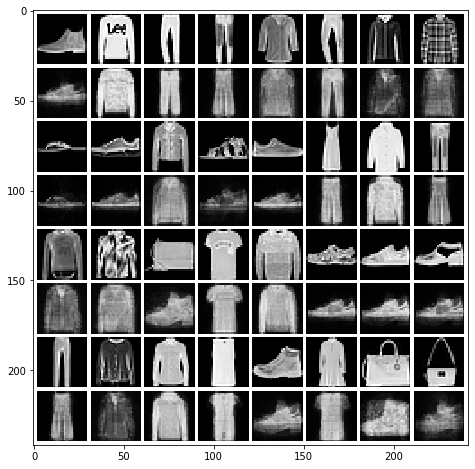

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


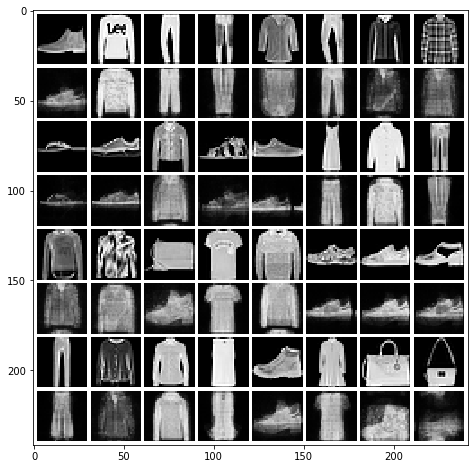

Signal error:
  MSE: 0.04435758361569242, std: 0.02340371707988566
  MAE: 0.12642194885847857, std: 0.04074804905990021
  SSIM: 0.44502453965019756, std: 0.15857619539668152
  Sharpness: 0.15692283557803363, std: 0.03901997935707584
  PhCo-MSE: 0.05709745159992963, std: 0.052285044276374384
  PhCo-MAE: 0.1448699804241187, std: 0.07464683699612577
  PhCo-SSIM: 0.420352760581598, std: 0.18616087308801735
  CroCo-MSE: 0.037188285893989814, std: 0.017196590448626942
  CroCo-MAE: 0.11683114449624554, std: 0.033499043437161605
  CroCo-SSIM: 0.49127827546848524, std: 0.13532100667872096

Magnitude error:
  MSE Magnitude: 13.68586911965069, std: 7.273078971612805

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 0.98] - should be in [0, 1]

Markdown table values:
 0.04436 | 0.1264 | 0.4450 | 0.1569 | 0.05710 | 0.1449 | 0.4204 | 0.03719 | 0.1168 | 0.4913 | 13.69 |
Start training with ts of 32 and gs of 1024
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


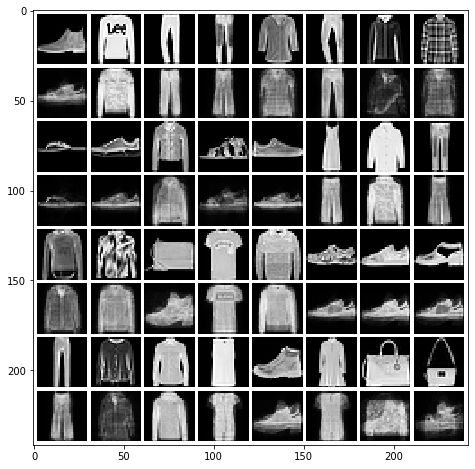

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


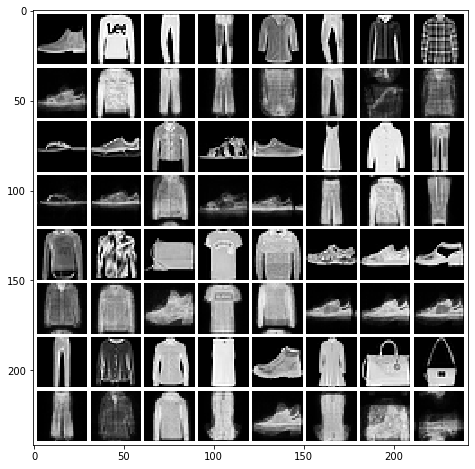

Signal error:
  MSE: 0.0452565602681716, std: 0.02436573010622038
  MAE: 0.12245109509967733, std: 0.0408845705186117
  SSIM: 0.4586301358660147, std: 0.16281584383088268
  Sharpness: 0.15811619851522182, std: 0.04004092791308752
  PhCo-MSE: 0.05520386015996337, std: 0.044876536560107254
  PhCo-MAE: 0.13764768869441468, std: 0.06657043544287156
  PhCo-SSIM: 0.4367244105068146, std: 0.18861570522220586
  CroCo-MSE: 0.03734175574572873, std: 0.017283208992329026
  CroCo-MAE: 0.11205330926168244, std: 0.03279657922138173
  CroCo-SSIM: 0.5078665956190044, std: 0.1390541951874285

Magnitude error:
  MSE Magnitude: 12.76763570760654, std: 6.818555088469763

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 0.99] - should be in [0, 1]

Markdown table values:
 0.04526 | 0.1225 | 0.4586 | 0.1581 | 0.05520 | 0.1376 | 0.4367 | 0.03734 | 0.1121 | 0.5079 | 12.77 |
Start training with ts of 32 and gs of 2048
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


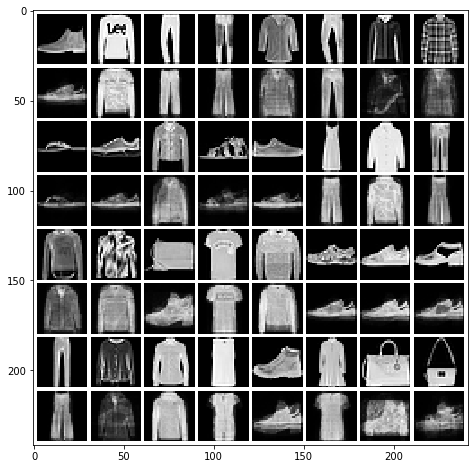

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


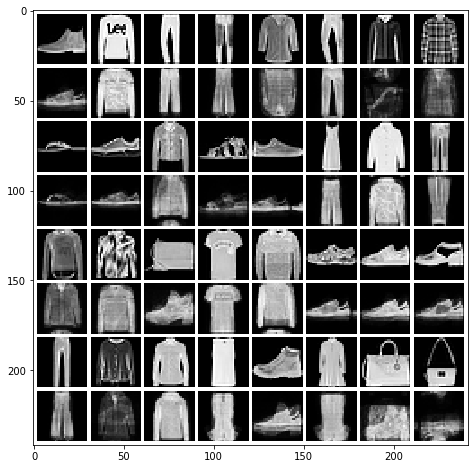

Signal error:
  MSE: 0.04666477971022687, std: 0.02529480217296136
  MAE: 0.12066100526681112, std: 0.04121356560707548
  SSIM: 0.4658000778855187, std: 0.1698983779760352
  Sharpness: 0.15838362542761575, std: 0.041367739015003915
  PhCo-MSE: 0.05992303391030873, std: 0.054437316862622896
  PhCo-MAE: 0.1402684774930094, std: 0.07657004366466602
  PhCo-SSIM: 0.43415464046666113, std: 0.20235851488208711
  CroCo-MSE: 0.03833432066949172, std: 0.017931893488740195
  CroCo-MAE: 0.10973236310564971, std: 0.03311079006338443
  CroCo-SSIM: 0.5177507487074027, std: 0.14655604851276932

Magnitude error:
  MSE Magnitude: 12.63270131426259, std: 6.761233138803038

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.04666 | 0.1207 | 0.4658 | 0.1584 | 0.05992 | 0.1403 | 0.4342 | 0.03833 | 0.1097 | 0.5178 | 12.63 |
Start training with ts of 64 and gs of 512
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


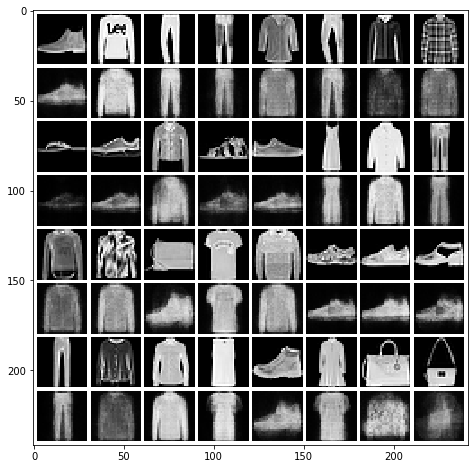

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


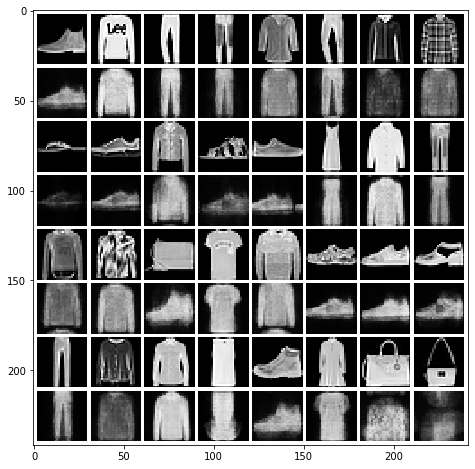

Signal error:
  MSE: 0.03941873598523671, std: 0.024362151753269754
  MAE: 0.12004513384090387, std: 0.0430149848403304
  SSIM: 0.4829036571559898, std: 0.16268431478215692
  Sharpness: 0.14964598517100397, std: 0.04228829336301975
  PhCo-MSE: 0.049844911555283034, std: 0.04794901606383543
  PhCo-MAE: 0.1350867654364265, std: 0.07049999541369018
  PhCo-SSIM: 0.4601283442286712, std: 0.1922363650902952
  CroCo-MSE: 0.03329146750456857, std: 0.017680492488536242
  CroCo-MAE: 0.11197932656432386, std: 0.03546254020612852
  CroCo-SSIM: 0.5188845781033075, std: 0.14297124901444405

Magnitude error:
  MSE Magnitude: 13.0446042400137, std: 7.217141752804863

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 0.98] - should be in [0, 1]

Markdown table values:
 0.03942 | 0.1200 | 0.4829 | 0.1496 | 0.04984 | 0.1351 | 0.4601 | 0.03329 | 0.1120 | 0.5189 | 13.04 |
Start training with ts of 64 and gs of 1024
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


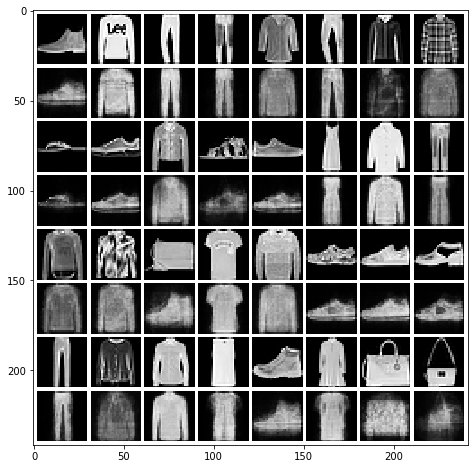

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


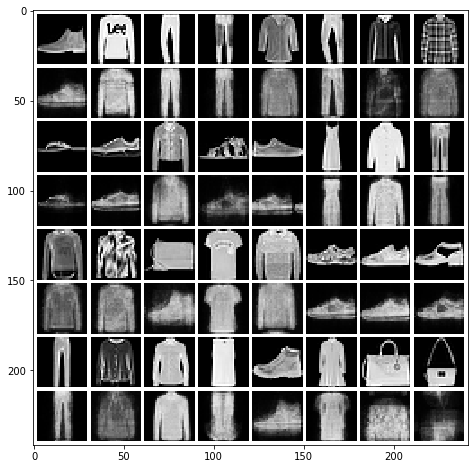

Signal error:
  MSE: 0.03775280966237915, std: 0.02326350141877034
  MAE: 0.11633580836496549, std: 0.042547655193899615
  SSIM: 0.5028559352052968, std: 0.17404494419235148
  Sharpness: 0.1487552541081835, std: 0.04227157335746824
  PhCo-MSE: 0.047546753193273616, std: 0.0468459254677656
  PhCo-MAE: 0.13087396823175368, std: 0.07109495637821087
  PhCo-SSIM: 0.4836883399941104, std: 0.2047367274287689
  CroCo-MSE: 0.03153379608193063, std: 0.016734643469908873
  CroCo-MAE: 0.10802235997107346, std: 0.03537054119360834
  CroCo-SSIM: 0.5428597878987225, std: 0.15306447315525665

Magnitude error:
  MSE Magnitude: 11.920335980467526, std: 7.276166972521876

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 0.99] - should be in [0, 1]

Markdown table values:
 0.03775 | 0.1163 | 0.5029 | 0.1488 | 0.04755 | 0.1309 | 0.4837 | 0.03153 | 0.1080 | 0.5429 | 11.92 |
Start training with ts of 64 and gs of 2048
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


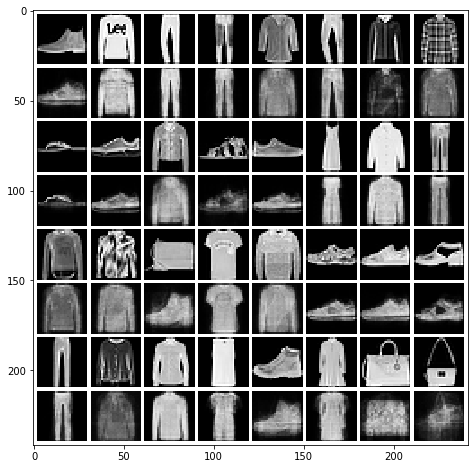

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


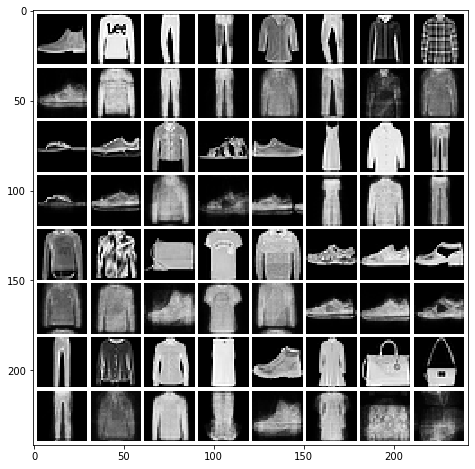

Signal error:
  MSE: 0.03817203321159468, std: 0.02400725607745849
  MAE: 0.11415199166367529, std: 0.04386008163038754
  SSIM: 0.5227286470232246, std: 0.1794238967336755
  Sharpness: 0.1481200642909416, std: 0.04316893706890611
  PhCo-MSE: 0.04770998635831347, std: 0.04478150134378509
  PhCo-MAE: 0.1287266425861162, std: 0.07016127468983256
  PhCo-SSIM: 0.5005831417252502, std: 0.21207479921212397
  CroCo-MSE: 0.031815394264413044, std: 0.01752725141024728
  CroCo-MAE: 0.10576431867957581, std: 0.03697362010463981
  CroCo-SSIM: 0.5640046481755676, std: 0.1595211453336021

Magnitude error:
  MSE Magnitude: 11.636917447167182, std: 7.577787028130635

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 0.98] - should be in [0, 1]

Markdown table values:
 0.03817 | 0.1142 | 0.5227 | 0.1481 | 0.04771 | 0.1287 | 0.5006 | 0.03182 | 0.1058 | 0.5640 | 11.64 |
Start training with ts of 128 and gs of 512
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


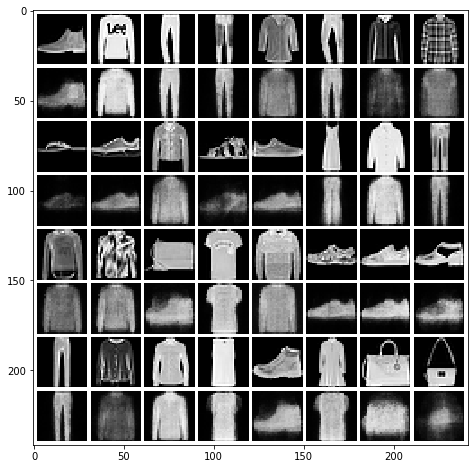

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


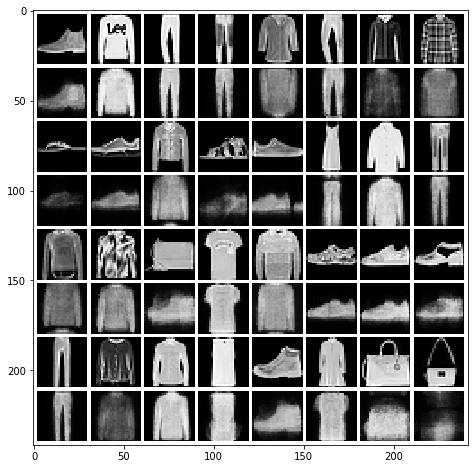

Signal error:
  MSE: 0.035107776563563675, std: 0.022385804517378455
  MAE: 0.10884055648421054, std: 0.040766244992345546
  SSIM: 0.5322781749213458, std: 0.16784513666145576
  Sharpness: 0.14479216115518334, std: 0.042242201365841385
  PhCo-MSE: 0.04483919277663517, std: 0.04939221731668419
  PhCo-MAE: 0.12264621406575316, std: 0.07188144061487482
  PhCo-SSIM: 0.5071749745629677, std: 0.20048373325482213
  CroCo-MSE: 0.02993160281312157, std: 0.016431993460119063
  CroCo-MAE: 0.1019775089698669, std: 0.03407695125923027
  CroCo-SSIM: 0.5614541990960605, std: 0.15167305486310761

Magnitude error:
  MSE Magnitude: 12.054745349401234, std: 6.948724606851516

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 0.99] - should be in [0, 1]

Markdown table values:
 0.03511 | 0.1088 | 0.5323 | 0.1448 | 0.04484 | 0.1226 | 0.5072 | 0.02993 | 0.1020 | 0.5615 | 12.05 |
Start training with ts of 128 and gs of 1024
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


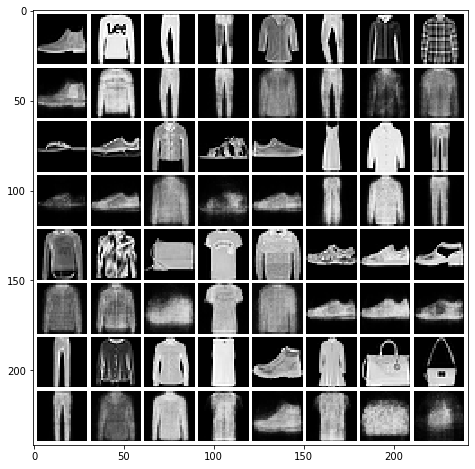

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


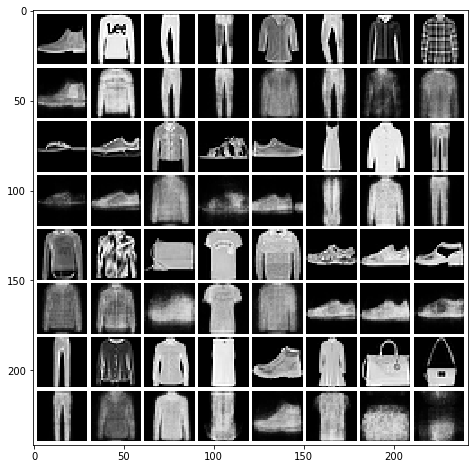

Signal error:
  MSE: 0.03450411561470901, std: 0.022877070904684067
  MAE: 0.10779122700114385, std: 0.042730776876032585
  SSIM: 0.5500349128992505, std: 0.18017387492216103
  Sharpness: 0.14287848597386127, std: 0.04315034507056455
  PhCo-MSE: 0.04109890734162036, std: 0.04165982545924415
  PhCo-MAE: 0.1178479460068047, std: 0.06513659653778488
  PhCo-SSIM: 0.5321944550214299, std: 0.20775192927762506
  CroCo-MSE: 0.02873463125069975, std: 0.016663210153061263
  CroCo-MAE: 0.10005381926021073, std: 0.036367082619158185
  CroCo-SSIM: 0.5851050299886905, std: 0.1621413598677504

Magnitude error:
  MSE Magnitude: 11.03343569270653, std: 7.178082598343324

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 0.99] - should be in [0, 1]

Markdown table values:
 0.03450 | 0.1078 | 0.5500 | 0.1429 | 0.04110 | 0.1178 | 0.5322 | 0.02873 | 0.1001 | 0.5851 | 11.03 |
Start training with ts of 128 and gs of 2048
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


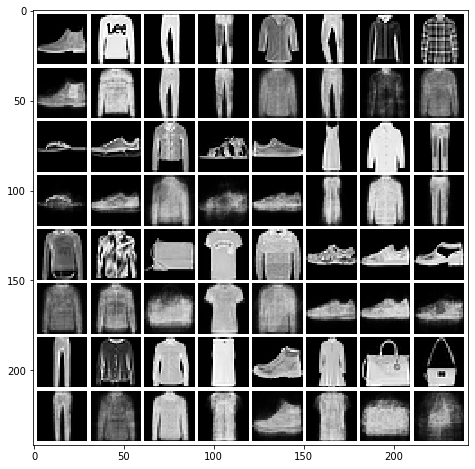

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


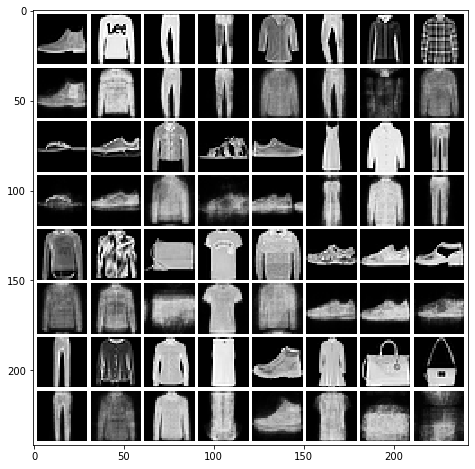

Signal error:
  MSE: 0.03429120315649925, std: 0.021872478874339296
  MAE: 0.10943153824518959, std: 0.04285258473565657
  SSIM: 0.5463434835193071, std: 0.182074723338949
  Sharpness: 0.14412984803453532, std: 0.04428720147774456
  PhCo-MSE: 0.04136930341428524, std: 0.041780731926591215
  PhCo-MAE: 0.11992971333711466, std: 0.0657199458034823
  PhCo-SSIM: 0.5321890892454442, std: 0.2094131783779628
  CroCo-MSE: 0.02859461675552666, std: 0.016156809542489062
  CroCo-MAE: 0.10180612012663914, std: 0.0371660899750283
  CroCo-SSIM: 0.5818330652442051, std: 0.16568277676556942

Magnitude error:
  MSE Magnitude: 10.588254266792623, std: 6.671972878433954

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 0.99] - should be in [0, 1]

Markdown table values:
 0.03429 | 0.1094 | 0.5463 | 0.1441 | 0.04137 | 0.1199 | 0.5322 | 0.02859 | 0.1018 | 0.5818 | 10.59 |
Start training with ts of 256 and gs of 512
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


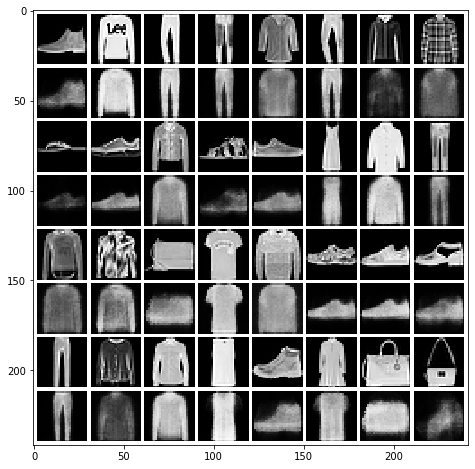

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


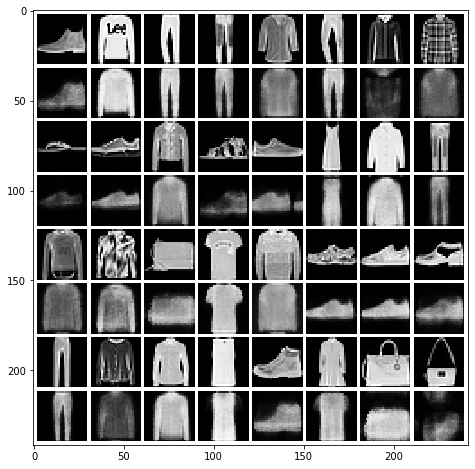

Signal error:
  MSE: 0.03311415593816491, std: 0.021070605922980625
  MAE: 0.10230444072658429, std: 0.03898105223091485
  SSIM: 0.5561967015910927, std: 0.1676263371946056
  Sharpness: 0.14064959433526408, std: 0.04149544998896611
  PhCo-MSE: 0.041430872814089525, std: 0.043213065352908926
  PhCo-MAE: 0.11467838726821356, std: 0.06464226611260919
  PhCo-SSIM: 0.5271872194428961, std: 0.20014352944016517
  CroCo-MSE: 0.028461427503316372, std: 0.015196897191009164
  CroCo-MAE: 0.09618485438477364, std: 0.03238897280479476
  CroCo-SSIM: 0.5816769442586294, std: 0.15188522360021856

Magnitude error:
  MSE Magnitude: 11.795074708265817, std: 6.614326062207464

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 0.98] - should be in [0, 1]

Markdown table values:
 0.03311 | 0.1023 | 0.5562 | 0.1406 | 0.04143 | 0.1147 | 0.5272 | 0.02846 | 0.09618 | 0.5817 | 11.80 |
Start training with ts of 256 and gs of 1024
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


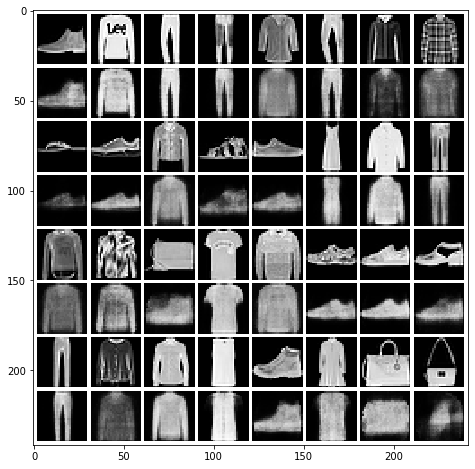

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


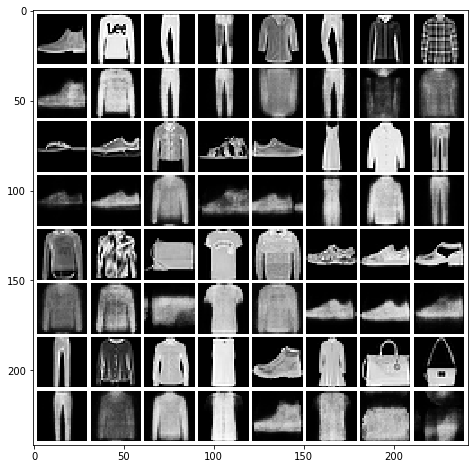

Signal error:
  MSE: 0.030567307863066162, std: 0.020397178452914035
  MAE: 0.09906359434535261, std: 0.03960475387616878
  SSIM: 0.5826048571738645, std: 0.1780756341234408
  Sharpness: 0.138358751872996, std: 0.04284564793027519
  PhCo-MSE: 0.03752560396674198, std: 0.04180430273069626
  PhCo-MAE: 0.10950525022417423, std: 0.06321140314629943
  PhCo-SSIM: 0.5600403359123273, std: 0.2098706638573561
  CroCo-MSE: 0.025937824055517922, std: 0.014459075967423506
  CroCo-MAE: 0.09272985252755461, std: 0.03348667380940426
  CroCo-SSIM: 0.6118622342098085, std: 0.158452230099842

Magnitude error:
  MSE Magnitude: 9.950594258143193, std: 5.83536344070586

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 0.99] - should be in [0, 1]

Markdown table values:
 0.03057 | 0.09906 | 0.5826 | 0.1384 | 0.03753 | 0.1095 | 0.5600 | 0.02594 | 0.09273 | 0.6119 | 9.951 |
Start training with ts of 256 and gs of 2048
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


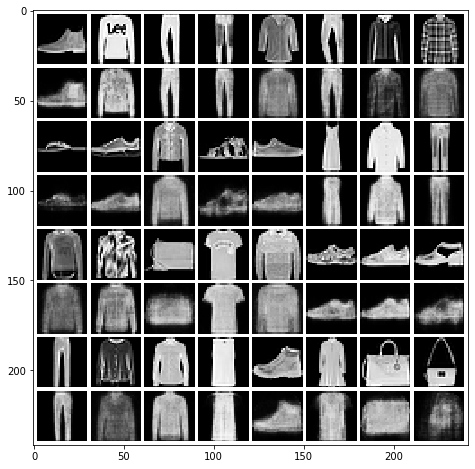

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


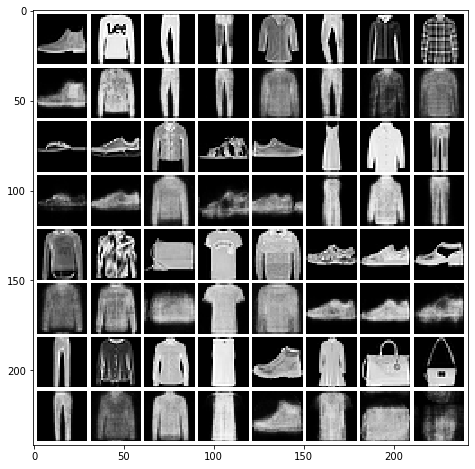

Signal error:
  MSE: 0.030275569716877726, std: 0.020222984883255225
  MAE: 0.10001919704518514, std: 0.04022053278768375
  SSIM: 0.5845168228517741, std: 0.18252902610460128
  Sharpness: 0.13768184846714449, std: 0.043463962641703206
  PhCo-MSE: 0.0347331798795949, std: 0.03343911651097132
  PhCo-MAE: 0.10715408249598113, std: 0.05688887458835214
  PhCo-SSIM: 0.5738877337301069, std: 0.20559491608382113
  CroCo-MSE: 0.025396834255161593, std: 0.014221352619662366
  CroCo-MAE: 0.09330616040097084, std: 0.03415899767590678
  CroCo-SSIM: 0.616927371976442, std: 0.16372558493040043

Magnitude error:
  MSE Magnitude: 9.321583995003662, std: 5.617929214111046

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 0.99] - should be in [0, 1]

Markdown table values:
 0.03028 | 0.1000 | 0.5845 | 0.1377 | 0.03473 | 0.1072 | 0.5739 | 0.02540 | 0.09331 | 0.6169 | 9.322 |
Start training with ts of 512 and gs of 512
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


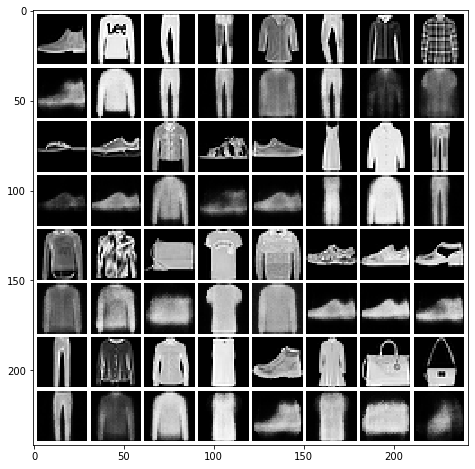

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


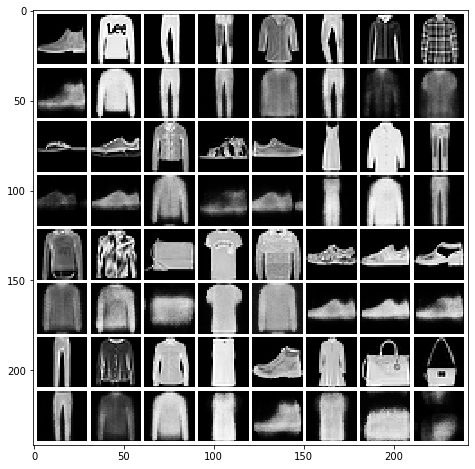

Signal error:
  MSE: 0.03283751936078261, std: 0.022203273189406156
  MAE: 0.0985810455858882, std: 0.03856659551117759
  SSIM: 0.573524940256114, std: 0.17096401122458918
  Sharpness: 0.13940049883036576, std: 0.041812057755431044
  PhCo-MSE: 0.04095090133978374, std: 0.04527765556950823
  PhCo-MAE: 0.11040352314739721, std: 0.06461783209540453
  PhCo-SSIM: 0.5445060596429421, std: 0.20520050267019713
  CroCo-MSE: 0.028037660883910576, std: 0.016050679545976373
  CroCo-MAE: 0.09223386653320631, std: 0.031376312041010344
  CroCo-SSIM: 0.5991285675805778, std: 0.153663833795298

Magnitude error:
  MSE Magnitude: 11.23921346871028, std: 6.750523092529939

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 0.99] - should be in [0, 1]

Markdown table values:
 0.03284 | 0.09858 | 0.5735 | 0.1394 | 0.04095 | 0.1104 | 0.5445 | 0.02804 | 0.09223 | 0.5991 | 11.24 |
Start training with ts of 512 and gs of 1024
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


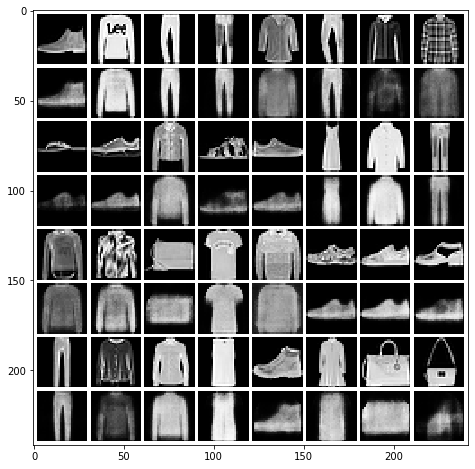

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


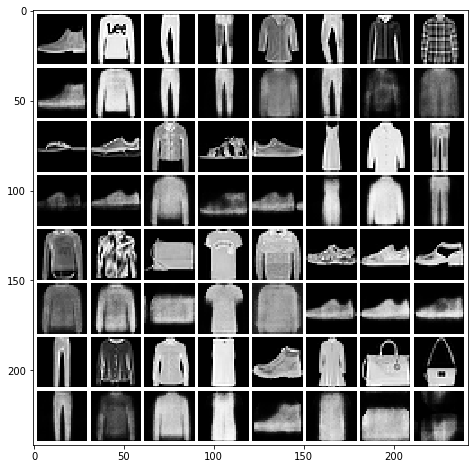

Signal error:
  MSE: 0.03024908494171541, std: 0.022264741643278768
  MAE: 0.09434284000235493, std: 0.039322173804521326
  SSIM: 0.5964652345329988, std: 0.17755943886440093
  Sharpness: 0.1349533008231259, std: 0.04226905327514422
  PhCo-MSE: 0.03731991715631011, std: 0.04446691199964475
  PhCo-MAE: 0.10506630149393459, std: 0.06525246850846171
  PhCo-SSIM: 0.5720975785024298, std: 0.21015996127105394
  CroCo-MSE: 0.025023394464824378, std: 0.014107925360180365
  CroCo-MAE: 0.08735568653719383, std: 0.03082415573605796
  CroCo-SSIM: 0.6264264657526091, std: 0.15495971346879112

Magnitude error:
  MSE Magnitude: 9.573701085048992, std: 5.7999478882985205

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 0.99] - should be in [0, 1]

Markdown table values:
 0.03025 | 0.09434 | 0.5965 | 0.1350 | 0.03732 | 0.1051 | 0.5721 | 0.02502 | 0.08736 | 0.6264 | 9.574 |
Start training with ts of 512 and gs of 2048
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


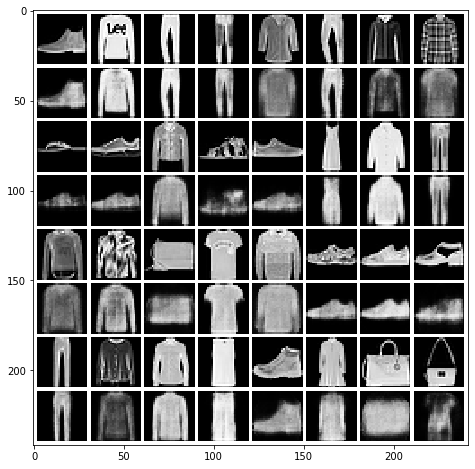

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


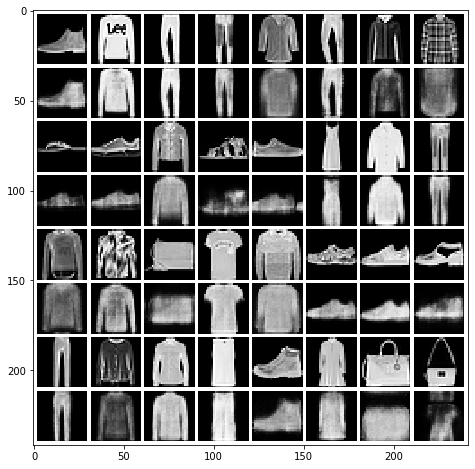

Signal error:
  MSE: 0.028336641465330104, std: 0.020631511658113433
  MAE: 0.0909893349144113, std: 0.03874116732206656
  SSIM: 0.6169160881031563, std: 0.18301301555348587
  Sharpness: 0.13278499499671997, std: 0.043515026367159405
  PhCo-MSE: 0.03288811108063783, std: 0.04039941698619597
  PhCo-MAE: 0.09805828229400504, std: 0.060335398630572364
  PhCo-SSIM: 0.605070259869209, std: 0.20732985762037293
  CroCo-MSE: 0.023616200029891843, std: 0.01437301841009087
  CroCo-MAE: 0.08450019885822257, std: 0.032090466733720915
  CroCo-SSIM: 0.6478615978487829, std: 0.1608003406410986

Magnitude error:
  MSE Magnitude: 8.242896061502137, std: 5.350466786474669

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 0.99] - should be in [0, 1]

Markdown table values:
 0.02834 | 0.09099 | 0.6169 | 0.1328 | 0.03289 | 0.09806 | 0.6051 | 0.02362 | 0.08450 | 0.6479 | 8.243 |
Start training with ts of 1000 and gs of 512
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


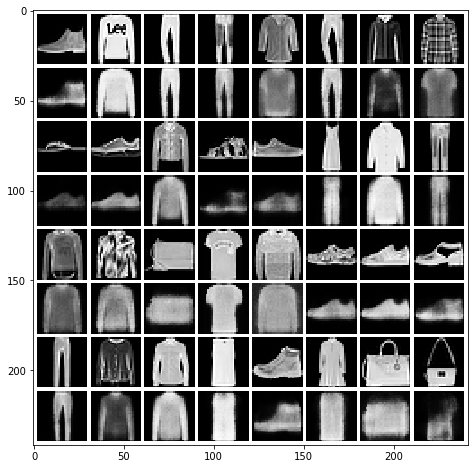

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


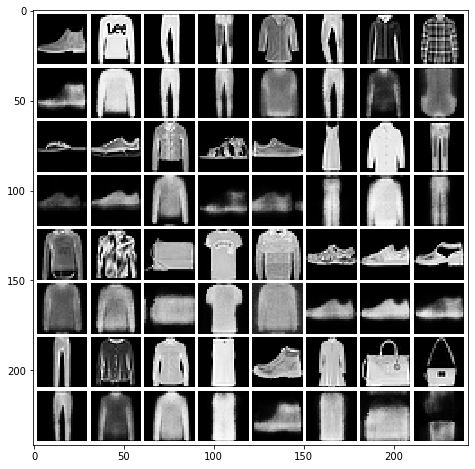

Signal error:
  MSE: 0.030793172135872737, std: 0.019429342690229803
  MAE: 0.09428898393525742, std: 0.03598181457508659
  SSIM: 0.5933119457794972, std: 0.1645269116067095
  Sharpness: 0.1362808687843315, std: 0.041282623116443116
  PhCo-MSE: 0.03940865899721757, std: 0.04580042011810877
  PhCo-MAE: 0.1070451092091389, std: 0.06616430342518279
  PhCo-SSIM: 0.5627225168043135, std: 0.20590836995850015
  CroCo-MSE: 0.026972959663908114, std: 0.015046245855000825
  CroCo-MAE: 0.08917974462383427, std: 0.030999666595458192
  CroCo-SSIM: 0.6170014707979836, std: 0.1484999859809322

Magnitude error:
  MSE Magnitude: 10.639700670304752, std: 6.489418633017756

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 0.99] - should be in [0, 1]

Markdown table values:
 0.03079 | 0.09429 | 0.5933 | 0.1363 | 0.03941 | 0.1070 | 0.5627 | 0.02697 | 0.08918 | 0.6170 | 10.64 |
Start training with ts of 1000 and gs of 1024
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


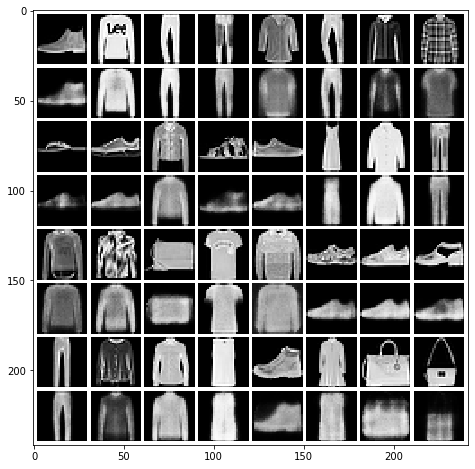

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


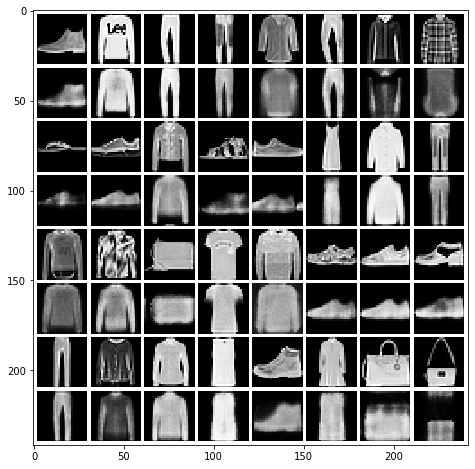

Signal error:
  MSE: 0.02766431314012152, std: 0.018745110798883233
  MAE: 0.0868949810610502, std: 0.035012816402851185
  SSIM: 0.6267252410176524, std: 0.17045324038674006
  Sharpness: 0.13085079210528056, std: 0.04175988832453969
  PhCo-MSE: 0.032210762302383955, std: 0.0345627471241345
  PhCo-MAE: 0.09429542880388908, std: 0.05354065748985593
  PhCo-SSIM: 0.6083535311196131, std: 0.20191335151408246
  CroCo-MSE: 0.023739328642932378, std: 0.013749891727105312
  CroCo-MAE: 0.08157266182024614, std: 0.029787838160558192
  CroCo-SSIM: 0.6516369807686863, std: 0.15321485172169996

Magnitude error:
  MSE Magnitude: 8.67607705591588, std: 5.561347357762292

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 0.99] - should be in [0, 1]

Markdown table values:
 0.02766 | 0.08689 | 0.6267 | 0.1309 | 0.03221 | 0.09430 | 0.6084 | 0.02374 | 0.08157 | 0.6516 | 8.676 |
Start training with ts of 1000 and gs of 2048
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


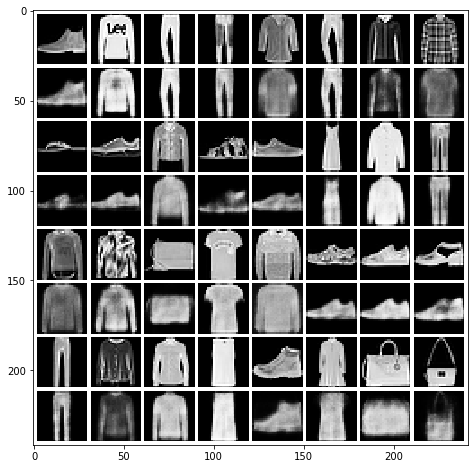

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


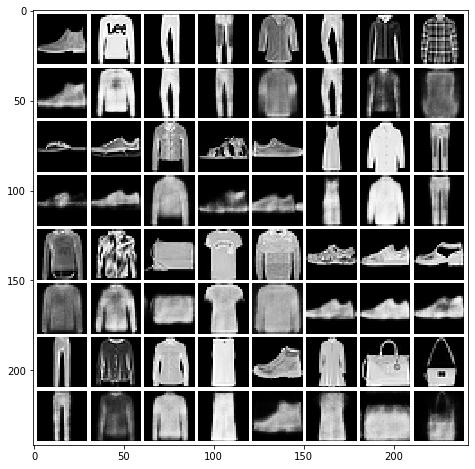

Signal error:
  MSE: 0.026991419131263683, std: 0.019026811095690408
  MAE: 0.08607551315435558, std: 0.0352881605076239
  SSIM: 0.6357058315966287, std: 0.17254459840718842
  Sharpness: 0.12869605268371198, std: 0.04304455713879951
  PhCo-MSE: 0.029744058634605608, std: 0.032019580211953426
  PhCo-MAE: 0.0909419865347445, std: 0.05139691764581623
  PhCo-SSIM: 0.6260883616625208, std: 0.20017208596444908
  CroCo-MSE: 0.022634545572600473, std: 0.013634217193841697
  CroCo-MAE: 0.08018074501887895, std: 0.029904952854410624
  CroCo-SSIM: 0.6639126829077755, std: 0.1543957137765355

Magnitude error:
  MSE Magnitude: 7.714622907678379, std: 4.861396903655174

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.02699 | 0.08608 | 0.6357 | 0.1287 | 0.02974 | 0.09094 | 0.6261 | 0.02263 | 0.08018 | 0.6639 | 7.715 |
Start training with ts of 2000 and gs of 512
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


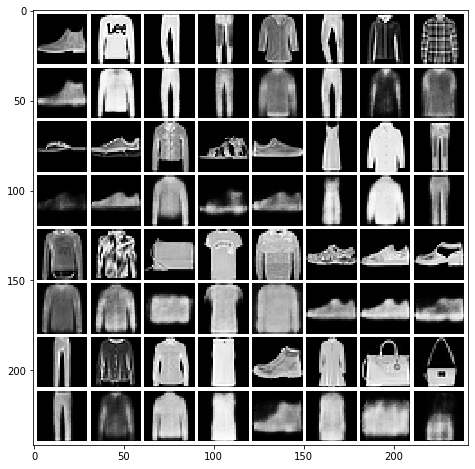

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


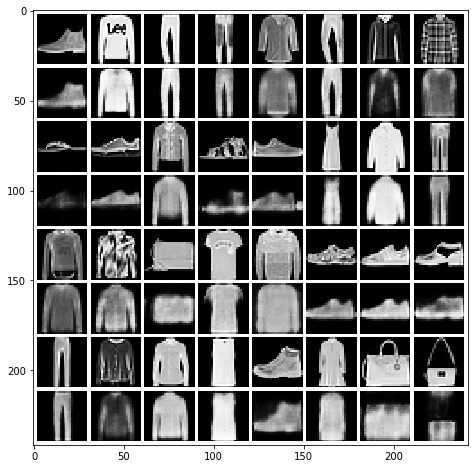

Signal error:
  MSE: 0.02710987332784498, std: 0.018310944242754916
  MAE: 0.0850020473881159, std: 0.03343075877886246
  SSIM: 0.6349863519351242, std: 0.16591587575882918
  Sharpness: 0.13028930450482346, std: 0.042034061574171167
  PhCo-MSE: 0.0330634493125217, std: 0.03774333357302719
  PhCo-MAE: 0.09414524831299786, std: 0.057167002254329906
  PhCo-SSIM: 0.6122964726965888, std: 0.20395085023495266
  CroCo-MSE: 0.023590308543589344, std: 0.014017231779271225
  CroCo-MAE: 0.08029112650910974, std: 0.0290493293716494
  CroCo-SSIM: 0.6589556066468887, std: 0.15087273125293896

Magnitude error:
  MSE Magnitude: 8.302437257481655, std: 5.205215767660457

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.02711 | 0.08500 | 0.6350 | 0.1303 | 0.03306 | 0.09415 | 0.6123 | 0.02359 | 0.08029 | 0.6590 | 8.302 |
Start training with ts of 2000 and gs of 1024
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


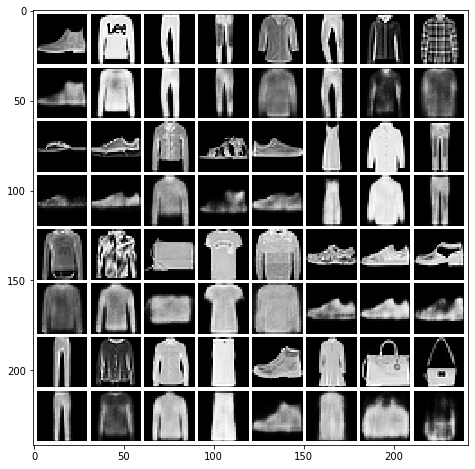

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


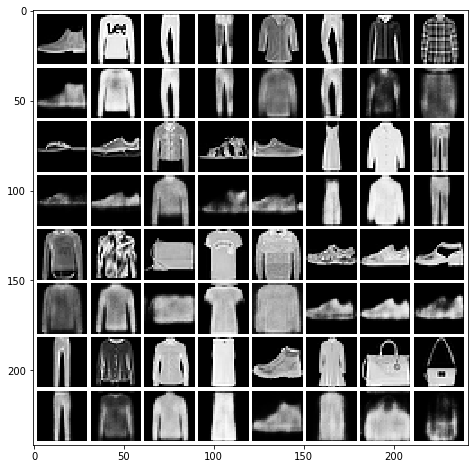

Signal error:
  MSE: 0.02478141858409799, std: 0.016910278753805852
  MAE: 0.08120038890046999, std: 0.03334894808097462
  SSIM: 0.6520850016902282, std: 0.16809694046855153
  Sharpness: 0.12617906790140443, std: 0.043233031336679925
  PhCo-MSE: 0.027679900902967347, std: 0.028274961124513255
  PhCo-MAE: 0.08598096415880718, std: 0.04727832265225154
  PhCo-SSIM: 0.6408206107311827, std: 0.1945609122699079
  CroCo-MSE: 0.02161585497924534, std: 0.01359016976409804
  CroCo-MAE: 0.07685056499394705, std: 0.02986670362398334
  CroCo-SSIM: 0.6754844605168391, std: 0.15342764524130775

Magnitude error:
  MSE Magnitude: 7.441207426863497, std: 4.954339093687275

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.02478 | 0.08120 | 0.6521 | 0.1262 | 0.02768 | 0.08598 | 0.6408 | 0.02162 | 0.07685 | 0.6755 | 7.441 |
Start training with ts of 2000 and gs of 2048
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


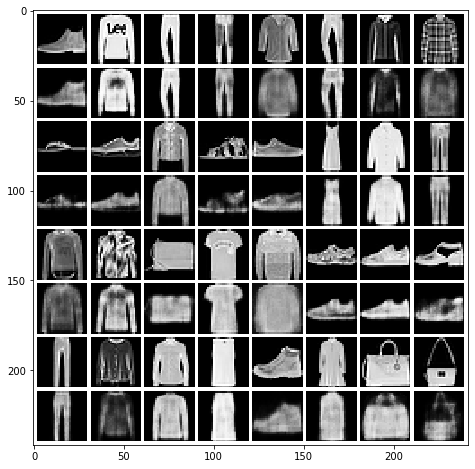

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


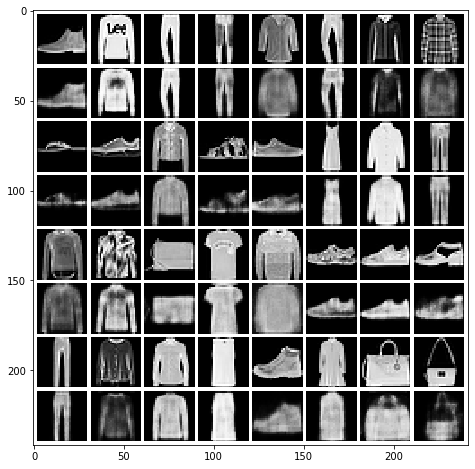

Signal error:
  MSE: 0.023977667391136492, std: 0.017277022690903348
  MAE: 0.07921594619074313, std: 0.033867608227989
  SSIM: 0.6637511936640043, std: 0.16836585031858034
  Sharpness: 0.12450227313850658, std: 0.044527592677736906
  PhCo-MSE: 0.026588727766466036, std: 0.02930231682705716
  PhCo-MAE: 0.0835994749195379, std: 0.049698582657869826
  PhCo-SSIM: 0.6563805704626051, std: 0.1981453054375111
  CroCo-MSE: 0.02044561571210579, std: 0.013324422475868182
  CroCo-MAE: 0.07438219003779523, std: 0.030106853853639648
  CroCo-SSIM: 0.6886829208334562, std: 0.15242016543133433

Magnitude error:
  MSE Magnitude: 6.527685337344322, std: 4.478931429209404

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.02398 | 0.07922 | 0.6638 | 0.1245 | 0.02659 | 0.08360 | 0.6564 | 0.02045 | 0.07438 | 0.6887 | 6.528 |
Start training with ts of 5000 and gs of 512
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


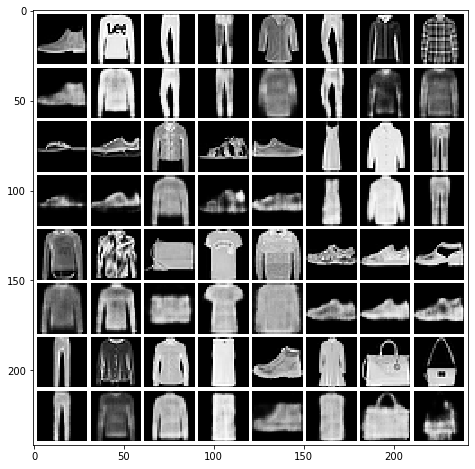

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


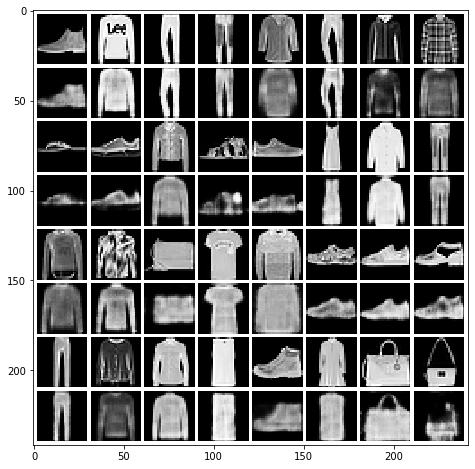

Signal error:
  MSE: 0.024298632068394, std: 0.016747806231705527
  MAE: 0.07894510001278832, std: 0.032042364853133
  SSIM: 0.6639394348309327, std: 0.1633127666332336
  Sharpness: 0.12578706030531706, std: 0.043525877690259826
  PhCo-MSE: 0.028403703338199193, std: 0.03386891176404806
  PhCo-MAE: 0.08501207974404679, std: 0.05051593185455649
  PhCo-SSIM: 0.6467968698486155, std: 0.19898582595673237
  CroCo-MSE: 0.021092846126748555, std: 0.01311256466995036
  CroCo-MAE: 0.07452716988700558, std: 0.02832012011082667
  CroCo-SSIM: 0.6868047288839281, std: 0.14847513946357774

Magnitude error:
  MSE Magnitude: 6.66916846561505, std: 4.30352078568359

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.02430 | 0.07895 | 0.6639 | 0.1258 | 0.02840 | 0.08501 | 0.6468 | 0.02109 | 0.07453 | 0.6868 | 6.669 |
Start training with ts of 5000 and gs of 1024
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


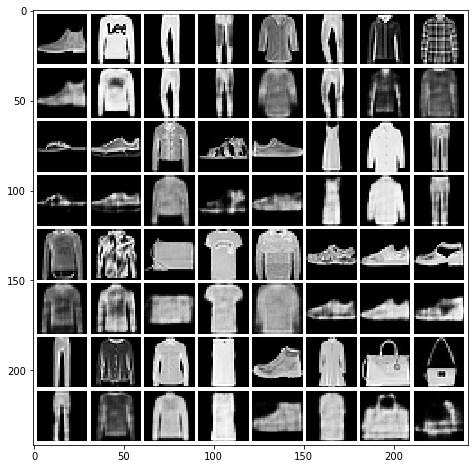

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


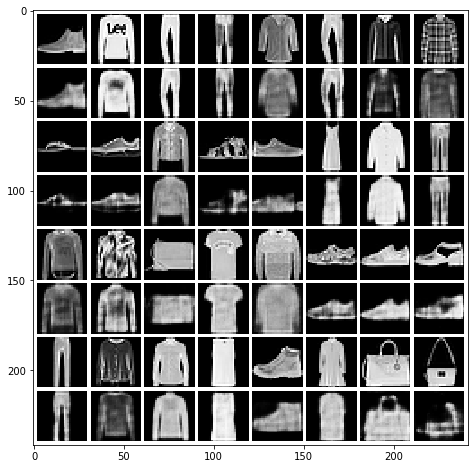

Signal error:
  MSE: 0.023263718816224355, std: 0.017243334911972025
  MAE: 0.075780710507388, std: 0.03262933699357634
  SSIM: 0.6764561206786049, std: 0.16587214886551693
  Sharpness: 0.1235043229022584, std: 0.04438919185940949
  PhCo-MSE: 0.026142149655470348, std: 0.03003229103223111
  PhCo-MAE: 0.08039149179239757, std: 0.04823670380218863
  PhCo-SSIM: 0.667198099186608, std: 0.1928762759304645
  CroCo-MSE: 0.020164139465350672, std: 0.013558966792056652
  CroCo-MAE: 0.07153183193076984, std: 0.0288412783999012
  CroCo-SSIM: 0.6992431967577903, std: 0.15001693986351514

Magnitude error:
  MSE Magnitude: 6.003438051181757, std: 4.145598906482133

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.02326 | 0.07578 | 0.6765 | 0.1235 | 0.02614 | 0.08039 | 0.6672 | 0.02016 | 0.07153 | 0.6992 | 6.003 |
Start training with ts of 5000 and gs of 2048
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


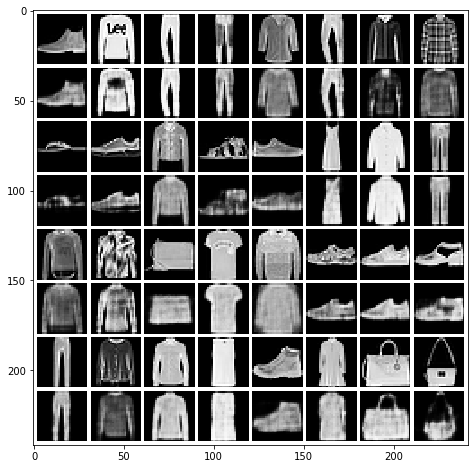

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


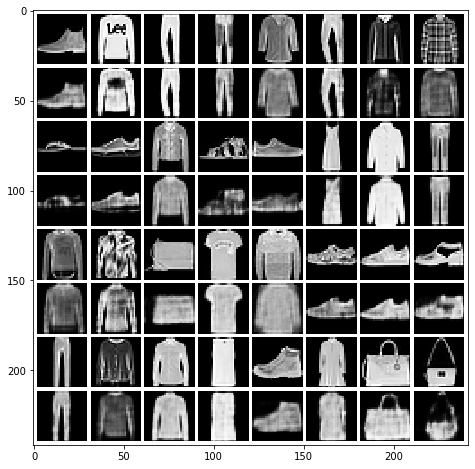

Signal error:
  MSE: 0.02205692247071056, std: 0.01639194671915769
  MAE: 0.07386539217259269, std: 0.03237073474123873
  SSIM: 0.6904175221794706, std: 0.16655553399036363
  Sharpness: 0.12133973800434311, std: 0.045557576949726196
  PhCo-MSE: 0.023388764290757535, std: 0.024451510672024026
  PhCo-MAE: 0.07625261400971795, std: 0.043266611654847464
  PhCo-SSIM: 0.6869596258798973, std: 0.19065388472929987
  CroCo-MSE: 0.01883308806191053, std: 0.012656951637552418
  CroCo-MAE: 0.06929237382064457, std: 0.028687865866651473
  CroCo-SSIM: 0.7151284039002707, std: 0.14993908870804054

Magnitude error:
  MSE Magnitude: 5.369391975093704, std: 3.754619498246396

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.02206 | 0.07387 | 0.6904 | 0.1213 | 0.02339 | 0.07625 | 0.6870 | 0.01883 | 0.06929 | 0.7151 | 5.369 |
Start training with ts of 10000 and gs of 512
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


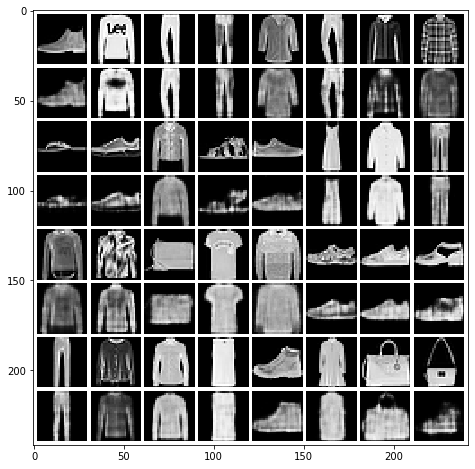

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


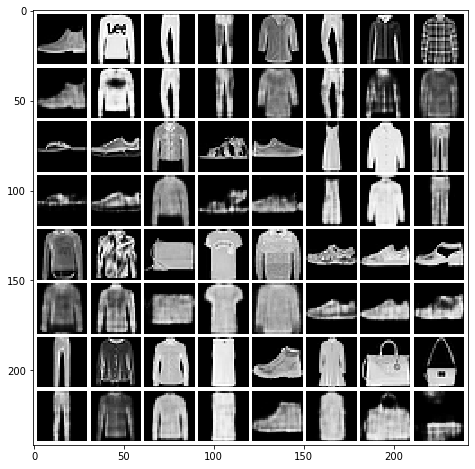

Signal error:
  MSE: 0.022657991801224853, std: 0.016465375340654027
  MAE: 0.0745772419613786, std: 0.03155170318467288
  SSIM: 0.6844911352485743, std: 0.1629374845690843
  Sharpness: 0.12357614895181979, std: 0.04478151190381961
  PhCo-MSE: 0.02464896022775065, std: 0.027528314283709627
  PhCo-MAE: 0.07823136310798873, std: 0.04567402413065101
  PhCo-SSIM: 0.6749134355036531, std: 0.19211893888406978
  CroCo-MSE: 0.019668226751491602, std: 0.012971598250409567
  CroCo-MAE: 0.070480350543221, std: 0.028303744570127215
  CroCo-SSIM: 0.7064951948481943, std: 0.14869095253459877

Magnitude error:
  MSE Magnitude: 5.764586648459549, std: 4.001398084067029

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.02266 | 0.07458 | 0.6845 | 0.1236 | 0.02465 | 0.07823 | 0.6749 | 0.01967 | 0.07048 | 0.7065 | 5.765 |
Start training with ts of 10000 and gs of 1024
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


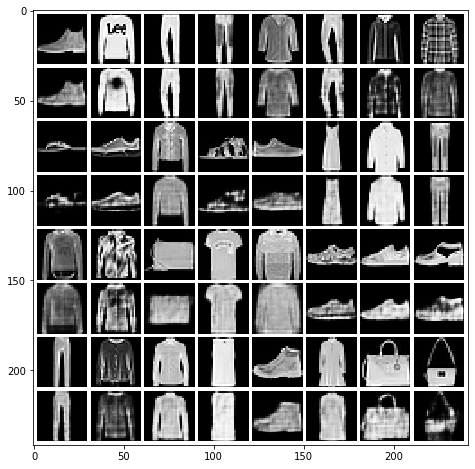

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


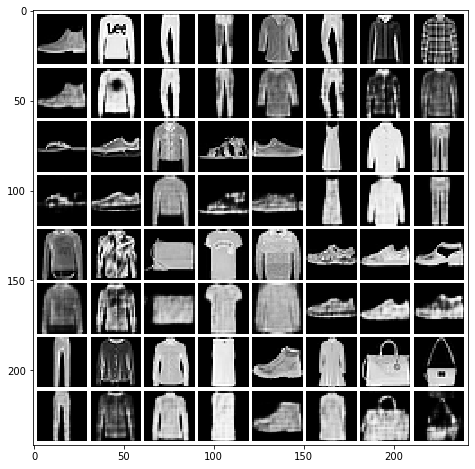

Signal error:
  MSE: 0.02239400158305216, std: 0.017378542932334113
  MAE: 0.07325983982264006, std: 0.03266594990940208
  SSIM: 0.6884339757906126, std: 0.16654924841015886
  Sharpness: 0.12393430164063078, std: 0.04702760973043132
  PhCo-MSE: 0.023952537628701975, std: 0.027195329553161215
  PhCo-MAE: 0.0759551625324093, std: 0.04613596111673223
  PhCo-SSIM: 0.6859180434574297, std: 0.19017713939480657
  CroCo-MSE: 0.019250164725235663, std: 0.01374216934405045
  CroCo-MAE: 0.06892208536010003, std: 0.029126281101050193
  CroCo-SSIM: 0.7118680643847753, std: 0.15069526059886296

Magnitude error:
  MSE Magnitude: 5.214627518227907, std: 3.703714454109107

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.02239 | 0.07326 | 0.6884 | 0.1239 | 0.02395 | 0.07596 | 0.6859 | 0.01925 | 0.06892 | 0.7119 | 5.215 |
Start training with ts of 10000 and gs of 2048
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


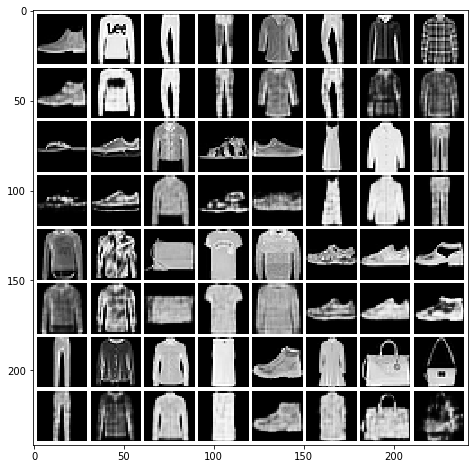

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


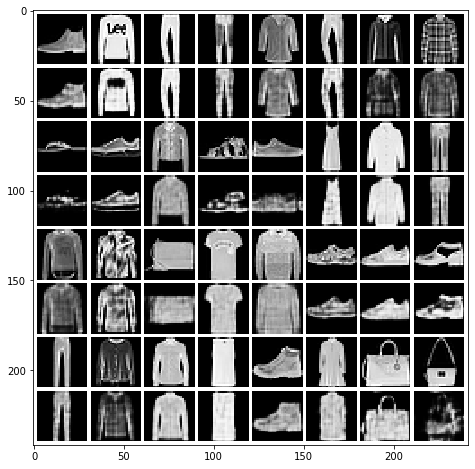

Signal error:
  MSE: 0.021682163016748746, std: 0.017789501737672964
  MAE: 0.07130315195354342, std: 0.03318881650313862
  SSIM: 0.7013345321283, std: 0.16690460685606495
  Sharpness: 0.12175140548174421, std: 0.048239298542254054
  PhCo-MSE: 0.02250663195877678, std: 0.027454113595951214
  PhCo-MAE: 0.07285370306999539, std: 0.04509335455609141
  PhCo-SSIM: 0.7027349787851802, std: 0.18603557631394915
  CroCo-MSE: 0.018445334259240553, std: 0.01368887335141984
  CroCo-MAE: 0.06684223533920886, std: 0.029518678266721055
  CroCo-SSIM: 0.7248861771241326, std: 0.14954119376594785

Magnitude error:
  MSE Magnitude: 4.773638817716215, std: 3.4461996013839897

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.02168 | 0.07130 | 0.7013 | 0.1218 | 0.02251 | 0.07285 | 0.7027 | 0.01845 | 0.06684 | 0.7249 | 4.774 |
Start training with ts of 30000 and gs of 512
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


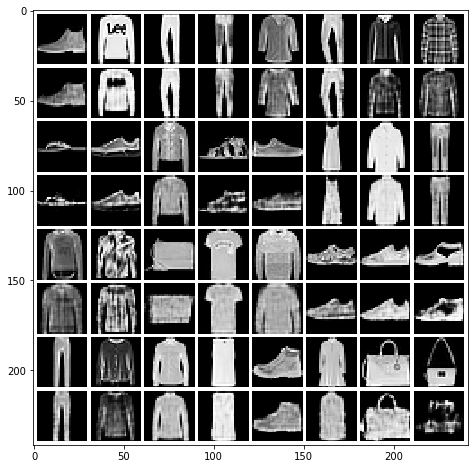

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


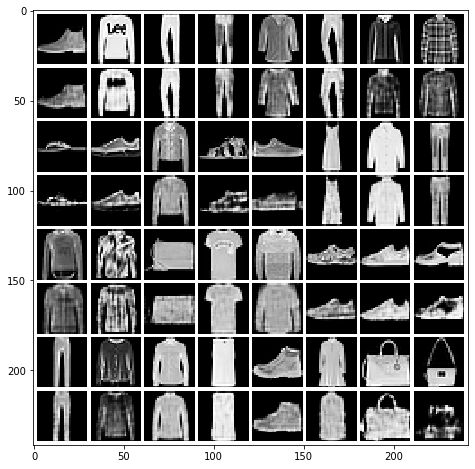

Signal error:
  MSE: 0.02256688705392662, std: 0.018396180257875417
  MAE: 0.07165632301257574, std: 0.033450263186655234
  SSIM: 0.6985594024747721, std: 0.1688968827602381
  Sharpness: 0.12683189366363445, std: 0.05150759737484951
  PhCo-MSE: 0.025071536917494086, std: 0.030798754284006916
  PhCo-MAE: 0.07560129722878628, std: 0.0493293395669208
  PhCo-SSIM: 0.6919169733888371, std: 0.19582935744141272
  CroCo-MSE: 0.019794644539615547, std: 0.014773529454253554
  CroCo-MAE: 0.0679639262616547, std: 0.03013660854238256
  CroCo-SSIM: 0.7188364772927919, std: 0.15428718650509438

Magnitude error:
  MSE Magnitude: 5.034681589247624, std: 3.8015028688066215

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.02257 | 0.07166 | 0.6986 | 0.1268 | 0.02507 | 0.07560 | 0.6919 | 0.01979 | 0.06796 | 0.7188 | 5.035 |
Start training with ts of 30000 and gs of 1024
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


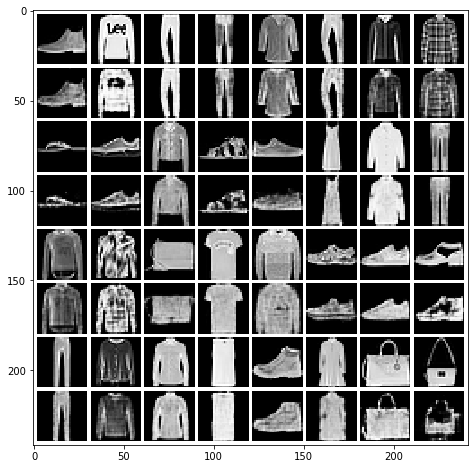

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


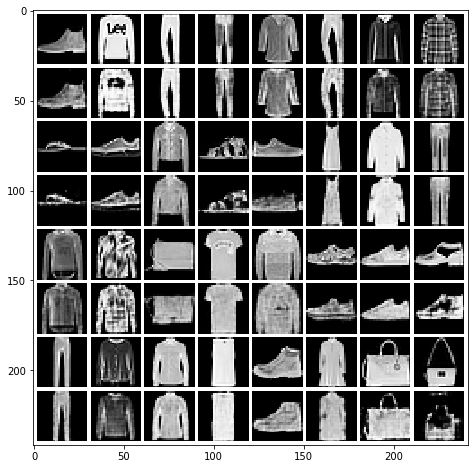

Signal error:
  MSE: 0.022313566410048224, std: 0.01914710362877362
  MAE: 0.07087914751355129, std: 0.034547910583586174
  SSIM: 0.7077547456132659, std: 0.16798760255998138
  Sharpness: 0.12855289721997826, std: 0.05589861039218223
  PhCo-MSE: 0.022868392965619933, std: 0.023276965166606586
  PhCo-MAE: 0.07240922379605763, std: 0.04155967147707161
  PhCo-SSIM: 0.7057472712474195, std: 0.18852039693109549
  CroCo-MSE: 0.019377721715727603, std: 0.01515636967768962
  CroCo-MAE: 0.06697569736752484, std: 0.030965629696892157
  CroCo-SSIM: 0.7284291675740915, std: 0.15295856125516388

Magnitude error:
  MSE Magnitude: 4.634943413017728, std: 3.4377757015626766

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.02231 | 0.07088 | 0.7078 | 0.1286 | 0.02287 | 0.07241 | 0.7057 | 0.01938 | 0.06698 | 0.7284 | 4.635 |
Start training with ts of 30000 and gs of 2048
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


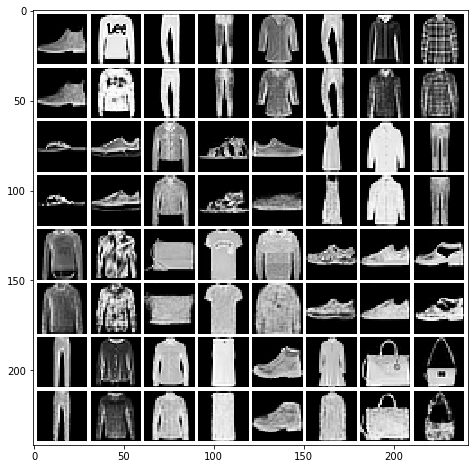

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


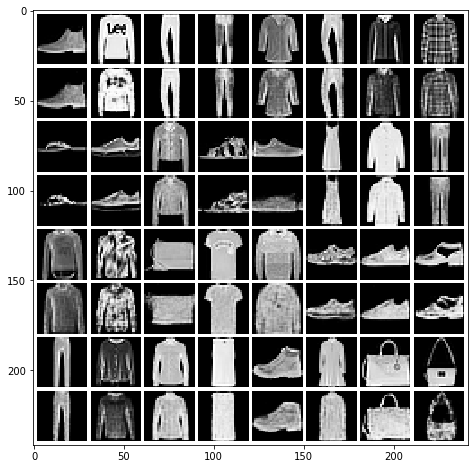

Signal error:
  MSE: 0.021035361135886887, std: 0.019100715270685683
  MAE: 0.0683290183878853, std: 0.035182339411825955
  SSIM: 0.7197670017543744, std: 0.16930670973962264
  Sharpness: 0.1257499895775302, std: 0.05676614651048826
  PhCo-MSE: 0.02245794362409015, std: 0.030500379053118403
  PhCo-MAE: 0.07051594342919998, std: 0.04816597121168272
  PhCo-SSIM: 0.7191330878638128, std: 0.1880494619547099
  CroCo-MSE: 0.017989260496847237, std: 0.014707758604377832
  CroCo-MAE: 0.0641913871968427, std: 0.031068721698839927
  CroCo-SSIM: 0.7410649965762096, std: 0.1524617114631513

Magnitude error:
  MSE Magnitude: 4.195295786648469, std: 3.346777608828061

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.02104 | 0.06833 | 0.7198 | 0.1257 | 0.02246 | 0.07052 | 0.7191 | 0.01799 | 0.06419 | 0.7411 | 4.195 |
Start training with ts of 60000 and gs of 512
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


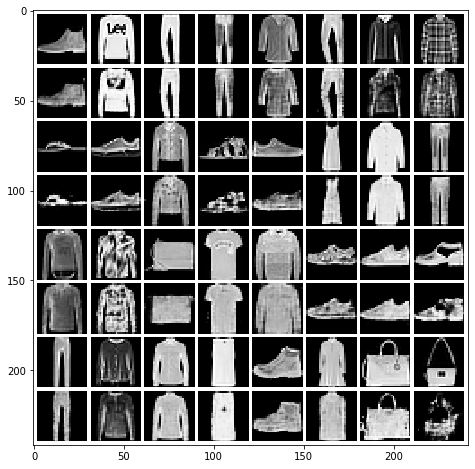

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


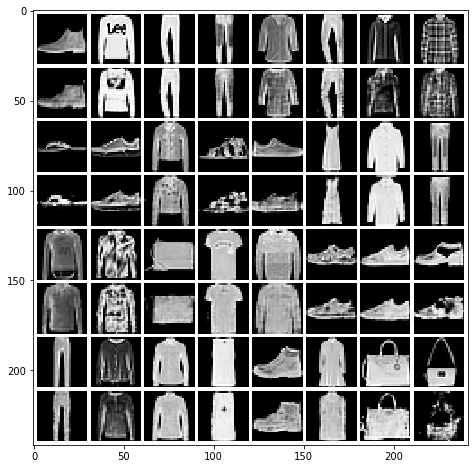

Signal error:
  MSE: 0.021667161016466707, std: 0.018050925359055347
  MAE: 0.06879803551964869, std: 0.03329522128655415
  SSIM: 0.7160218436343573, std: 0.16661149860660732
  Sharpness: 0.1269235159798478, std: 0.05424725362985732
  PhCo-MSE: 0.022847414286388812, std: 0.02439138733645945
  PhCo-MAE: 0.0708703200743912, std: 0.04160316273188885
  PhCo-SSIM: 0.7130245678160116, std: 0.18506473510803498
  CroCo-MSE: 0.019089906368208176, std: 0.014600633789251088
  CroCo-MAE: 0.06535299091228808, std: 0.030011421531229272
  CroCo-SSIM: 0.7347605867089866, std: 0.1509619719645509

Magnitude error:
  MSE Magnitude: 4.593789427752736, std: 3.426597417430927

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.02167 | 0.06880 | 0.7160 | 0.1269 | 0.02285 | 0.07087 | 0.7130 | 0.01909 | 0.06535 | 0.7348 | 4.594 |
Start training with ts of 60000 and gs of 1024
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


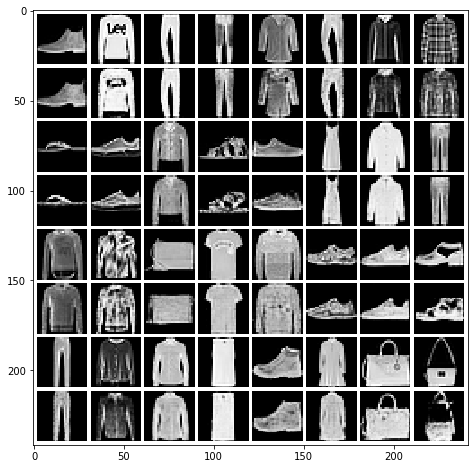

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


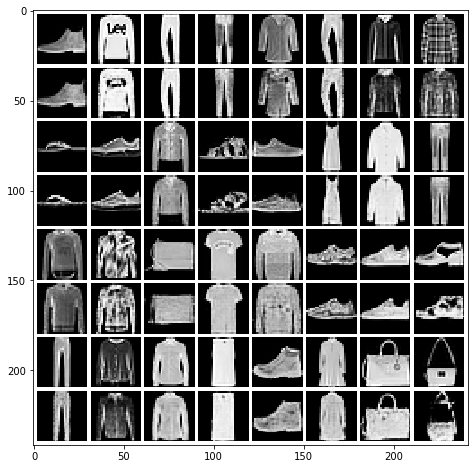

Signal error:
  MSE: 0.022065520146156814, std: 0.019310574583367962
  MAE: 0.06899981331844174, std: 0.03509976742619945
  SSIM: 0.7156672382236988, std: 0.17024500958667912
  Sharpness: 0.1288810490675875, std: 0.05814813330773819
  PhCo-MSE: 0.02285259602797396, std: 0.026226508809580263
  PhCo-MAE: 0.07052128740724584, std: 0.04339961866482367
  PhCo-SSIM: 0.7158559806465093, std: 0.1858354270961942
  CroCo-MSE: 0.01932726088364234, std: 0.015434932406470737
  CroCo-MAE: 0.06534148538594309, std: 0.031584626194867495
  CroCo-SSIM: 0.7358552832730385, std: 0.1544790431077679

Magnitude error:
  MSE Magnitude: 4.5364572964459615, std: 3.470227133646649

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.02207 | 0.06900 | 0.7157 | 0.1289 | 0.02285 | 0.07052 | 0.7159 | 0.01933 | 0.06534 | 0.7359 | 4.536 |
Start training with ts of 60000 and gs of 2048
Version 0.4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


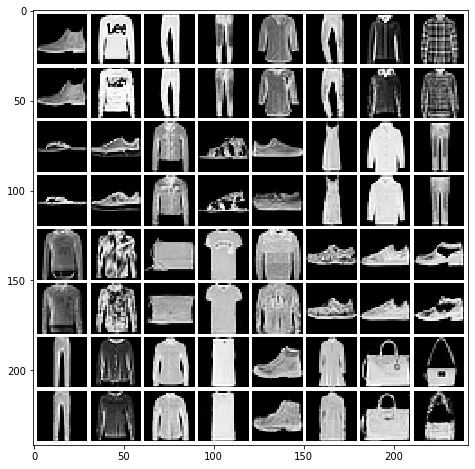

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


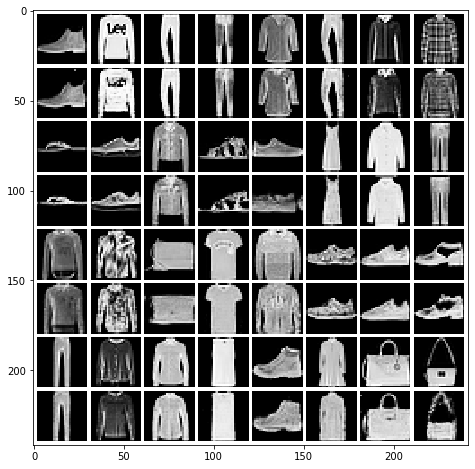

Signal error:
  MSE: 0.020853890026955924, std: 0.018781505415421118
  MAE: 0.06653456204185204, std: 0.03461790385598878
  SSIM: 0.7269565669895857, std: 0.16850259515666702
  Sharpness: 0.12488031684822648, std: 0.05853615854575806
  PhCo-MSE: 0.020511245612397033, std: 0.021758531879673193
  PhCo-MAE: 0.0664103954895836, std: 0.03935631048626991
  PhCo-SSIM: 0.7330352623416048, std: 0.1790253669415799
  CroCo-MSE: 0.0178102910731468, std: 0.014701603872165587
  CroCo-MAE: 0.06237722092191689, std: 0.031007161945453898
  CroCo-SSIM: 0.7494561036058975, std: 0.1520837609171554

Magnitude error:
  MSE Magnitude: 4.0693718515902715, std: 3.1922589152066263

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.02085 | 0.06653 | 0.7270 | 0.1249 | 0.02051 | 0.06641 | 0.7330 | 0.01781 | 0.06238 | 0.7495 | 4.069 |


In [13]:
### LOAD MODEL ####

train_sizes = [32, 64, 128, 256, 512, 1000, 2000, 5000, 10000, 30000, 60000]
gen_sizes = [512, 1024, 2048]

for ts in train_sizes:
    for gs, ds in zip(gen_sizes, disc_sizes):
        print("Start training with ts of", ts, "and gs of", gs)

        gen = models.FCNet(imsize=(2, 28, 28), outsize=imsize, h=gs)

        # TODO: map storage location to correct GPU!
        name = "FCGenerator{}Fashion_{}".format(gs, ts)
        gen.load_state_dict(torch.load("../cache/cGAN/" + name + ".sd",
                                       map_location={'cuda:1': device.__str__()}));
        
        # Calculate test predictions 
        test_predicted, test_original = test_generator(gen, device, dataloader['test'])
        
        # Print predictions #
        to_plot = np.stack([test_original[:32, 0].reshape(4, 8, 28, 28), 
                            test_predicted[:32, 0].reshape(4, 8, 28, 28)], axis=1).reshape(-1, 1, 28, 28)
        plot_grid(to_plot, figsize=(8,8), file="../out/cgan/fashion/" + name + ".png")
        
        print("Registered:")
        results_reg = register_croco(test_predicted[:32], test_original[:32])
        to_plot = np.stack([test_original[:32, 0].reshape(4, 8, 28, 28), 
                            results_reg[:, 0].reshape(4, 8, 28, 28)], axis=1).reshape(-1, 1, 28, 28)        
        plot_grid(to_plot, figsize=(8,8), file="../out/cgan/fashion/" + name + ".png")
        
        # Benchmark test predictions #
        benchmark(pred=test_predicted[:1024], true=test_original[:1024], check_all=True)

## Evaluation for different cGAN models (random z and 1024 samples)


| ts | gs | MSE | MAE | SSIM | SHRP | PhaCo-MSE | PhaCo-MAE | PhaCo-SSIM | CroCo-MSE | CroCo-MAE | CroCo-SSIM | MSE Magn |
| --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- |
| 32 | 512 | 0.04436 | 0.1264 | 0.4450 | 0.1569 | 0.05710 | 0.1449 | 0.4204 | 0.03719 | 0.1168 | 0.4913 | 13.69 |
| 32 | 1024 | 0.04526 | 0.1225 | 0.4586 | 0.1581 | 0.05520 | 0.1376 | 0.4367 | 0.03734 | 0.1121 | 0.5079 | 12.77 |
| 32 | 2048 | 0.04666 | 0.1207 | 0.4658 | 0.1584 | 0.05992 | 0.1403 | 0.4342 | 0.03833 | 0.1097 | 0.5178 | 12.63 |
| 64 | 512 | 0.03942 | 0.1200 | 0.4829 | 0.1496 | 0.04984 | 0.1351 | 0.4601 | 0.03329 | 0.1120 | 0.5189 | 13.04 |
| 64 | 1024 | 0.03775 | 0.1163 | 0.5029 | 0.1488 | 0.04755 | 0.1309 | 0.4837 | 0.03153 | 0.1080 | 0.5429 | 11.92 |
| 64 | 2048 | 0.03817 | 0.1142 | 0.5227 | 0.1481 | 0.04771 | 0.1287 | 0.5006 | 0.03182 | 0.1058 | 0.5640 | 11.64 |
| 128 | 512 | 0.03511 | 0.1088 | 0.5323 | 0.1448 | 0.04484 | 0.1226 | 0.5072 | 0.02993 | 0.1020 | 0.5615 | 12.05 |
| 128 | 1024 | 0.03450 | 0.1078 | 0.5500 | 0.1429 | 0.04110 | 0.1178 | 0.5322 | 0.02873 | 0.1001 | 0.5851 | 11.03 |
| 128 | 2048 | 0.03429 | 0.1094 | 0.5463 | 0.1441 | 0.04137 | 0.1199 | 0.5322 | 0.02859 | 0.1018 | 0.5818 | 10.59 |
| 256 | 512 | 0.03311 | 0.1023 | 0.5562 | 0.1406 | 0.04143 | 0.1147 | 0.5272 | 0.02846 | 0.09618 | 0.5817 | 11.80 |
| 256 | 1024 | 0.03057 | 0.09906 | 0.5826 | 0.1384 | 0.03753 | 0.1095 | 0.5600 | 0.02594 | 0.09273 | 0.6119 | 9.951 |
| 256 | 2048 | 0.03028 | 0.1000 | 0.5845 | 0.1377 | 0.03473 | 0.1072 | 0.5739 | 0.02540 | 0.09331 | 0.6169 | 9.322 |
| 512 | 512 | 0.03284 | 0.09858 | 0.5735 | 0.1394 | 0.04095 | 0.1104 | 0.5445 | 0.02804 | 0.09223 | 0.5991 | 11.24 |
| 512 | 1024 | 0.03025 | 0.09434 | 0.5965 | 0.1350 | 0.03732 | 0.1051 | 0.5721 | 0.02502 | 0.08736 | 0.6264 | 9.574 |
| 512 | 2048 | 0.02834 | 0.09099 | 0.6169 | 0.1328 | 0.03289 | 0.09806 | 0.6051 | 0.02362 | 0.08450 | 0.6479 | 8.243 |
| 1000 | 512 | 0.03079 | 0.09429 | 0.5933 | 0.1363 | 0.03941 | 0.1070 | 0.5627 | 0.02697 | 0.08918 | 0.6170 | 10.64 |
| 1000 | 1024 | 0.02766 | 0.08689 | 0.6267 | 0.1309 | 0.03221 | 0.09430 | 0.6084 | 0.02374 | 0.08157 | 0.6516 | 8.676 |
| 1000 | 2048 | 0.02699 | 0.08608 | 0.6357 | 0.1287 | 0.02974 | 0.09094 | 0.6261 | 0.02263 | 0.08018 | 0.6639 | 7.715 |
| 2000 | 512 | 0.02711 | 0.08500 | 0.6350 | 0.1303 | 0.03306 | 0.09415 | 0.6123 | 0.02359 | 0.08029 | 0.6590 | 8.302 |
| 2000 | 1024 | 0.02478 | 0.08120 | 0.6521 | 0.1262 | 0.02768 | 0.08598 | 0.6408 | 0.02162 | 0.07685 | 0.6755 | 7.441 |
| 2000 | 2048 | 0.02398 | 0.07922 | 0.6638 | 0.1245 | 0.02659 | 0.08360 | 0.6564 | 0.02045 | 0.07438 | 0.6887 | 6.528 |
| 5000 | 512 | 0.02430 | 0.07895 | 0.6639 | 0.1258 | 0.02840 | 0.08501 | 0.6468 | 0.02109 | 0.07453 | 0.6868 | 6.669 |
| 5000 | 1024 | 0.02326 | 0.07578 | 0.6765 | 0.1235 | 0.02614 | 0.08039 | 0.6672 | 0.02016 | 0.07153 | 0.6992 | 6.003 |
| 5000 | 2048 | 0.02206 | 0.07387 | 0.6904 | 0.1213 | 0.02339 | 0.07625 | 0.6870 | 0.01883 | 0.06929 | 0.7151 | 5.369 |
| 10000 | 512 | 0.02266 | 0.07458 | 0.6845 | 0.1236 | 0.02465 | 0.07823 | 0.6749 | 0.01967 | 0.07048 | 0.7065 | 5.765 |
| 10000 | 1024 | 0.02239 | 0.07326 | 0.6884 | 0.1239 | 0.02395 | 0.07596 | 0.6859 | 0.01925 | 0.06892 | 0.7119 | 5.215 |
| 10000 | 2048 | 0.02168 | 0.07130 | 0.7013 | 0.1218 | 0.02251 | 0.07285 | 0.7027 | 0.01845 | 0.06684 | 0.7249 | 4.774 |
| 30000 | 512 | 0.02257 | 0.07166 | 0.6986 | 0.1268 | 0.02507 | 0.07560 | 0.6919 | 0.01979 | 0.06796 | 0.7188 | 5.035 |
| 30000 | 1024 | 0.02231 | 0.07088 | 0.7078 | 0.1286 | 0.02287 | 0.07241 | 0.7057 | 0.01938 | 0.06698 | 0.7284 | 4.635 |
| 30000 | 2048 | 0.02104 | 0.06833 | 0.7198 | 0.1257 | 0.02246 | 0.07052 | 0.7191 | 0.01799 | 0.06419 | 0.7411 | 4.195 |
| 60000 | 512 | 0.02167 | 0.06880 | 0.7160 | 0.1269 | 0.02285 | 0.07087 | 0.7130 | 0.01909 | 0.06535 | 0.7348 | 4.594 |
| 60000 | 1024 | 0.02207 | 0.06900 | 0.7157 | 0.1289 | 0.02285 | 0.07052 | 0.7159 | 0.01933 | 0.06534 | 0.7359 | 4.536 |
| 60000 | 2048 | 0.02085 | 0.06653 | 0.7270 | 0.1249 | 0.02051 | 0.06641 | 0.7330 | 0.01781 | 0.06238 | 0.7495 | 4.069 |

In [9]:
# Latent z optimization

def genopt(sample_magnitudes, gen, disc, device, init_x=None, max_steps=5000, max_loss=0.0, mue=1.0, lr=1.0):
    
    if disc is not None:
        disc.to(device)
        disc.eval()
    gen.to(device)
    gen.eval()
    
    if init_x is None:
        z = torch.randn((sample_magnitudes.shape), requires_grad=True, device=device)
    else:
        raise NotImplementedError
    
    optimizer = optim.Adam([z], lr=lr)
    
    losses = []
    last_out = gen(torch.cat([z, sample_magnitudes], dim=1))
    
    for i in range(max_steps):
        magnitudes = calc_mags(last_out)

        mse_all = torch.mean((magnitudes - sample_magnitudes) ** 2, dim=(1, 2, 3))
        reconstruction = torch.sum(mse_all)
        #adversarial = -torch.mean(torch.log(disc(torch.cat([last_out, sample_magnitudes], dim=1))))
        #loss = reconstruction + mue * adversarial
        loss = reconstruction + mue * torch.mean(z ** 2)
        
        if loss < max_loss:
            break
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        last_out = gen(torch.cat([z, sample_magnitudes], dim=1))
        
        losses.append(loss.item())
    
    return last_out.detach(), losses, mse_all

In [ ]:
### Latent z optimization ###

train_sizes = [32, 64, 128, 256, 512, 1000, 2000, 5000, 10000, 30000, 60000]
gen_sizes = [512, 1024, 2048]

num_batches = 1
batch_size = 1024
max_steps = 10000
max_loss = 0.0
mue = 0.0
lr = 1.0

dataloader, imsize = load(dataset, path='/home/shared/phase-retrieval/data/' + dataset, batch_size=batch_size)


for ts in train_sizes:
    for gs, ds in zip(gen_sizes, disc_sizes):
        print("Start training with ts of", ts, "and gs of", gs)

        ###
        
        gen = models.FCNet(imsize=(2, 28, 28), outsize=imsize, h=gs)

        name = "FCGenerator{}Fashion_{}".format(gs, ts)
        gen.load_state_dict(torch.load("../cache/cGAN/" + name + ".sd",
                                       map_location={'cuda:1': device.__str__()}));

        out_original = np.zeros((batch_size * num_batches, *imsize))
        out_results = np.zeros((batch_size * num_batches, *imsize))
        mse_all = np.full((batch_size * num_batches), np.inf)

        for batch_i, batch in enumerate(dataloader['test']):
            test_sample = batch.to(device)  
            test_magnitudes = calc_mags(test_sample)
            out_original[batch_size * batch_i : batch_size * batch_i + batch_size] = test_sample.cpu().numpy()


            cur_out_results, cur_loss, cur_mse_all = genopt(sample_magnitudes=test_magnitudes, gen=gen, disc=None, device=device,
                                                  max_steps=max_steps, max_loss=max_loss, mue=mue, lr=lr)
            cur_out_results = cur_out_results.cpu().numpy()

            out_results[batch_size * batch_i : batch_size * batch_i + batch_size] = cur_out_results
            mse_all[batch_size * batch_i : batch_size * batch_i + batch_size] = cur_mse_all.detach().cpu().numpy()

            print("Batch {0}/{1} finished".format(batch_i + 1, num_batches))
            if batch_i + 1 >= num_batches:
                break

        plt.semilogy(cur_loss)
        plt.show()

        # down here repeating savings:
        ###############################
        
        name = "FCGenerator{}Fashion_{}_10000latentSteps".format(gs, ts)

        pickle.dump(out_results, open("/home/shared/phase-retrieval/test/cGAN_Fashion/" + name + ".sd", "wb"))
        
        # Print predictions #
        to_plot = np.stack([out_original[:32, 0].reshape(4, 8, 28, 28), 
                            out_results[:32, 0].reshape(4, 8, 28, 28)], axis=1).reshape(-1, 1, 28, 28)
        plot_grid(to_plot, figsize=(8,8), file="../out/cgan/fashion/" + name + ".png")
        
        print("Registered:")
        results_reg = register_croco(out_results[:32], out_original[:32])
        to_plot = np.stack([out_original[:32, 0].reshape(4, 8, 28, 28), 
                            results_reg[:, 0].reshape(4, 8, 28, 28)], axis=1).reshape(-1, 1, 28, 28)        
        plot_grid(to_plot, figsize=(8,8), file="../out/cgan/fashion/" + name + ".png")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Load latent opts with ts of 32 and gs of 512


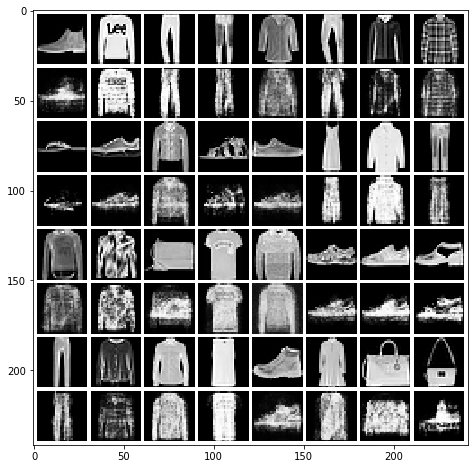

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


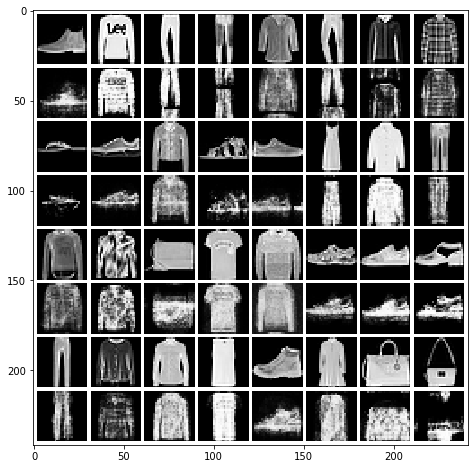

Signal error:
  MSE: 0.048423211478596025, std: 0.032317958143771294
  MAE: 0.11885202466615175, std: 0.04708939674710141
  SSIM: 0.4914557301085231, std: 0.18875438928949173
  Sharpness: 0.1767683332542975, std: 0.051992992175715826
  PhCo-MSE: 0.05612659910997427, std: 0.058762220680442456
  PhCo-MAE: 0.1299014417046654, std: 0.07797425431217621
  PhCo-SSIM: 0.4894691686383008, std: 0.20768868368573662
  CroCo-MSE: 0.0343886453884564, std: 0.018533122530269924
  CroCo-MAE: 0.10127760321890009, std: 0.03378077863567699
  CroCo-SSIM: 0.5677667257650918, std: 0.15295247887243324

Magnitude error:
  MSE Magnitude: 4.21837327506843, std: 3.130206752948354

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.04842 | 0.1189 | 0.4915 | 0.1768 | 0.05613 | 0.1299 | 0.4895 | 0.03439 | 0.1013 | 0.5678 | 4.218 |
Load latent opts with ts of 32 and gs of 1024


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


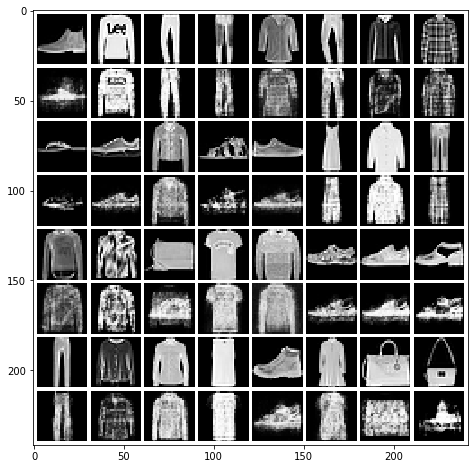

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


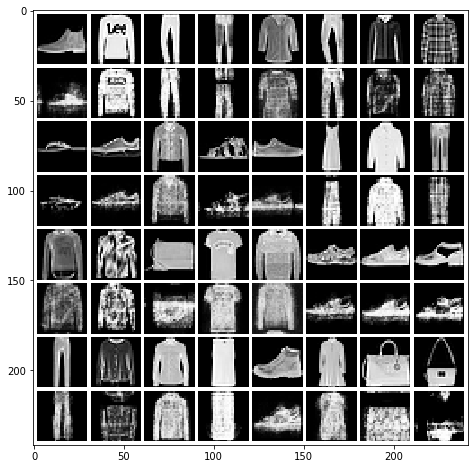

Signal error:
  MSE: 0.04842416441377261, std: 0.03349243770389622
  MAE: 0.11800254660003967, std: 0.04823062071838852
  SSIM: 0.49418613084522955, std: 0.193642614074951
  Sharpness: 0.17569657266361244, std: 0.0534952171610894
  PhCo-MSE: 0.05267966187886465, std: 0.04906932440085058
  PhCo-MAE: 0.12543950542891302, std: 0.06886999540083091
  PhCo-SSIM: 0.4975337628001508, std: 0.2078145622498311
  CroCo-MSE: 0.033610109130613935, std: 0.01866185283658007
  CroCo-MAE: 0.09947857277195092, std: 0.033956474887020915


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.5756617097677235, std: 0.1564577060811649

Magnitude error:
  MSE Magnitude: 3.5986386034676894, std: 2.9589621974168043

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.04842 | 0.1180 | 0.4942 | 0.1757 | 0.05268 | 0.1254 | 0.4975 | 0.03361 | 0.09948 | 0.5757 | 3.599 |
Load latent opts with ts of 32 and gs of 2048


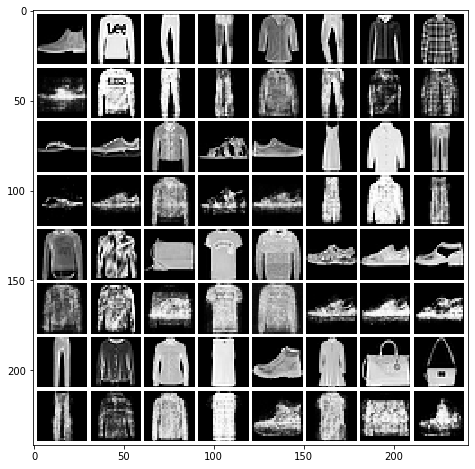

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


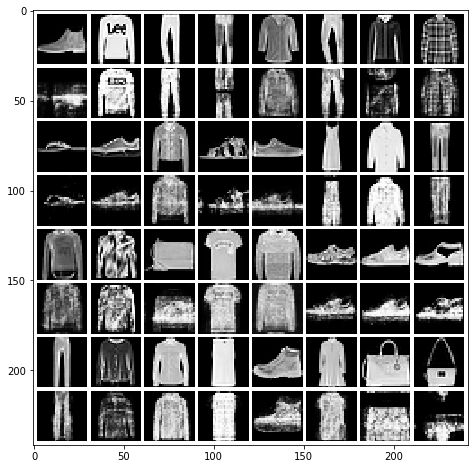

Signal error:
  MSE: 0.04865933028317794, std: 0.03398083202738362
  MAE: 0.11773346303624735, std: 0.048599348372526885
  SSIM: 0.4943341720200376, std: 0.1948487638234443
  Sharpness: 0.17442387349485794, std: 0.054093787296399194
  PhCo-MSE: 0.05465578890272044, std: 0.05661406449212109
  PhCo-MAE: 0.12695038879685483, std: 0.07686281461168958
  PhCo-SSIM: 0.49786806856821353, std: 0.21140478648625233
  CroCo-MSE: 0.033832939443322434, std: 0.01962441922644903
  CroCo-MAE: 0.09906283590548776, std: 0.034596205547348824


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.5764437352504798, std: 0.15740498655632632

Magnitude error:
  MSE Magnitude: 3.537440157452542, std: 2.9954122003802737

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.04866 | 0.1177 | 0.4943 | 0.1744 | 0.05466 | 0.1270 | 0.4979 | 0.03383 | 0.09906 | 0.5764 | 3.537 |
Load latent opts with ts of 64 and gs of 512


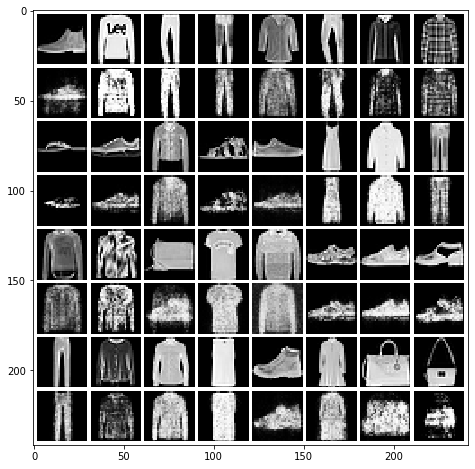

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


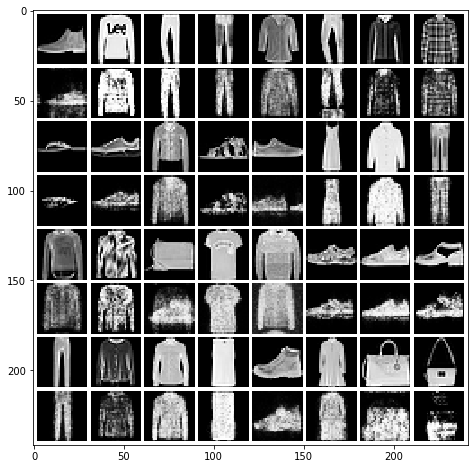

Signal error:
  MSE: 0.04409623534630254, std: 0.032575774365519825
  MAE: 0.11180297522158497, std: 0.04933681527057387
  SSIM: 0.5298249215614599, std: 0.20560085771155726
  Sharpness: 0.17363662689861722, std: 0.057663755151284586
  PhCo-MSE: 0.05023483993676832, std: 0.05681686948358104
  PhCo-MAE: 0.12066066030573225, std: 0.07861149565701983
  PhCo-SSIM: 0.5322884857979739, std: 0.22403149806330477
  CroCo-MSE: 0.03182462656883035, std: 0.019555362154012487
  CroCo-MAE: 0.09644125888343855, std: 0.03719583759397535


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.599857682924659, std: 0.16531287893516514

Magnitude error:
  MSE Magnitude: 3.4708698835852836, std: 3.288340700715655

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.04410 | 0.1118 | 0.5298 | 0.1736 | 0.05023 | 0.1207 | 0.5323 | 0.03182 | 0.09644 | 0.5999 | 3.471 |
Load latent opts with ts of 64 and gs of 1024


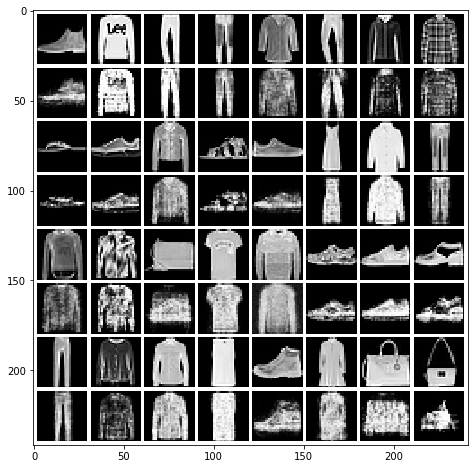

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


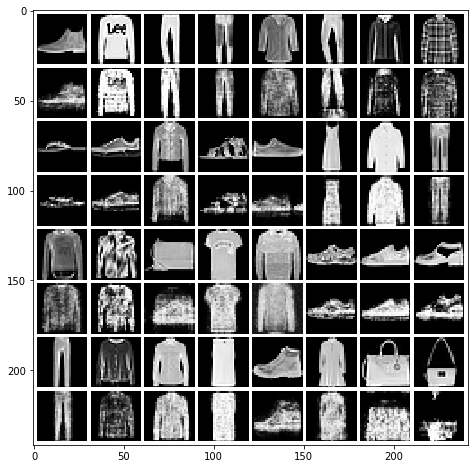

Signal error:
  MSE: 0.042299634600905495, std: 0.0344265753001877
  MAE: 0.10796700008994264, std: 0.050609058369553414
  SSIM: 0.5495370059285601, std: 0.2118427560737028
  Sharpness: 0.16551061794259656, std: 0.059026165780302675
  PhCo-MSE: 0.043506444597759195, std: 0.05111401694983996
  PhCo-MAE: 0.1105983005872285, std: 0.07210034830007503
  PhCo-SSIM: 0.5685484798126705, std: 0.22088962479354232
  CroCo-MSE: 0.028500062025837755, std: 0.018960855342244797
  CroCo-MAE: 0.09041934715463382, std: 0.036232353105373954


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.6289802941260939, std: 0.16722578956778975

Magnitude error:
  MSE Magnitude: 2.0470455235937015, std: 2.2707677387376144

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.04230 | 0.1080 | 0.5495 | 0.1655 | 0.04351 | 0.1106 | 0.5685 | 0.02850 | 0.09042 | 0.6290 | 2.047 |
Load latent opts with ts of 64 and gs of 2048


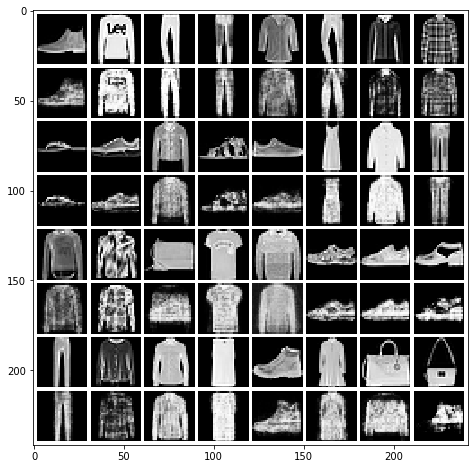

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


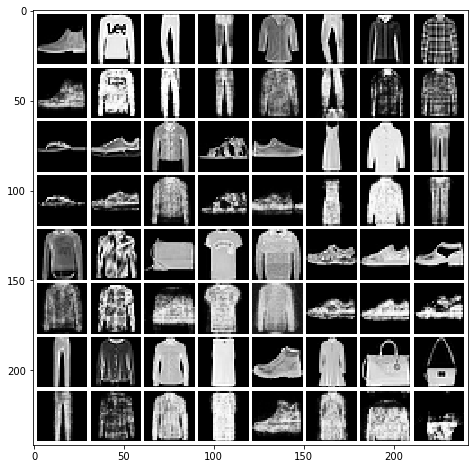

Signal error:
  MSE: 0.04128275928175699, std: 0.03528069374654459
  MAE: 0.10602757035883033, std: 0.0518316124697304
  SSIM: 0.5571357060449987, std: 0.21440389308828375
  Sharpness: 0.16063831818135102, std: 0.05742838834201748
  PhCo-MSE: 0.042219041811839456, std: 0.05102664111440074
  PhCo-MAE: 0.1083140288022337, std: 0.07211863648848302
  PhCo-SSIM: 0.5770277936038906, std: 0.2240406321708711
  CroCo-MSE: 0.027613909294212098, std: 0.0184776730157893
  CroCo-MAE: 0.08856286471823821, std: 0.0358521918040842


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.6352212394152679, std: 0.16682223794734888

Magnitude error:
  MSE Magnitude: 2.215765159870693, std: 2.4337801132521495

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.04128 | 0.1060 | 0.5571 | 0.1606 | 0.04222 | 0.1083 | 0.5770 | 0.02761 | 0.08856 | 0.6352 | 2.216 |
Load latent opts with ts of 128 and gs of 512


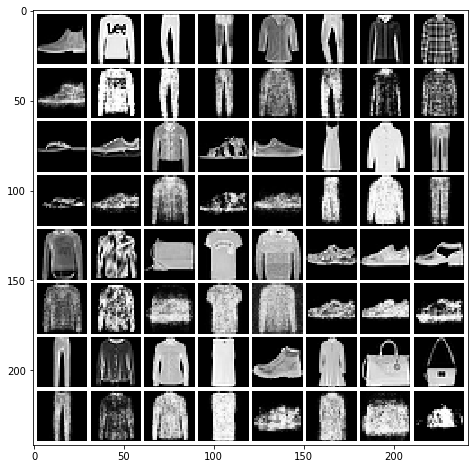

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


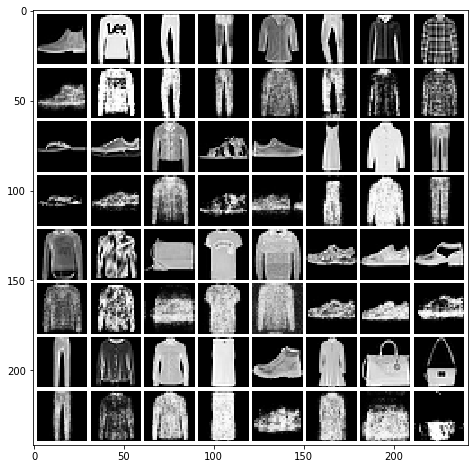

Signal error:
  MSE: 0.041415395672355935, std: 0.03312913272006559
  MAE: 0.10638238835593211, std: 0.04868073800817088
  SSIM: 0.5571921559880528, std: 0.2016151568204504
  Sharpness: 0.16859705950095202, std: 0.05908186063465399
  PhCo-MSE: 0.04640664626005031, std: 0.05432115416282165
  PhCo-MAE: 0.1137968275204501, std: 0.07580865381122374
  PhCo-SSIM: 0.5577098130536583, std: 0.2244384691114441
  CroCo-MSE: 0.029812025578427, std: 0.01989637978082224
  CroCo-MAE: 0.09175039831122807, std: 0.03677853125719345


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.6205215323570747, std: 0.16750800753203499

Magnitude error:
  MSE Magnitude: 3.0487929937714218, std: 2.8987828103376976

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.04142 | 0.1064 | 0.5572 | 0.1686 | 0.04641 | 0.1138 | 0.5577 | 0.02981 | 0.09175 | 0.6205 | 3.049 |
Load latent opts with ts of 128 and gs of 1024


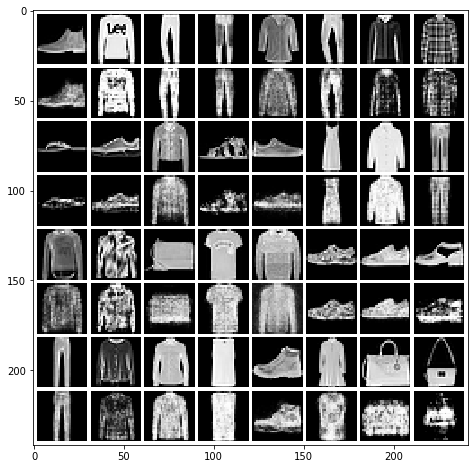

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


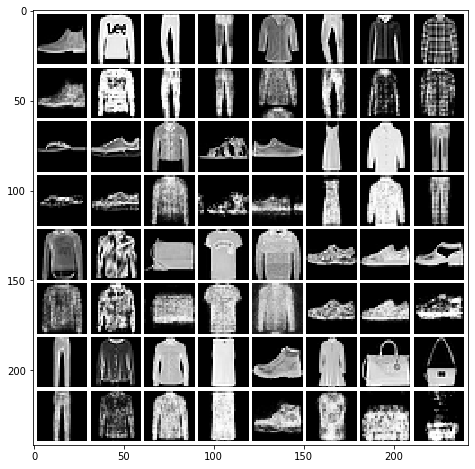

Signal error:
  MSE: 0.03820133918771493, std: 0.033174166055329704
  MAE: 0.10055604928795048, std: 0.04984369754423226
  SSIM: 0.5834895261805431, std: 0.21266233695026057
  Sharpness: 0.15699002744842006, std: 0.06113624445522891
  PhCo-MSE: 0.03580068977396776, std: 0.040750117102632516
  PhCo-MAE: 0.09819226317859961, std: 0.062043030268952366
  PhCo-SSIM: 0.6127105351942281, std: 0.21889255457175802
  CroCo-MSE: 0.02524820083010065, std: 0.018255480961121336
  CroCo-MAE: 0.08392418015151296, std: 0.036580037498116606


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.6602368688488126, std: 0.16950127557648342

Magnitude error:
  MSE Magnitude: 1.5085735151177027, std: 1.7723539798198251

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.03820 | 0.1006 | 0.5835 | 0.1570 | 0.03580 | 0.09819 | 0.6127 | 0.02525 | 0.08392 | 0.6602 | 1.509 |
Load latent opts with ts of 128 and gs of 2048


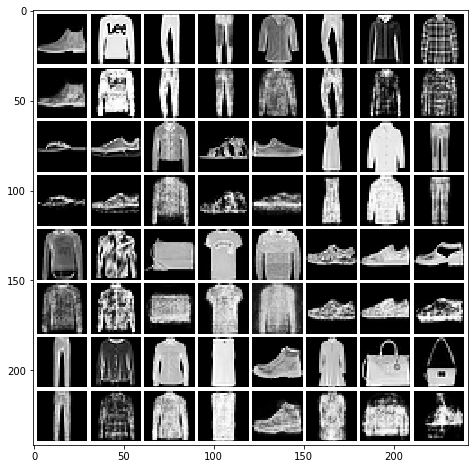

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


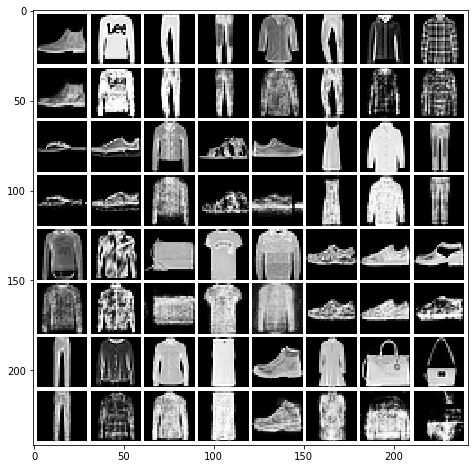

Signal error:
  MSE: 0.03641438340472304, std: 0.031625414391024065
  MAE: 0.09751429040693055, std: 0.048635424754635906
  SSIM: 0.594518830108639, std: 0.21288557717632833
  Sharpness: 0.15079896904963425, std: 0.060694861014521956
  PhCo-MSE: 0.033128802639078365, std: 0.04055533496417753
  PhCo-MAE: 0.09362022965024283, std: 0.060205545325664876
  PhCo-SSIM: 0.6307932195945198, std: 0.21510904802104908
  CroCo-MSE: 0.023648085814604935, std: 0.01761145834825905
  CroCo-MAE: 0.08090398902026724, std: 0.03645730326204405


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.6734744509417978, std: 0.17107235305500929

Magnitude error:
  MSE Magnitude: 1.2702633890264905, std: 1.6133904192094335

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.03641 | 0.09751 | 0.5945 | 0.1508 | 0.03313 | 0.09362 | 0.6308 | 0.02365 | 0.08090 | 0.6735 | 1.270 |
Load latent opts with ts of 256 and gs of 512


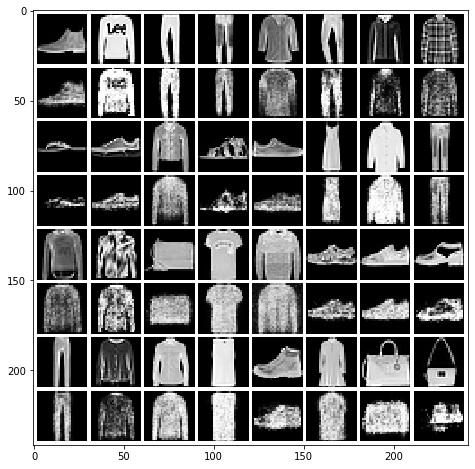

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


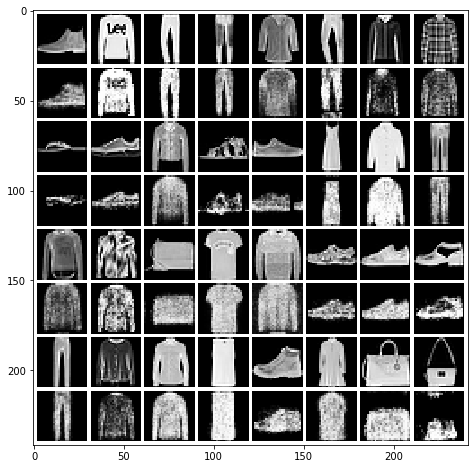

Signal error:
  MSE: 0.04007901415533423, std: 0.03198735636202253
  MAE: 0.10393077559987307, std: 0.047221442524982844
  SSIM: 0.5639052205814908, std: 0.19986918423626931
  Sharpness: 0.1686258136386243, std: 0.057808346067410595
  PhCo-MSE: 0.04422853495252098, std: 0.04901171614782282
  PhCo-MAE: 0.11047694909905048, std: 0.06988054249400856
  PhCo-SSIM: 0.5632183145789122, std: 0.21674794096136782
  CroCo-MSE: 0.029412668985305597, std: 0.018890435505202797
  CroCo-MAE: 0.09072125994595145, std: 0.03531986773015263


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.6222506932467379, std: 0.1619150082282849

Magnitude error:
  MSE Magnitude: 3.0611393606148045, std: 2.5417334869104504

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.04008 | 0.1039 | 0.5639 | 0.1686 | 0.04423 | 0.1105 | 0.5632 | 0.02941 | 0.09072 | 0.6223 | 3.061 |
Load latent opts with ts of 256 and gs of 1024


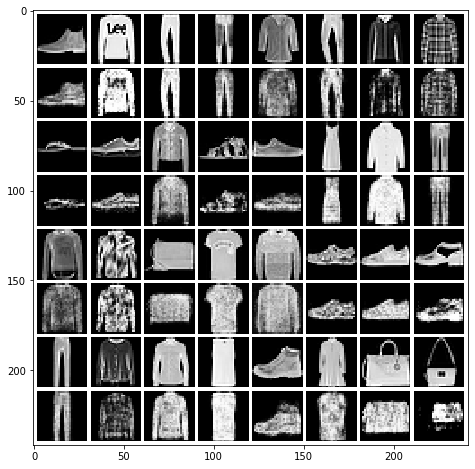

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


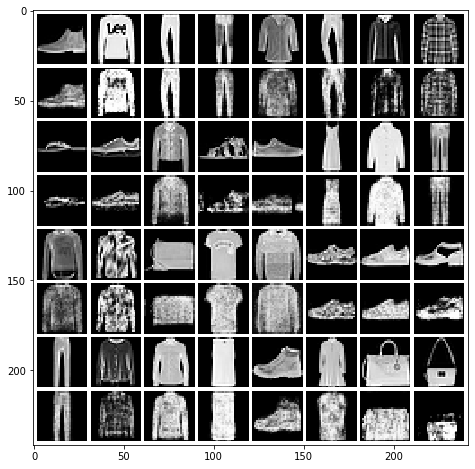

Signal error:
  MSE: 0.03529818692441287, std: 0.031113667685023143
  MAE: 0.09612790529292958, std: 0.04806229293485384
  SSIM: 0.6024378228010951, std: 0.20980045042869358
  Sharpness: 0.15397691329216273, std: 0.060641290370518394
  PhCo-MSE: 0.03341856203664083, std: 0.04012023578222508
  PhCo-MAE: 0.09439921069924018, std: 0.06032206205258008
  PhCo-SSIM: 0.6281241834664624, std: 0.2116172621087583
  CroCo-MSE: 0.024147663055131673, std: 0.017471091066820675
  CroCo-MAE: 0.08165648042180759, std: 0.035740112741840344


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.6702038843152672, std: 0.16650963527764603

Magnitude error:
  MSE Magnitude: 1.3320672421659299, std: 1.4056128973516648

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.03530 | 0.09613 | 0.6024 | 0.1540 | 0.03342 | 0.09440 | 0.6281 | 0.02415 | 0.08166 | 0.6702 | 1.332 |
Load latent opts with ts of 256 and gs of 2048


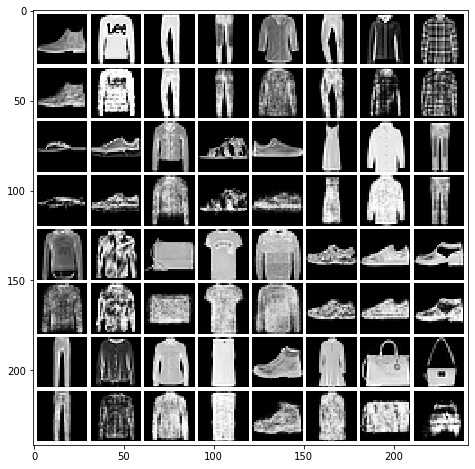

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


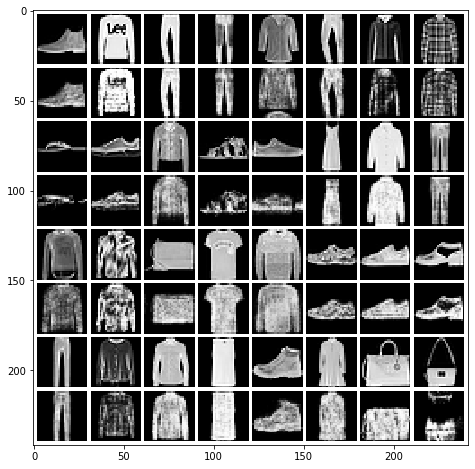

Signal error:
  MSE: 0.03241757164331393, std: 0.03085591859186472
  MAE: 0.09037211748351878, std: 0.04902560939735592
  SSIM: 0.6295431675773089, std: 0.2158305326526473
  Sharpness: 0.14290556759417813, std: 0.06190398251904392
  PhCo-MSE: 0.027035202280702032, std: 0.030489990218573567
  PhCo-MAE: 0.0840863546133414, std: 0.05251927314919277
  PhCo-SSIM: 0.6699404791203467, std: 0.20765766960329873
  CroCo-MSE: 0.02094418795636763, std: 0.016985775505986234
  CroCo-MAE: 0.0752832637498032, std: 0.03637567706296379


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.7026858155248517, std: 0.16758993079689272

Magnitude error:
  MSE Magnitude: 0.7596953555704122, std: 0.9645775340542573

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.03242 | 0.09037 | 0.6295 | 0.1429 | 0.02704 | 0.08409 | 0.6699 | 0.02094 | 0.07528 | 0.7027 | 0.7597 |
Load latent opts with ts of 512 and gs of 512


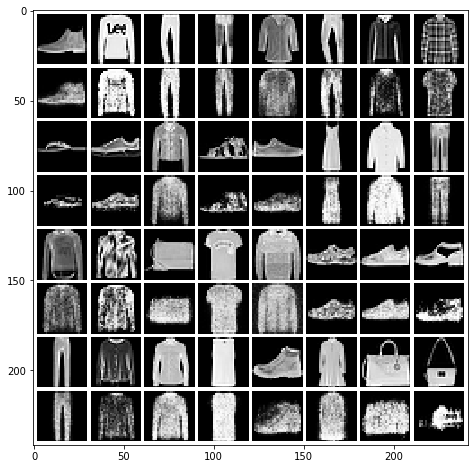

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


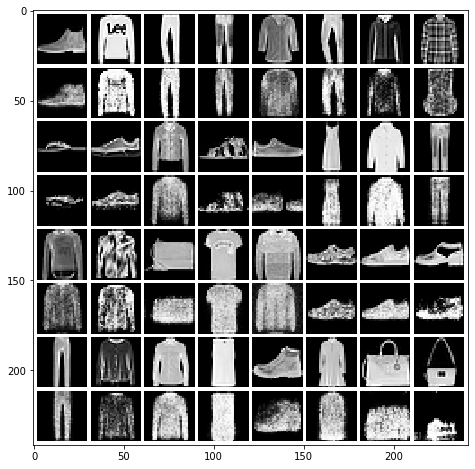

Signal error:
  MSE: 0.03967991565146997, std: 0.03215967243270787
  MAE: 0.10332262503072376, std: 0.047574335559543275
  SSIM: 0.5673684486803471, std: 0.1983027438916888
  Sharpness: 0.16822801446455332, std: 0.05839141788565286
  PhCo-MSE: 0.043335828535038395, std: 0.04820904119484169
  PhCo-MAE: 0.10913648494453046, std: 0.06776632443359762
  PhCo-SSIM: 0.5657122779036818, std: 0.21520552179345173
  CroCo-MSE: 0.02949115064959717, std: 0.01940588725764735
  CroCo-MAE: 0.09062839740889403, std: 0.035569627102021065


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.6211255324044863, std: 0.16192680785450114

Magnitude error:
  MSE Magnitude: 3.4588526399804835, std: 2.8498397382913776

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.03968 | 0.1033 | 0.5674 | 0.1682 | 0.04334 | 0.1091 | 0.5657 | 0.02949 | 0.09063 | 0.6211 | 3.459 |
Load latent opts with ts of 512 and gs of 1024


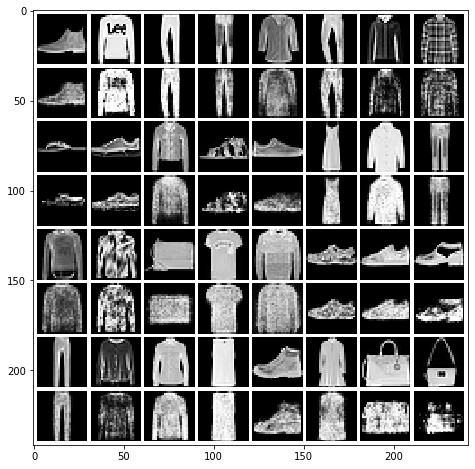

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


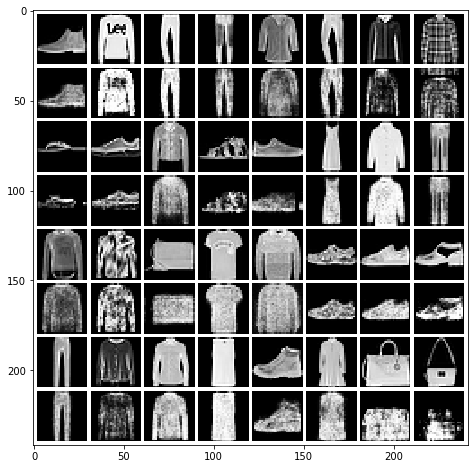

Signal error:
  MSE: 0.03534353345750846, std: 0.03332849038820456
  MAE: 0.09585879471669023, std: 0.050118927977439
  SSIM: 0.6081343250261548, std: 0.21068046133471288
  Sharpness: 0.15463648582817519, std: 0.06007138340536754
  PhCo-MSE: 0.03379675068948719, std: 0.040914519061327724
  PhCo-MAE: 0.09469143585090187, std: 0.060521473362993766
  PhCo-SSIM: 0.6261095273299647, std: 0.2117333193748236
  CroCo-MSE: 0.024295634728420654, std: 0.017609842169055683
  CroCo-MAE: 0.0817316219929522, std: 0.035697084562654836


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.6693991972906703, std: 0.1682132271750294

Magnitude error:
  MSE Magnitude: 1.4850750055696458, std: 1.521461331540872

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.03534 | 0.09586 | 0.6081 | 0.1546 | 0.03380 | 0.09469 | 0.6261 | 0.02430 | 0.08173 | 0.6694 | 1.485 |
Load latent opts with ts of 512 and gs of 2048


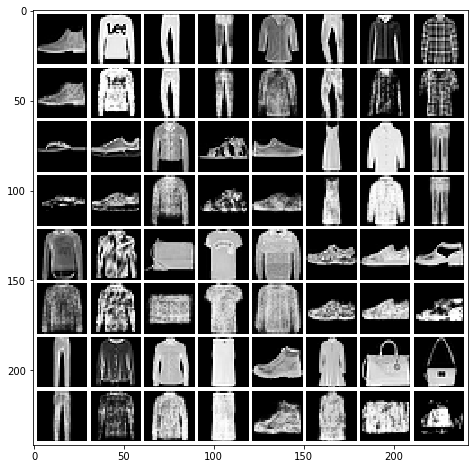

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


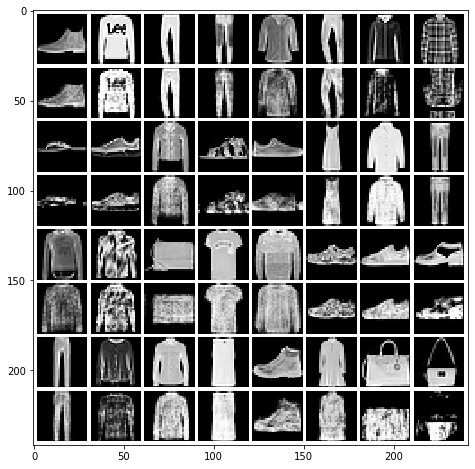

Signal error:
  MSE: 0.03185255875409, std: 0.03206036634949108
  MAE: 0.08900633053118653, std: 0.05016254234466654
  SSIM: 0.6367656679141022, std: 0.2190463556365327
  Sharpness: 0.1424104792146344, std: 0.06253706158972254
  PhCo-MSE: 0.027218136401256966, std: 0.03289021298299426
  PhCo-MAE: 0.08368025488967865, std: 0.05428583009113684
  PhCo-SSIM: 0.6740690386567596, std: 0.20782157176533306
  CroCo-MSE: 0.020713746492288868, std: 0.016932305435988393
  CroCo-MAE: 0.07439530399303602, std: 0.03616012998486567


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.7066168384281, std: 0.16727946889773934

Magnitude error:
  MSE Magnitude: 0.7674667097677778, std: 0.9064065924551361

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.03185 | 0.08901 | 0.6368 | 0.1424 | 0.02722 | 0.08368 | 0.6741 | 0.02071 | 0.07440 | 0.7066 | 0.7675 |
Load latent opts with ts of 1000 and gs of 512


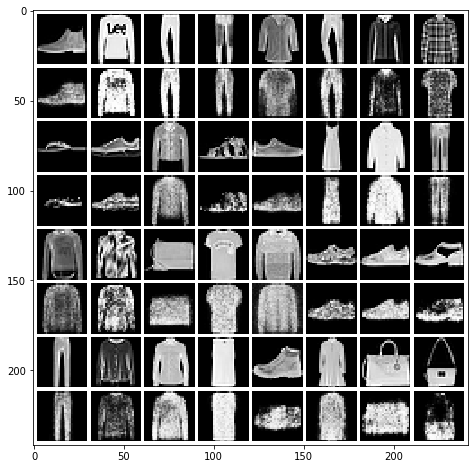

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


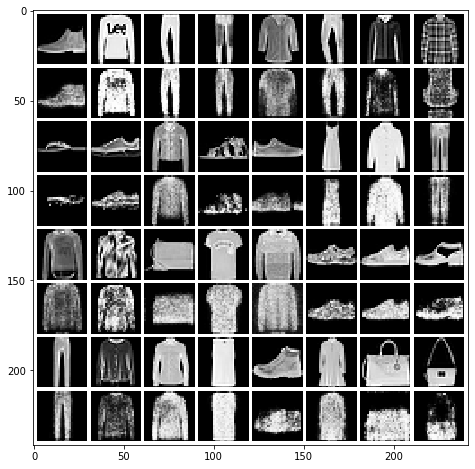

Signal error:
  MSE: 0.0373214883998191, std: 0.029653880242281723
  MAE: 0.09974923173826508, std: 0.04491286874507247
  SSIM: 0.5809583213650944, std: 0.19649776412243408
  Sharpness: 0.16391633323785917, std: 0.0575334285509131
  PhCo-MSE: 0.04121047083498667, std: 0.04634791968934812
  PhCo-MAE: 0.10576481827857273, std: 0.06622559556596545
  PhCo-SSIM: 0.5787898562655195, std: 0.21465830890261334
  CroCo-MSE: 0.028112857295376173, std: 0.01871588415273491
  CroCo-MAE: 0.08812423047229989, std: 0.03488591882604975


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.6340567239831432, std: 0.16125554152419297

Magnitude error:
  MSE Magnitude: 3.174672524759443, std: 2.5763872782422523

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.03732 | 0.09975 | 0.5810 | 0.1639 | 0.04121 | 0.1058 | 0.5788 | 0.02811 | 0.08812 | 0.6341 | 3.175 |
Load latent opts with ts of 1000 and gs of 1024


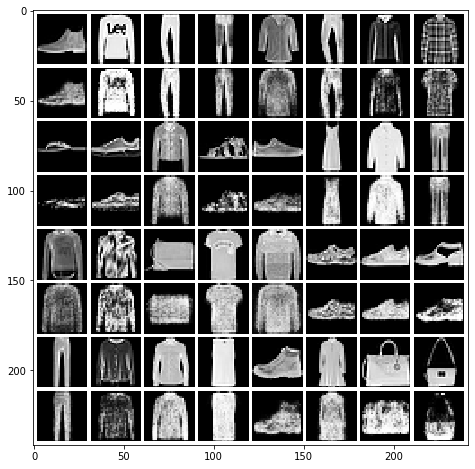

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


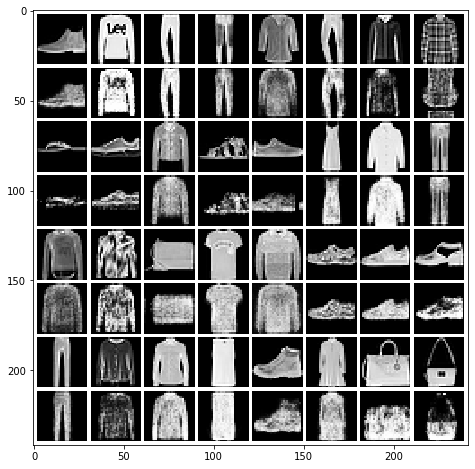

Signal error:
  MSE: 0.03285808691269061, std: 0.028550656186280752
  MAE: 0.09205780518356005, std: 0.04494476097818471
  SSIM: 0.6176921199897936, std: 0.20245993342245053
  Sharpness: 0.15153918898211224, std: 0.058395765906567976
  PhCo-MSE: 0.03125968849069349, std: 0.03748853813712611
  PhCo-MAE: 0.09050223473675131, std: 0.05555773966598095
  PhCo-SSIM: 0.6391057982577399, std: 0.20437200045387824
  CroCo-MSE: 0.023647656602084424, std: 0.017144549287040674
  CroCo-MAE: 0.08012805133527247, std: 0.03440981436004446


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.6751997981105538, std: 0.1628968162761528

Magnitude error:
  MSE Magnitude: 1.6520969179318838, std: 1.5357855706038759

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.03286 | 0.09206 | 0.6177 | 0.1515 | 0.03126 | 0.09050 | 0.6391 | 0.02365 | 0.08013 | 0.6752 | 1.652 |
Load latent opts with ts of 1000 and gs of 2048


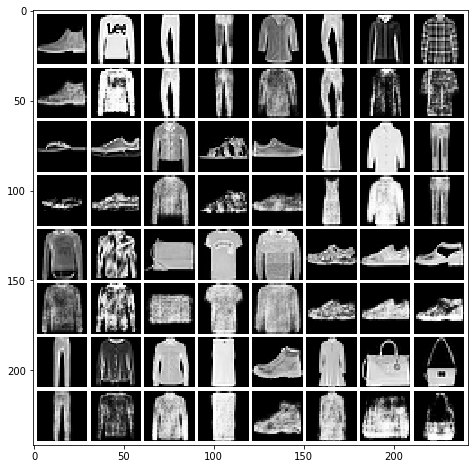

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


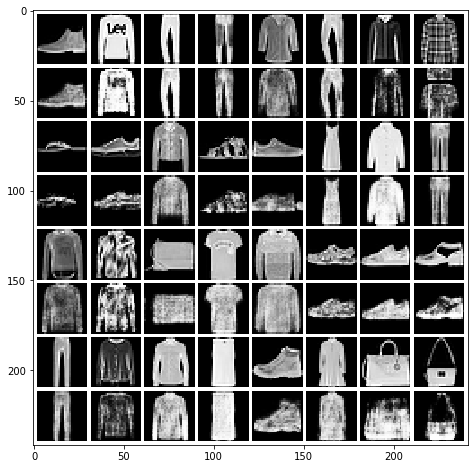

Signal error:
  MSE: 0.030391987492844216, std: 0.027619838579923964
  MAE: 0.087563192803121, std: 0.04477832123415556
  SSIM: 0.6367262755309718, std: 0.20647400753495698
  Sharpness: 0.14011550122583866, std: 0.05989655071254364
  PhCo-MSE: 0.027678318213213236, std: 0.033608948602325654
  PhCo-MAE: 0.08488163164602464, std: 0.05523320733463691
  PhCo-SSIM: 0.6655765790842052, std: 0.20708131929954807
  CroCo-MSE: 0.021064006557175923, std: 0.016987025956545145
  CroCo-MAE: 0.07517550546673814, std: 0.03547166193691851


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.6991682525236032, std: 0.16673566012505964

Magnitude error:
  MSE Magnitude: 1.2347091960574312, std: 1.1645269038091481

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.03039 | 0.08756 | 0.6367 | 0.1401 | 0.02768 | 0.08488 | 0.6656 | 0.02106 | 0.07518 | 0.6992 | 1.235 |
Load latent opts with ts of 2000 and gs of 512


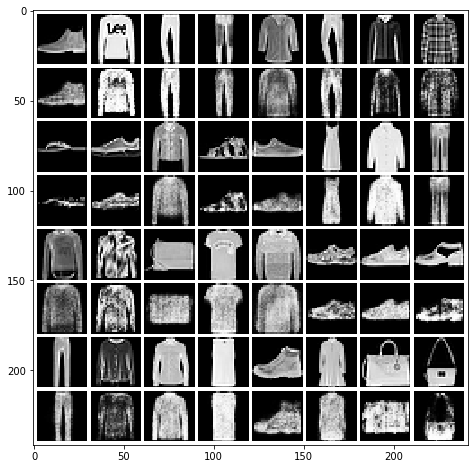

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


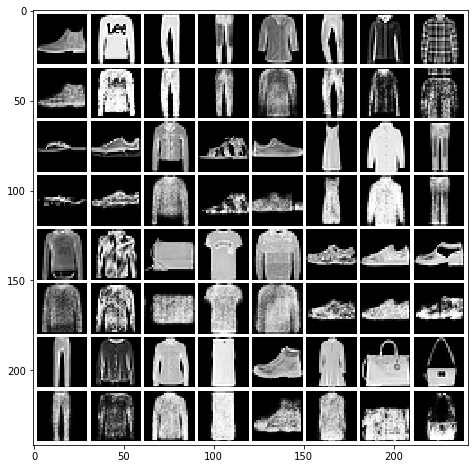

Signal error:
  MSE: 0.03171140655839862, std: 0.02769545545790359
  MAE: 0.09038829427576926, std: 0.04366914505415132
  SSIM: 0.6233304800584093, std: 0.19694175433001024
  Sharpness: 0.15012940173890663, std: 0.057299370291682146
  PhCo-MSE: 0.03186095489828637, std: 0.038133468479602466
  PhCo-MAE: 0.0914550216934297, std: 0.057375334194943665
  PhCo-SSIM: 0.6369372153436563, std: 0.2070248528708084
  CroCo-MSE: 0.023413100072001335, std: 0.016718630114159982
  CroCo-MAE: 0.07964707205693315, std: 0.03389935175859711


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.6758026253716887, std: 0.16054920267044592

Magnitude error:
  MSE Magnitude: 2.1868986527310006, std: 1.6381817143985675

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.03171 | 0.09039 | 0.6233 | 0.1501 | 0.03186 | 0.09146 | 0.6369 | 0.02341 | 0.07965 | 0.6758 | 2.187 |
Load latent opts with ts of 2000 and gs of 1024


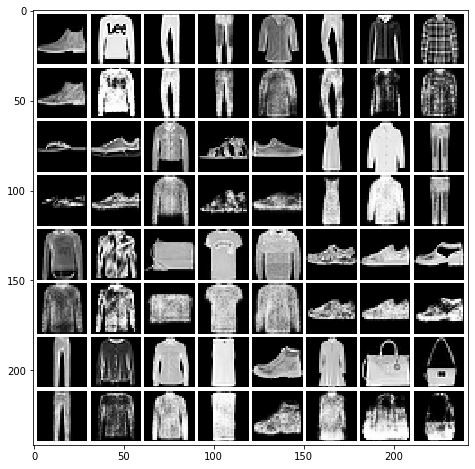

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


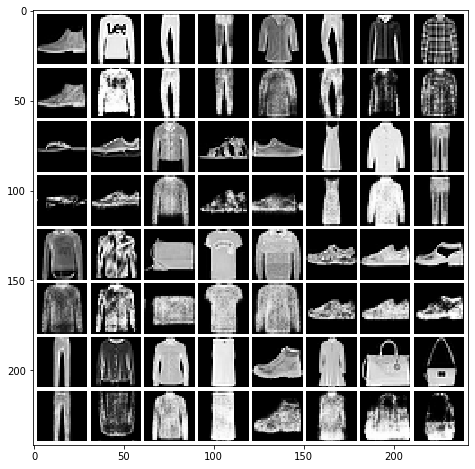

Signal error:
  MSE: 0.028476415634004437, std: 0.02539366806825595
  MAE: 0.08438857621427381, std: 0.04312100384993304
  SSIM: 0.6517131733673991, std: 0.20096267974070542
  Sharpness: 0.13884971950791536, std: 0.05991066013433531
  PhCo-MSE: 0.02691652949082332, std: 0.03286981186265462
  PhCo-MAE: 0.08305398790111469, std: 0.05389537098418962
  PhCo-SSIM: 0.6732366398373749, std: 0.2090251019635548
  CroCo-MSE: 0.02045203405648356, std: 0.016407245098747563
  CroCo-MAE: 0.07369054714915058, std: 0.03495429563806051
  CroCo-SSIM: 0.70608262016602, std: 0.16727126121552913

Magnitude error:
  MSE Magnitude: 1.2387886355788673, std: 1.0752118360795155

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.02848 | 0.08439 | 0.6517 | 0.1388 | 0.02692 | 0.08305 | 0.6732 | 0.02045 | 0.07369 | 0.7061 | 1.239 |
Load latent opts with ts of 2000 and gs of 2048


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


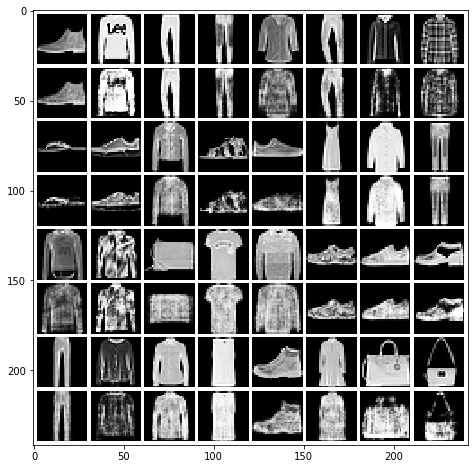

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


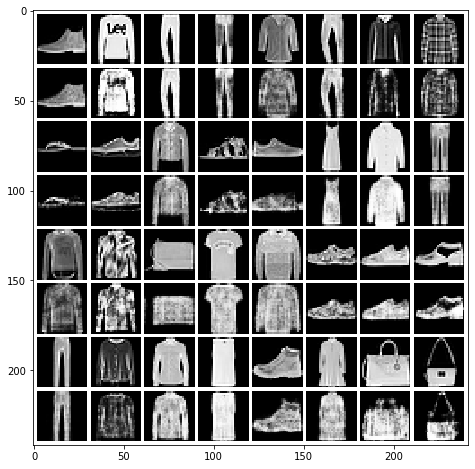

Signal error:
  MSE: 0.02617168832850922, std: 0.025292640421467876
  MAE: 0.07974743312131886, std: 0.04332418365984819
  SSIM: 0.6728595145187836, std: 0.20380364662102743
  Sharpness: 0.13070909435630532, std: 0.061907876430257504
  PhCo-MSE: 0.023484237996187193, std: 0.03142277376381778
  PhCo-MAE: 0.07618649716638294, std: 0.05175327227265884
  PhCo-SSIM: 0.7049486202497319, std: 0.20076440532037096
  CroCo-MSE: 0.018017408577351277, std: 0.01568700474656456
  CroCo-MAE: 0.06854471022552168, std: 0.0348199835045208


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.7307199259726062, std: 0.16497839638738052

Magnitude error:
  MSE Magnitude: 0.7682658856340787, std: 0.7349960662361257

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.02617 | 0.07975 | 0.6729 | 0.1307 | 0.02348 | 0.07619 | 0.7049 | 0.01802 | 0.06854 | 0.7307 | 0.7683 |
Load latent opts with ts of 5000 and gs of 512


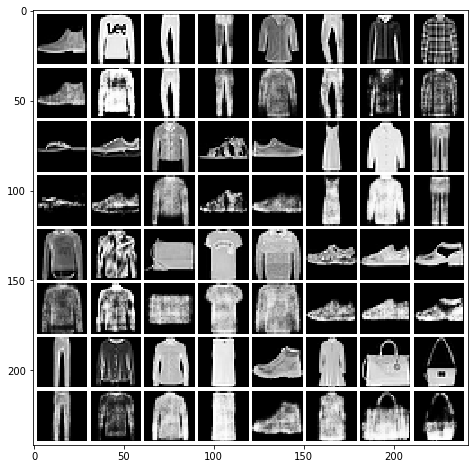

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


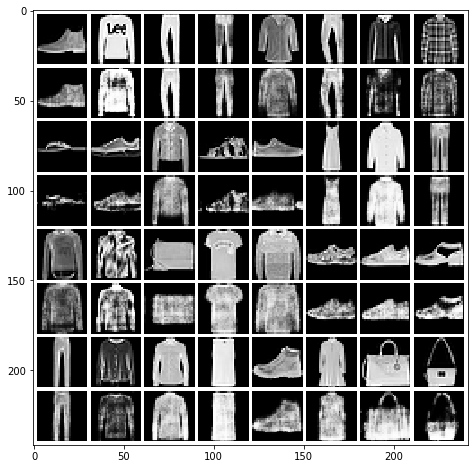

Signal error:
  MSE: 0.02639491152931423, std: 0.0230015783653803
  MAE: 0.08127923637810011, std: 0.040055589395501225
  SSIM: 0.6620815842661156, std: 0.19207898650165395
  Sharpness: 0.1339726560166104, std: 0.05659425962886159
  PhCo-MSE: 0.02509203804814514, std: 0.02945102472371959
  PhCo-MAE: 0.0801533266204742, std: 0.04958637320934834
  PhCo-SSIM: 0.6800676903443441, std: 0.1985199924202862
  CroCo-MSE: 0.019505721589269172, std: 0.014991188563182099
  CroCo-MAE: 0.07195834561301487, std: 0.03292819751462485


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.7117824077765491, std: 0.15851741038546227

Magnitude error:
  MSE Magnitude: 1.641226248224049, std: 1.2399885681696492

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.02639 | 0.08128 | 0.6621 | 0.1340 | 0.02509 | 0.08015 | 0.6801 | 0.01951 | 0.07196 | 0.7118 | 1.641 |
Load latent opts with ts of 5000 and gs of 1024


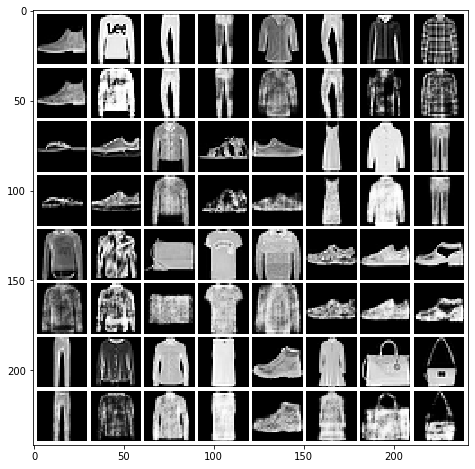

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


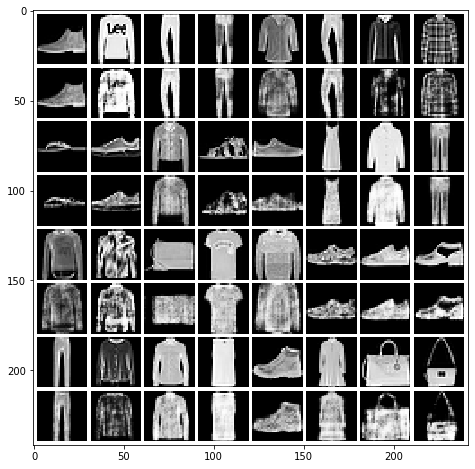

Signal error:
  MSE: 0.02426580276634368, std: 0.023907479769387563
  MAE: 0.0766024822420004, std: 0.0416444161148515
  SSIM: 0.6867422138053746, std: 0.1989520819957666
  Sharpness: 0.12727164757615986, std: 0.060786896109426745
  PhCo-MSE: 0.021282515501719237, std: 0.02548219800510033
  PhCo-MAE: 0.07291478227875825, std: 0.046189733918612134
  PhCo-SSIM: 0.7135620754296437, std: 0.19819355517629067
  CroCo-MSE: 0.0171169741484071, std: 0.015438654809763395
  CroCo-MAE: 0.06673989565640591, std: 0.034342677148587755


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.7384025967357764, std: 0.16327019590041622

Magnitude error:
  MSE Magnitude: 0.8201266143901087, std: 0.6978009675711307

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.02427 | 0.07660 | 0.6867 | 0.1273 | 0.02128 | 0.07291 | 0.7136 | 0.01712 | 0.06674 | 0.7384 | 0.8201 |
Load latent opts with ts of 5000 and gs of 2048


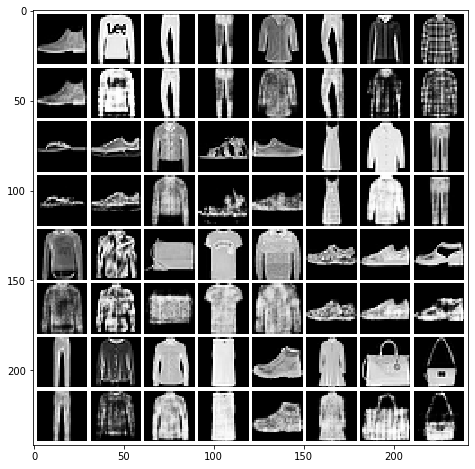

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


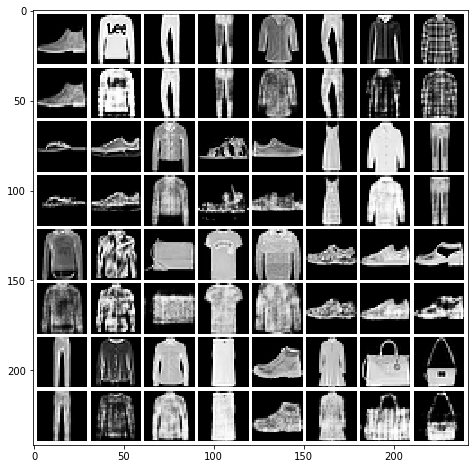

Signal error:
  MSE: 0.02256321084508563, std: 0.023007458421610248
  MAE: 0.07291727763314122, std: 0.04171086627612961
  SSIM: 0.7024983489508525, std: 0.2005715257700825
  Sharpness: 0.11973585760876941, std: 0.06170980943400676
  PhCo-MSE: 0.01829659481064486, std: 0.02184336946930143
  PhCo-MAE: 0.06727536955021651, std: 0.04329315105740117
  PhCo-SSIM: 0.7393044497402589, std: 0.19015524555497806
  CroCo-MSE: 0.01530832968778973, std: 0.014759128557255662
  CroCo-MAE: 0.06255194629405801, std: 0.03449947533850177


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.759616228916747, std: 0.1600881730420414

Magnitude error:
  MSE Magnitude: 0.5233077928762174, std: 0.5030677448838422

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.02256 | 0.07292 | 0.7025 | 0.1197 | 0.01830 | 0.06728 | 0.7393 | 0.01531 | 0.06255 | 0.7596 | 0.5233 |
Load latent opts with ts of 10000 and gs of 512


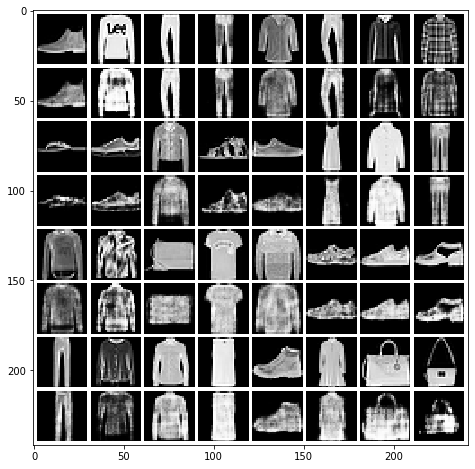

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


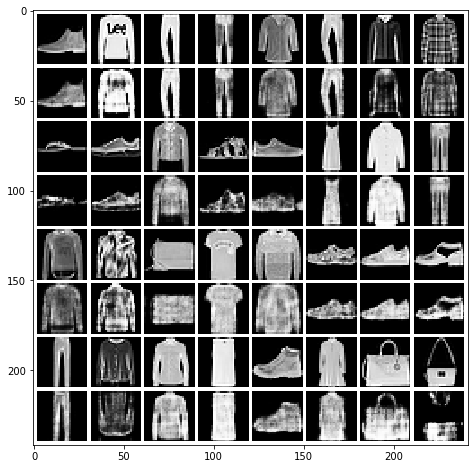

Signal error:
  MSE: 0.02328546326248345, std: 0.02123403947176713
  MAE: 0.07507702379004463, std: 0.03826768364511899
  SSIM: 0.6932055612423691, std: 0.18745960484430188
  Sharpness: 0.12445759656611667, std: 0.05671114656043512
  PhCo-MSE: 0.02058469661473726, std: 0.02381194898918558
  PhCo-MAE: 0.07176627033345237, std: 0.04331255245448012
  PhCo-SSIM: 0.7163135722981983, std: 0.19072668789895805
  CroCo-MSE: 0.016870814669551846, std: 0.014186186757243906
  CroCo-MAE: 0.06608794644492474, std: 0.032258030741198436


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.7407426487258196, std: 0.156480381719401

Magnitude error:
  MSE Magnitude: 1.27917445144547, std: 1.0290384416169676

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.02329 | 0.07508 | 0.6932 | 0.1245 | 0.02058 | 0.07177 | 0.7163 | 0.01687 | 0.06609 | 0.7407 | 1.279 |
Load latent opts with ts of 10000 and gs of 1024


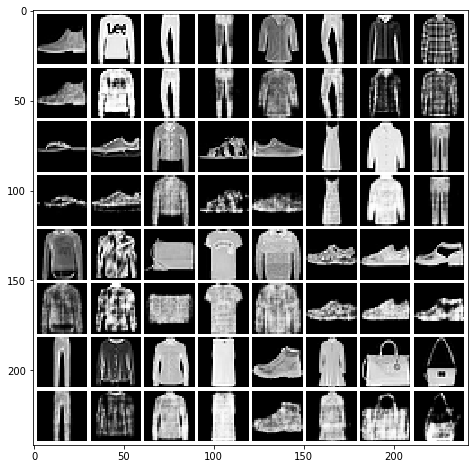

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


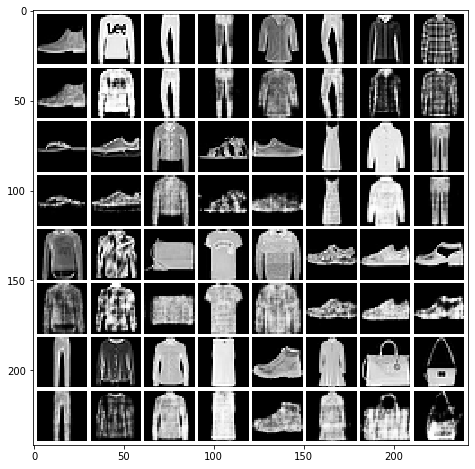

Signal error:
  MSE: 0.022268455319555593, std: 0.02303184553740896
  MAE: 0.07231001250458491, std: 0.041696125251211996
  SSIM: 0.7061055953504605, std: 0.1986172696822486
  Sharpness: 0.11986041404393105, std: 0.06102012728839448
  PhCo-MSE: 0.01838533583802302, std: 0.0244846776872304
  PhCo-MAE: 0.0669487195334724, std: 0.04460968184498107
  PhCo-SSIM: 0.7388923655532772, std: 0.18936335291832185
  CroCo-MSE: 0.015099258773171033, std: 0.014681961218546612
  CroCo-MAE: 0.06202884761918607, std: 0.033779230743162234


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.7601214603505997, std: 0.15892327758212038

Magnitude error:
  MSE Magnitude: 0.6520187910150818, std: 0.5992751912952198

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.02227 | 0.07231 | 0.7061 | 0.1199 | 0.01839 | 0.06695 | 0.7389 | 0.01510 | 0.06203 | 0.7601 | 0.6520 |
Load latent opts with ts of 10000 and gs of 2048


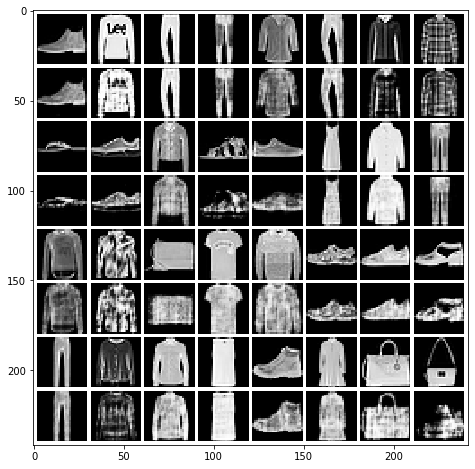

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


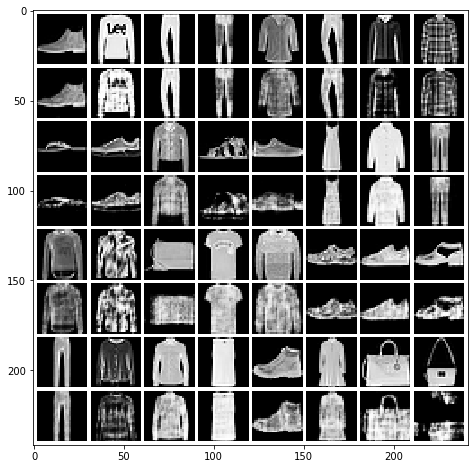

Signal error:
  MSE: 0.021382187706515805, std: 0.023694749554059886
  MAE: 0.06968289767178726, std: 0.043367214466722
  SSIM: 0.7190189920740069, std: 0.20396019637461307
  Sharpness: 0.11436960127576398, std: 0.06378122216682071
  PhCo-MSE: 0.01716426852443205, std: 0.023756334626009314
  PhCo-MAE: 0.0637021704608104, std: 0.045564517482691386
  PhCo-SSIM: 0.7569511368758977, std: 0.19371239862706366
  CroCo-MSE: 0.014076671239152419, std: 0.015059538334663771
  CroCo-MAE: 0.059069646636427234, std: 0.035445213783299914


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.7755581288013357, std: 0.16353404242947697

Magnitude error:
  MSE Magnitude: 0.3650979181335716, std: 0.3696093971093425

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.02138 | 0.06968 | 0.7190 | 0.1144 | 0.01716 | 0.06370 | 0.7570 | 0.01408 | 0.05907 | 0.7756 | 0.3651 |
Load latent opts with ts of 30000 and gs of 512


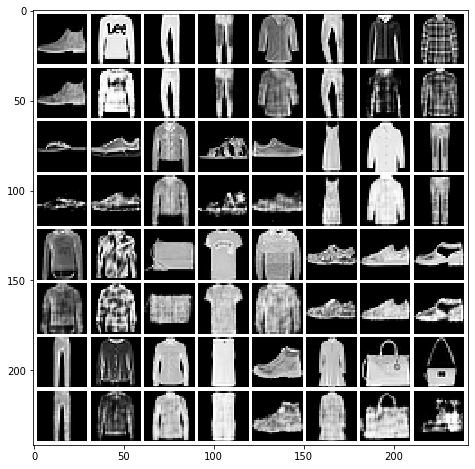

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


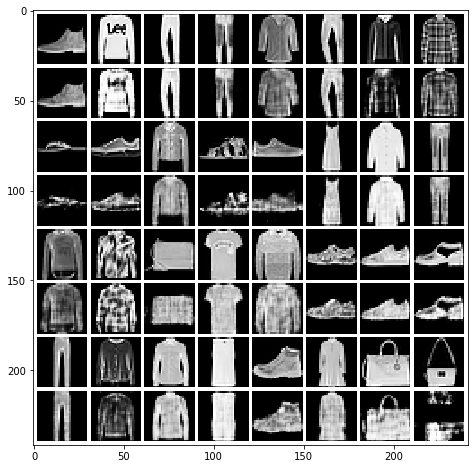

Signal error:
  MSE: 0.020841971412915154, std: 0.023041032689734096
  MAE: 0.06806533374291421, std: 0.04098748299162012
  SSIM: 0.7244185371562339, std: 0.19592600237246904
  Sharpness: 0.11380951532307342, std: 0.05929695144213965
  PhCo-MSE: 0.016790530462432434, std: 0.022200505804854966
  PhCo-MAE: 0.06247992201355737, std: 0.042258542751963474
  PhCo-SSIM: 0.758829304467955, std: 0.18664475442750597
  CroCo-MSE: 0.014076715940166665, std: 0.014613001900369035
  CroCo-MAE: 0.05839975709972217, std: 0.03336046450447361


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.7755465618857225, std: 0.15841149802800492

Magnitude error:
  MSE Magnitude: 0.9456566712761556, std: 0.8816191099296747

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.02084 | 0.06807 | 0.7244 | 0.1138 | 0.01679 | 0.06248 | 0.7588 | 0.01408 | 0.05840 | 0.7755 | 0.9457 |
Load latent opts with ts of 30000 and gs of 1024


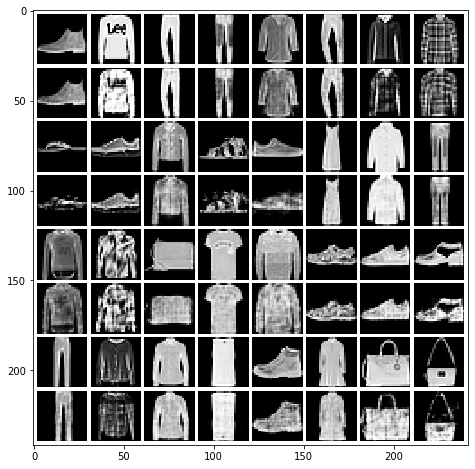

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


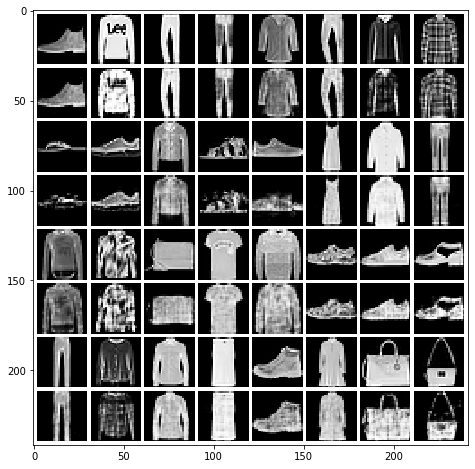

Signal error:
  MSE: 0.01921122040406557, std: 0.022453642989950055
  MAE: 0.06423335047058791, std: 0.04152700694513749
  SSIM: 0.7468284209630893, std: 0.19596426158494187
  Sharpness: 0.10937976132786426, std: 0.06288894480481395
  PhCo-MSE: 0.01466199473924229, std: 0.02081371687416496
  PhCo-MAE: 0.05763201230334049, std: 0.04169257645724301
  PhCo-SSIM: 0.7853380284170413, std: 0.18266067488555496
  CroCo-MSE: 0.01253469714720965, std: 0.014374596767001617
  CroCo-MAE: 0.05438094701301151, std: 0.03434770047944823


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.7988513670738636, std: 0.15905138029246738

Magnitude error:
  MSE Magnitude: 0.4205282602274043, std: 0.410467271464454

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.01921 | 0.06423 | 0.7468 | 0.1094 | 0.01466 | 0.05763 | 0.7853 | 0.01253 | 0.05438 | 0.7989 | 0.4205 |
Load latent opts with ts of 30000 and gs of 2048


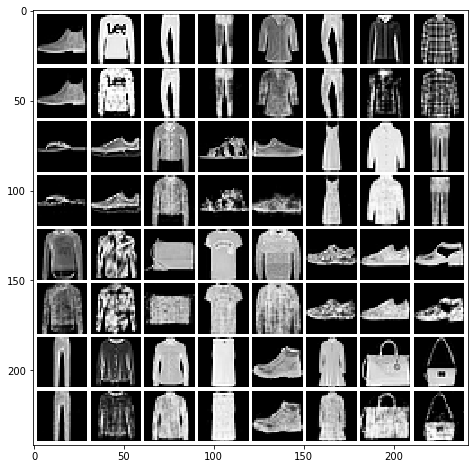

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


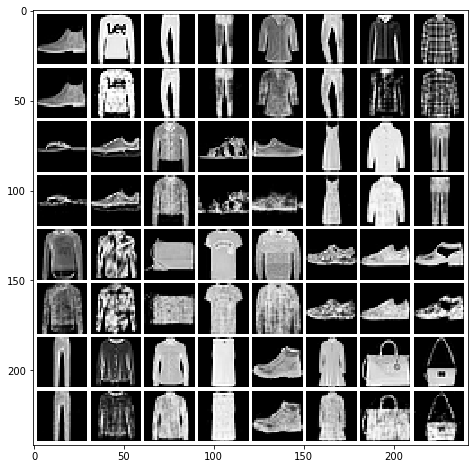

Signal error:
  MSE: 0.017770170578959875, std: 0.02155478867238789
  MAE: 0.060668005507892295, std: 0.04244988924599524
  SSIM: 0.7603436436100768, std: 0.20107690146435087
  Sharpness: 0.10364344009393736, std: 0.06506850418601806
  PhCo-MSE: 0.012873604672369827, std: 0.019427859119177257
  PhCo-MAE: 0.053261724253160316, std: 0.04158194113617841
  PhCo-SSIM: 0.8028032874640956, std: 0.18192910757470923
  CroCo-MSE: 0.011132882382356359, std: 0.013677037195667102
  CroCo-MAE: 0.050552272843069575, std: 0.03477064782573326


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.8146094742539873, std: 0.159480770758816

Magnitude error:
  MSE Magnitude: 0.21993160306206366, std: 0.23324556273500666

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.01777 | 0.06067 | 0.7603 | 0.1036 | 0.01287 | 0.05326 | 0.8028 | 0.01113 | 0.05055 | 0.8146 | 0.2199 |
Load latent opts with ts of 60000 and gs of 512


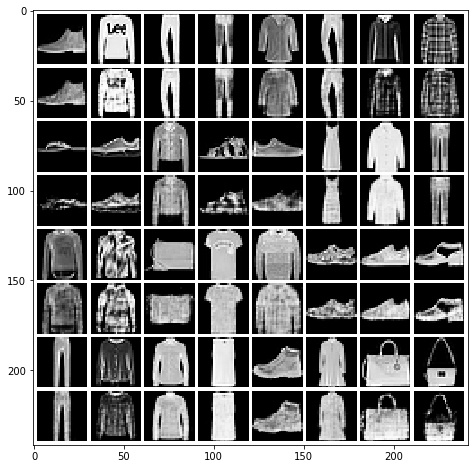

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


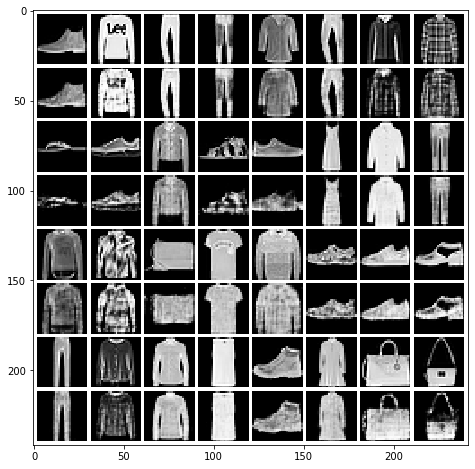

Signal error:
  MSE: 0.018804457377406922, std: 0.02090452522553686
  MAE: 0.0630600163377989, std: 0.03916867925307663
  SSIM: 0.7480836977807168, std: 0.19223592398214626
  Sharpness: 0.10963186261524337, std: 0.06027453239844578
  PhCo-MSE: 0.015577871507840412, std: 0.023352816705607165
  PhCo-MAE: 0.05846463290212283, std: 0.04447557207021352
  PhCo-SSIM: 0.7802058534365747, std: 0.1870500761502226
  CroCo-MSE: 0.012595581589192027, std: 0.013457231185564553
  CroCo-MAE: 0.05394729044263271, std: 0.03235699003678696


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.7980453373470284, std: 0.15366586804590052

Magnitude error:
  MSE Magnitude: 0.8016160844707072, std: 0.7569595996000963

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.01880 | 0.06306 | 0.7481 | 0.1096 | 0.01558 | 0.05846 | 0.7802 | 0.01260 | 0.05395 | 0.7980 | 0.8016 |
Load latent opts with ts of 60000 and gs of 1024


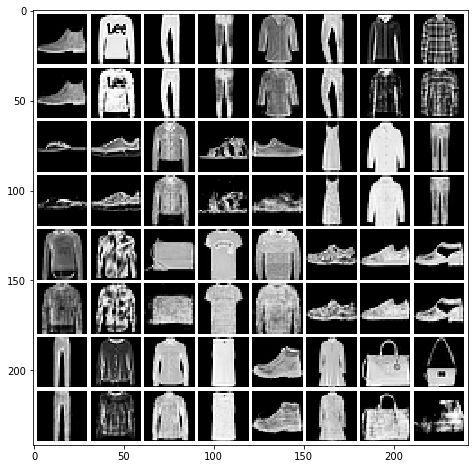

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


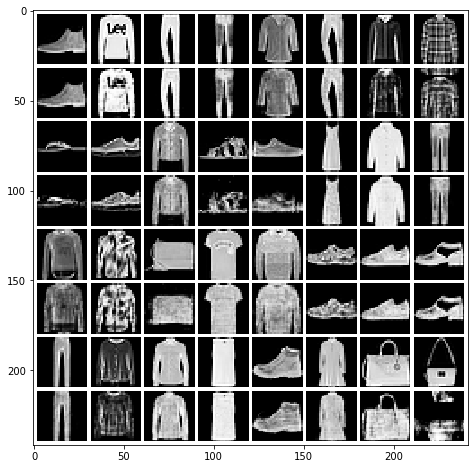

Signal error:
  MSE: 0.01790727618855554, std: 0.021533121406611982
  MAE: 0.06003592442968488, std: 0.041150306612437834
  SSIM: 0.7625567152451882, std: 0.20055794438459237
  Sharpness: 0.10348638850203437, std: 0.06367766813336237
  PhCo-MSE: 0.013329483851287481, std: 0.020711049787063635
  PhCo-MAE: 0.05283418082616645, std: 0.04089745813995577
  PhCo-SSIM: 0.8049283335827743, std: 0.18363188657307944
  CroCo-MSE: 0.011299642798247193, std: 0.013799944937584968
  CroCo-MAE: 0.049925077366415396, std: 0.03390677478247161


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


  CroCo-SSIM: 0.8178771481103183, std: 0.15920095856322106

Magnitude error:
  MSE Magnitude: 0.40100016311200104, std: 0.40097319677640564

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.01791 | 0.06004 | 0.7626 | 0.1035 | 0.01333 | 0.05283 | 0.8049 | 0.01130 | 0.04993 | 0.8179 | 0.4010 |
Load latent opts with ts of 60000 and gs of 2048


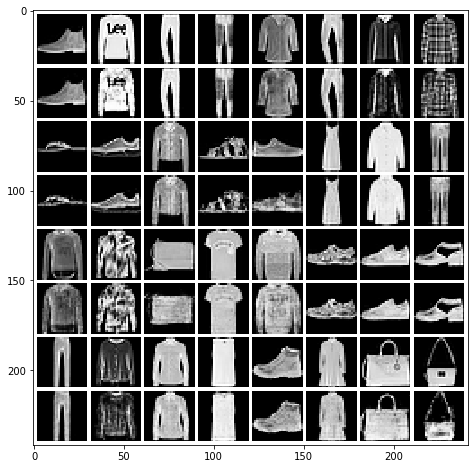

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Registered:


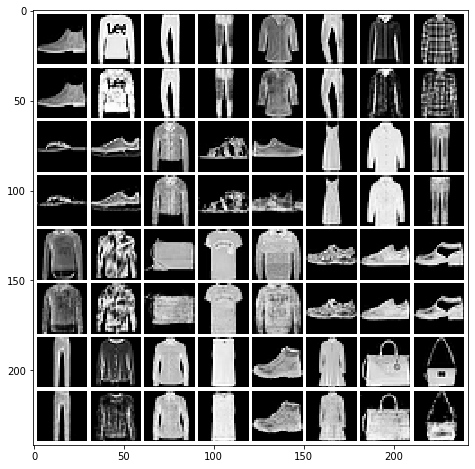

Signal error:
  MSE: 0.01693409691031026, std: 0.02159754645819919
  MAE: 0.05654969484327252, std: 0.042426679372873255
  SSIM: 0.7811961590159262, std: 0.20170889442137016
  Sharpness: 0.09509510782640629, std: 0.06507323116718074
  PhCo-MSE: 0.011184255052876974, std: 0.018128817451690368
  PhCo-MAE: 0.047662148962696015, std: 0.04031138916870986
  PhCo-SSIM: 0.8305034724560565, std: 0.1781025276075105
  CroCo-MSE: 0.00968065835070712, std: 0.01277919706986248
  CroCo-MAE: 0.045266654083387634, std: 0.03377665235430329
  CroCo-SSIM: 0.8405471150842495, std: 0.1560449211340505

Magnitude error:
  MSE Magnitude: 0.20729324016645703, std: 0.21495366442035369

Image constraints:
  Imag part = 0.0 - should be very close to 0
  Real part is in [0.00, 1.00] - should be in [0, 1]

Markdown table values:
 0.01693 | 0.05655 | 0.7812 | 0.09510 | 0.01118 | 0.04766 | 0.8305 | 0.009681 | 0.04527 | 0.8405 | 0.2073 |


In [14]:
### LOAD MODEL ####

train_sizes = [32, 64, 128, 256, 512, 1000, 2000, 5000, 10000, 30000, 60000]
gen_sizes = [512, 1024, 2048]

for ts in train_sizes:
    for gs, ds in zip(gen_sizes, disc_sizes):
        print("Load latent opts with ts of", ts, "and gs of", gs)
        
        name = "FCGenerator{}Fashion_{}_10000latentSteps".format(gs, ts)
        
        out_original = pickle.load(open("/home/shared/phase-retrieval/test/cGAN_Fashion/cgan_original_4_1024.p", "rb"))
        out_results = pickle.load(open("/home/shared/phase-retrieval/test/cGAN_Fashion/" + name + ".sd", "rb"))
        
        # Print predictions #
        to_plot = np.stack([out_original[:32, 0].reshape(4, 8, 28, 28), 
                            out_results[:32, 0].reshape(4, 8, 28, 28)], axis=1).reshape(-1, 1, 28, 28)
        plot_grid(to_plot, figsize=(8,8), file="../out/cgan/fashion/" + name + '.png')
        
        print("Registered:")
        results_reg = register_croco(out_results[:32], test_original[:32])
        to_plot = np.stack([out_original[:32, 0].reshape(4, 8, 28, 28), 
                            results_reg[:, 0].reshape(4, 8, 28, 28)], axis=1).reshape(-1, 1, 28, 28)        
        plot_grid(to_plot, figsize=(8,8), file="../out/cgan/fashion/" + name + '.png')
        
        # Benchmark test predictions #
        benchmark(pred=out_results[:1024], true=out_original[:1024], check_all=True)

## Final Evaluation (1024 samples)

| ts | gs | MSE | MAE | SSIM | SHRP | PhaCo-MSE | PhaCo-MAE | PhaCo-SSIM | CroCo-MSE | CroCo-MAE | CroCo-SSIM | MSE Magn |
| --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- | --- |
| 32 | 512 | 0.04842 | 0.1189 | 0.4915 | 0.1768 | 0.05613 | 0.1299 | 0.4895 | 0.03439 | 0.1013 | 0.5678 | 4.218 |
| 32 | 1024 | 0.04842 | 0.1180 | 0.4942 | 0.1757 | 0.05268 | 0.1254 | 0.4975 | 0.03361 | 0.09948 | 0.5757 | 3.599 |
| 32 | 2048 | 0.04866 | 0.1177 | 0.4943 | 0.1744 | 0.05466 | 0.1270 | 0.4979 | 0.03383 | 0.09906 | 0.5764 | 3.537 |
| 64 | 512 | 0.04410 | 0.1118 | 0.5298 | 0.1736 | 0.05023 | 0.1207 | 0.5323 | 0.03182 | 0.09644 | 0.5999 | 3.471 |
| 64 | 1024 | 0.04230 | 0.1080 | 0.5495 | 0.1655 | 0.04351 | 0.1106 | 0.5685 | 0.02850 | 0.09042 | 0.6290 | 2.047 |
| 64 | 2048 | 0.04128 | 0.1060 | 0.5571 | 0.1606 | 0.04222 | 0.1083 | 0.5770 | 0.02761 | 0.08856 | 0.6352 | 2.216 |
| 128 | 512 | 0.04142 | 0.1064 | 0.5572 | 0.1686 | 0.04641 | 0.1138 | 0.5577 | 0.02981 | 0.09175 | 0.6205 | 3.049 |
| 128 | 1024 | 0.03820 | 0.1006 | 0.5835 | 0.1570 | 0.03580 | 0.09819 | 0.6127 | 0.02525 | 0.08392 | 0.6602 | 1.509 |
| 128 | 2048 | 0.03641 | 0.09751 | 0.5945 | 0.1508 | 0.03313 | 0.09362 | 0.6308 | 0.02365 | 0.08090 | 0.6735 | 1.270 |
| 256 | 512 | 0.04008 | 0.1039 | 0.5639 | 0.1686 | 0.04423 | 0.1105 | 0.5632 | 0.02941 | 0.09072 | 0.6223 | 3.061 |
| 256 | 1024 | 0.03530 | 0.09613 | 0.6024 | 0.1540 | 0.03342 | 0.09440 | 0.6281 | 0.02415 | 0.08166 | 0.6702 | 1.332 |
| 256 | 2048 | 0.03242 | 0.09037 | 0.6295 | 0.1429 | 0.02704 | 0.08409 | 0.6699 | 0.02094 | 0.07528 | 0.7027 | 0.7597 |
| 512 | 512 | 0.03968 | 0.1033 | 0.5674 | 0.1682 | 0.04334 | 0.1091 | 0.5657 | 0.02949 | 0.09063 | 0.6211 | 3.459 |
| 512 | 1024 | 0.03534 | 0.09586 | 0.6081 | 0.1546 | 0.03380 | 0.09469 | 0.6261 | 0.02430 | 0.08173 | 0.6694 | 1.485 |
| 512 | 2048 | 0.03185 | 0.08901 | 0.6368 | 0.1424 | 0.02722 | 0.08368 | 0.6741 | 0.02071 | 0.07440 | 0.7066 | 0.7675 |
| 1000 | 512 | 0.03732 | 0.09975 | 0.5810 | 0.1639 | 0.04121 | 0.1058 | 0.5788 | 0.02811 | 0.08812 | 0.6341 | 3.175 |
| 1000 | 1024 | 0.03286 | 0.09206 | 0.6177 | 0.1515 | 0.03126 | 0.09050 | 0.6391 | 0.02365 | 0.08013 | 0.6752 | 1.652 |
| 1000 | 2048 | 0.03039 | 0.08756 | 0.6367 | 0.1401 | 0.02768 | 0.08488 | 0.6656 | 0.02106 | 0.07518 | 0.6992 | 1.235 |
| 2000 | 512 | 0.03171 | 0.09039 | 0.6233 | 0.1501 | 0.03186 | 0.09146 | 0.6369 | 0.02341 | 0.07965 | 0.6758 | 2.187 |
| 2000 | 1024 | 0.03171 | 0.09039 | 0.6233 | 0.1501 | 0.03186 | 0.09146 | 0.6369 | 0.02341 | 0.07965 | 0.6758 | 2.187 |
| 2000 | 2048 | 0.02617 | 0.07975 | 0.6729 | 0.1307 | 0.02348 | 0.07619 | 0.7049 | 0.01802 | 0.06854 | 0.7307 | 0.7683 |
| 5000 | 512 | 0.02639 | 0.08128 | 0.6621 | 0.1340 | 0.02509 | 0.08015 | 0.6801 | 0.01951 | 0.07196 | 0.7118 | 1.641 |
| 5000 | 1024 | 0.02427 | 0.07660 | 0.6867 | 0.1273 | 0.02128 | 0.07291 | 0.7136 | 0.01712 | 0.06674 | 0.7384 | 0.8201 |
| 5000 | 2048 | 0.02256 | 0.07292 | 0.7025 | 0.1197 | 0.01830 | 0.06728 | 0.7393 | 0.01531 | 0.06255 | 0.7596 | 0.5233 |
| 10000 | 512 | 0.02329 | 0.07508 | 0.6932 | 0.1245 | 0.02058 | 0.07177 | 0.7163 | 0.01687 | 0.06609 | 0.7407 | 1.279 |
| 10000 | 1024 | 0.02227 | 0.07231 | 0.7061 | 0.1199 | 0.01839 | 0.06695 | 0.7389 | 0.01510 | 0.06203 | 0.7601 | 0.6520 |
| 10000 | 2048 | 0.02138 | 0.06968 | 0.7190 | 0.1144 | 0.01716 | 0.06370 | 0.7570 | 0.01408 | 0.05907 | 0.7756 | 0.3651 |
| 30000 | 512 | 0.02084 | 0.06807 | 0.7244 | 0.1138 | 0.01679 | 0.06248 | 0.7588 | 0.01408 | 0.05840 | 0.7755 | 0.9457 |
| 30000 | 1024 | 0.01921 | 0.06423 | 0.7468 | 0.1094 | 0.01466 | 0.05763 | 0.7853 | 0.01253 | 0.05438 | 0.7989 | 0.4205 |
| 30000 | 2048 | 0.01777 | 0.06067 | 0.7603 | 0.1036 | 0.01287 | 0.05326 | 0.8028 | 0.01113 | 0.05055 | 0.8146 | 0.2199 |
| 60000 | 512 | 0.01880 | 0.06306 | 0.7481 | 0.1096 | 0.01558 | 0.05846 | 0.7802 | 0.01260 | 0.05395 | 0.7980 | 0.8016 |
| 60000 | 1024 | 0.01791 | 0.06004 | 0.7626 | 0.1035 | 0.01333 | 0.05283 | 0.8049 | 0.01130 | 0.04993 | 0.8179 | 0.4010 |
| 60000 | 2048 | 0.01693 | 0.05655 | 0.7812 | 0.09510 | 0.01118 | 0.04766 | 0.8305 | 0.009681 | 0.04527 | 0.8405 | 0.2073 |